In [ ]:
from pathlib import Path
import numpy as np
import nibabel as nib
import h5py

from matplotlib import pyplot as plt
import importlib
import utils



In [3]:
from src.utils.data_loading import loadSupervoxelData, loadFlyVRData, getFictracSampsAtVolume
from src.utils.regression import makeRegressionData

# Max data paths

In [7]:
DATA_PATH = Path("/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional")
ANALYSIS_PATH = Path("/Volumes/Charlie's P/Charlie/imaging_analysis")
TRIAL_PATH = ANALYSIS_PATH / "DATA"
TRIAL_PATH.mkdir(exist_ok=True)

In [ ]:
# Gets experiment name and paths
DATA_PATH = Path("/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional")
ANALYSIS_PATH = Path("/Volumes/Charlie's P/Charlie/imaging_analysis")
TRIAL_PATH = ANALYSIS_PATH / "DATA"
TRIAL_PATH.mkdir(exist_ok=True)
experiments = {}
for path in DATA_PATH.glob("**/fictrac"):
    expdir = path.parent
    expname = "_".join(expdir.parts[-2:])
    try:
        supervoxelsPath = next(expdir.glob("**/supervoxels_fda.nii"))
    except StopIteration:
        continue
    experiments[expname] = dict(directory=expdir, supervoxels=supervoxelsPath)

In [9]:
experiments

{'20240612_101': {'directory': PosixPath('/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional/20240612/101'),
  'supervoxels': PosixPath('/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional/20240612/101/20240612_101_func/registration/supervoxels_fda.nii')},
 '20240612_201': {'directory': PosixPath('/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional/20240612/201'),
  'supervoxels': PosixPath('/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional/20240612/201/20240612_201_func/registration/supervoxels_fda.nii')},
 '20240623_101': {'directory': PosixPath('/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional/20240623/101'),
  'supervoxels': PosixPath('/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional/20240623/101/20240623_101_func/registration/supervoxels_fda.nii')},
 '20240623_201': {'directory': PosixPath('/Volumes/murthy/Max/upstairs_imaging/nsyb_actuator_imaging/functional/202406

# Get AOTU and lobula supervoxels

In [10]:
# Read region ROIs
roisFDA = {}
with open(ANALYSIS_PATH / "FDA" / "roisFDA.txt", "r") as f:
    for line in f.readlines():
        i, region = line.strip(",\n").split(":")
        i = int(i)
        region = region.strip(' "')
        roisFDA[i] = region
npil_dict = {v:k for k, v in roisFDA.items()}

In [11]:
# Load FDA
neuropilPath = ANALYSIS_PATH / "FDA" / "20240926_FDA_rois_iso38.nii"
neuropilLabels = nib.load(neuropilPath).get_fdata(dtype=np.float32).astype(np.int32)

In [12]:
neuropilMasks = {}
for neuropil in ("LO_L", "LO_R", "AOTU_L", "AOTU_R"):
    neuropilMasks[neuropil] = neuropilLabels == npil_dict[neuropil]

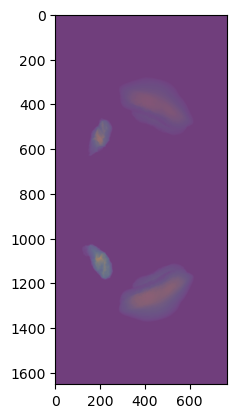

In [13]:
for mask in neuropilMasks.values():
    plt.imshow(mask.sum(axis=2), alpha=0.3)

In [14]:
# xyz coordinates of each voxel in a neuropil
neuropilSparse = {}
for neuropil, mask in neuropilMasks.items():
    neuropilSparse[neuropil] = np.column_stack(np.where(mask))

In [15]:
# Find supervoxels belonging to a given neuropil

def get_neuropil_supervoxels(labels, neuropil):
    svxs = np.unique(labels[tuple(neuropilSparse[neuropil].T)])
    return svxs[svxs > 0]

def get_supervoxel_centroids(labels, svxs):
    flat = labels.flatten()  # flatten supervoxel labels
    indices = np.arange(len(flat))  # raveled indices
    in_svxs = np.isin(flat, svxs)  # find where labels in supervoxels
    flat, indices = flat[in_svxs], indices[in_svxs]

    centroids = []
    for sv in svxs:
        xyz = np.array(np.unravel_index(indices[flat == sv], labels.shape))
        centroids.append(xyz.mean(axis=1))
    return np.array(centroids)

# Don't RUN

In [ ]:
# for name, info in experiments.items():
#     # Create output path
#     print(name)

#     # Load supervoxels
#     supervoxelsPath = info["supervoxels"]
#     supervoxelLabels = nib.load(supervoxelsPath).get_fdata(dtype=np.float32).astype(np.int32)
#     assert neuropilLabels.shape == supervoxelLabels.shape

#     # Get neuropil supervoxels
#     neuropilSupervoxels = {}
#     for neuropil in neuropilMasks.keys():
#         print("\t" + neuropil)
#         svxs = get_neuropil_supervoxels(supervoxelLabels, neuropil)
#         centroids = get_supervoxel_centroids(supervoxelLabels, svxs)
#         neuropilSupervoxels[neuropil] = dict(ids=svxs, centroids=centroids)

#     # Save
#     with h5py.File(TRIAL_PATH / f"{name}.h5", "w") as f:
#         for neuropil, neuropil_info in neuropilSupervoxels.items():
#             grp = f.create_group(neuropil)
#             for k, vals in neuropil_info.items():
#                 grp.create_dataset(k, data=vals)

# Save imaging data

In [16]:
for name, info in experiments.items():
    print(name)
    # Skip analyzed
    skip = False
    with h5py.File(TRIAL_PATH / f"{name}.h5", "r") as f:
        for neuropil, grp in f.items():
            if "timeseries" in grp:
                skip = True
    if skip:
        continue
    # Load data
    allNeuralData, idxToROI, roiToIdx = loadSupervoxelData(str(info["directory"]), getRaw=False)
    # Save neuropil timeseries
    with h5py.File(TRIAL_PATH / f"{name}.h5", "r+") as f:
        for neuropil, grp in f.items():
            neuropil_idxs = [roiToIdx[svx] for svx in grp["ids"][:]]
            neuropil_data = allNeuralData[neuropil_idxs]
            grp.create_dataset("timeseries", data=neuropil_data)

20240612_101
20240612_201
20240623_101
20240623_201
20240704_101
20240610_101
20240610_201
20240606_102
20240606_101
20240606_201
20240606_202
20240618_102
20240618_101
20240618_201
20240620_101
20240620_201
20240605_102
20240605_101
20240629_101
20240629_201
20240629_301
20240609_101
20240530_201
20240617_101
20240617_201
20240617_401
20240617_301
20240611_101
20240611_201
20240625_101
20240625_201


# Save FlyVR data - no need run

In [ ]:
# actuator_data = {}
# for name, info in experiments.items():
#     print(name)
#     # Load data
#     flyvrData = loadFlyVRData(str(info["directory"]))
#     fsav = getFictracSampsAtVolume(flyvrData)  # video sample at volume
#     regressionData = makeRegressionData(
#     flyvrData=flyvrData,
#     cnnData=None,
#     fictracTimestamps=fsav,
#     featureList=[
#         "mfDistZ",
#         "sideSideZ",
#         "mFSZ",
#         "mRSZ"
#     ],
#     fullLen=False  # False -> imaging timebase; True -> fictrac timebase
# )   # flyvr data in imaging timebase
#     actuator_data[name] = regressionData

20240612_101
Loading flyvr data...
Done!
40
[np.int64(83451), np.int64(90141), np.int64(97002), np.int64(103864), np.int64(110725), np.int64(117587), np.int64(124449), np.int64(131310), np.int64(138172), np.int64(145033), np.int64(151895), np.int64(158757), np.int64(165618), np.int64(172480), np.int64(179341), np.int64(186203), np.int64(193065), np.int64(199926), np.int64(206788), np.int64(213650), np.int64(220511), np.int64(227373), np.int64(234235), np.int64(241096), np.int64(247958), np.int64(254820), np.int64(261681), np.int64(268543), np.int64(275405), np.int64(282266), np.int64(289128), np.int64(295990), np.int64(302851), np.int64(309713), np.int64(316575), np.int64(323436), np.int64(330298), np.int64(337160), np.int64(344021), np.int64(350883), np.int64(357745), np.int64(364606), np.int64(371468), np.int64(378330), np.int64(385191), np.int64(392053), np.int64(398915), np.int64(405777), np.int64(412638), np.int64(419500), np.int64(426362), np.int64(433223), np.int64(440085), np.i

In [ ]:
# with open(pkl_path + 'actuator_data.pkl', 'wb') as file:
#     pkl.dump(actuator_data, file)

# Analysis

In [17]:
import pickle as pkl
pkl_path = "/Volumes/Charlie's P/Charlie/imaging_analysis/pkls/"
with open(pkl_path + 'actuator_data.pkl', 'rb') as file:
    actuator_data = pkl.load(file)

In [199]:
gen_data_dir = "../gen_data/"


In [ ]:
with open(gen_data_dir + 'fda_dict_lc10a_left.pkl', 'rb') as f:
    fda_dict_lc10a_left = pkl.load(f)
with open(gen_data_dir + 'fda_dict_lc10a_right.pkl', 'rb') as f:
    fda_dict_lc10a_right = pkl.load(f)
with open(gen_data_dir + 'fda_dict_lc14a_left.pkl', 'rb') as f:
    fda_dict_lc14a_left = pkl.load(f)
with open(gen_data_dir + 'fda_dict_lc14a_right.pkl', 'rb') as f:
    fda_dict_lc14a_right = pkl.load(f)

In [483]:
def load_all_synapses(fda_dict, scale_factor = 2.62):
    all_dendrites = []
    all_boutons = []
    key_list_dends, key_list_bouts = [],[]
    for key in fda_dict.keys():
        all_dendrites.extend(fda_dict[key]['dendrites'])
        all_boutons.extend(fda_dict[key]['boutons'])
        key_list_dends.extend([key]*len(fda_dict[key]['dendrites']))
        key_list_bouts.extend([key]*len(fda_dict[key]['boutons']))
    all_synapses = {'dendrites': scale_factor*np.array(all_dendrites), 'boutons': scale_factor*np.array(all_boutons),
                    'key_list_dends': np.array(key_list_dends), 'key_list_bouts': np.array(key_list_bouts)}
    return all_synapses

lc10a_left_all = load_all_synapses(fda_dict_lc10a_left)
lc10a_right_all = load_all_synapses(fda_dict_lc10a_right)
lc14a_left_all = load_all_synapses(fda_dict_lc14a_left)
lc14a_right_all = load_all_synapses(fda_dict_lc14a_right)

# fda visualization

In [567]:
lc10a_left_all['boutons'].shape

(25518, 3)

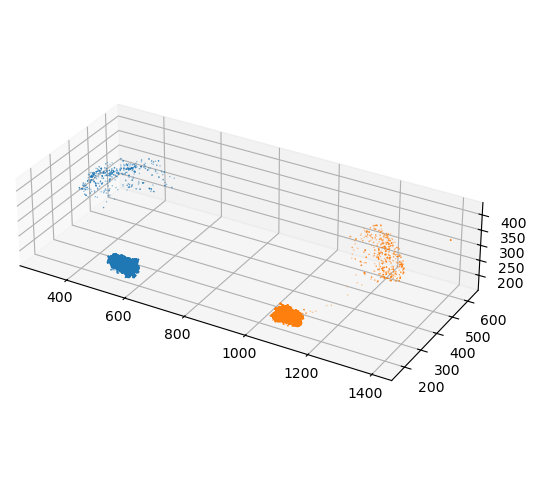

In [ ]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(*lc10a_left_all['boutons'].T, lw=0, s=1, alpha=0.5, label='Boutons Left ')
ax.scatter(*lc10a_right_all['boutons'].T, lw=0, s=1, alpha=0.5, label='Boutons Right')
# ax.scatter(*lc10a_right_all['dendrites'].T, lw=0, s=1, alpha=0.5, label='Dendrites Right')
# ax.scatter(*lc10a_left_all['dendrites'].T, lw=0, s=1, alpha=0.5, label='Dendrites Left')

# ax.view_init(90, 90,-90) 
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')


In [612]:
fig = utils.interactive_plot(*lc10a_right_all['dendrites'].T, color_list=[1.0]*len(lc10a_right_all['dendrites']), title='Dendrites Right', cmap='Reds')
fig = utils.add_to_plot(fig, *lc10a_left_all['dendrites'].T, color_list=[0.0]*len(lc10a_left_all['dendrites']), cmap='Blues')
fig.update_layout(
    scene={
        'aspectmode': 'data',
        'zaxis': {'autorange': 'reversed'}#, # reverse automatically
        # 'yaxis': {'range': (100, 0)},       # manually set certain range in reverse order
    }
)

fig.show()

In [22]:
from collections import defaultdict
import gc
gc.collect()
print(TRIAL_PATH)
print(len(actuator_data))

/Volumes/Charlie's P/Charlie/imaging_analysis/DATA
31


In [23]:
data = {}
for name, info in experiments.items():
    print(name)
    neuropils = {}
    with h5py.File(TRIAL_PATH / f"{name}.h5", "r") as f:
        for neuropil, grp in f.items():
            xyz = grp["centroids"][:]
            tseries = grp["timeseries"][:]
            neuropils[neuropil] = xyz, tseries
    if name in actuator_data:
        data[name] = dict(imaging=neuropils)
        data[name].update(actuator_data[name])

20240612_101
20240612_201
20240623_101
20240623_201
20240704_101
20240610_101
20240610_201
20240606_102
20240606_101
20240606_201
20240606_202
20240618_102
20240618_101
20240618_201
20240620_101
20240620_201
20240605_102
20240605_101
20240629_101
20240629_201
20240629_301
20240609_101
20240530_201
20240617_101
20240617_201
20240617_401
20240617_301
20240611_101
20240611_201
20240625_101
20240625_201


In [493]:
session_key = '20240530_201'
exmRSZ = data[session_key]['mRSZ']
exmFSZ = data[session_key]['mFSZ']
exSideSide = data[session_key]['sideSideZ']
exmfDistZ = data[session_key]['mfDistZ']
print('behav shape: ', exSideSide.shape, exmfDistZ.shape)

eximg_aotu_r = data[session_key]['imaging']['AOTU_R']
eximg_aotu_r_supervox_pos = eximg_aotu_r[0]
eximg_aotu_r_tseries = eximg_aotu_r[1]
print("eximg elem 0: ", eximg_aotu_r_supervox_pos.shape)
print("DIMENSIONS: Supervoxel x [x,y,z]")
print("eximg elem 1: ", eximg_aotu_r_tseries.shape)
print("DIMENSIONS: Supervoxel x frame (volume)")
eximg_aotu_l = data[session_key]['imaging']['AOTU_L']
eximg_aotu_l_supervox_pos = eximg_aotu_l[0]
eximg_aotu_l_tseries = eximg_aotu_l[1]
print("eximg elem 0: ", eximg_aotu_l_supervox_pos.shape)
print("DIMENSIONS: Supervoxel x [x,y,z]")
print("eximg elem 1: ", eximg_aotu_l_tseries.shape)
print("DIMENSIONS: Supervoxel x frame (volume)")

behav shape:  (2623,) (2623,)
eximg elem 0:  (340, 3)
DIMENSIONS: Supervoxel x [x,y,z]
eximg elem 1:  (340, 2623)
DIMENSIONS: Supervoxel x frame (volume)
eximg elem 0:  (677, 3)
DIMENSIONS: Supervoxel x [x,y,z]
eximg elem 1:  (677, 2623)
DIMENSIONS: Supervoxel x frame (volume)


# Neuropil Centers and Thresholding for within AOTU

In [494]:
print(eximg_aotu_r_supervox_pos.shape)

(340, 3)


In [495]:
# averages voxel per neuropil
neuropilCenterDists = {}
for d, neuropil in zip([200, 200, 110, 110], ["LO_R", "LO_L", "AOTU_R", "AOTU_L"]):
    points = neuropilSparse[neuropil]
    c = points.mean(axis=0)
    neuropilCenterDists[neuropil] = (c, d)

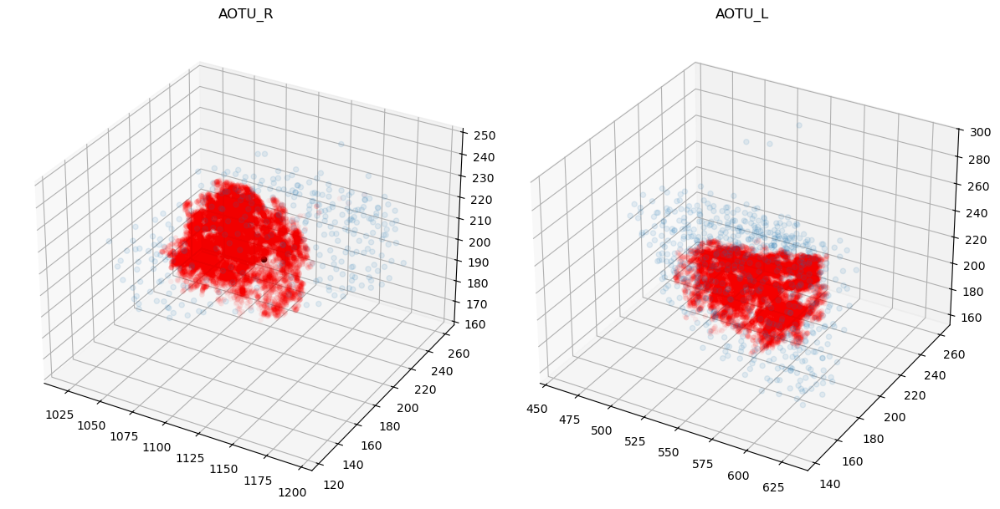

In [ ]:
radius = 100
center_oi = neuropilCenterDists['AOTU_R'][0]
supervox_dists_r = np.linalg.norm(eximg_aotu_r_supervox_pos - center_oi, axis=1)
fda_dists_r = np.linalg.norm(lc10a_right_all['boutons'] - center_oi, axis=1)
inds_fda_aotu_r = np.where(fda_dists_r <= radius)[0]
inds_supervox_aotu_r = np.where(supervox_dists_r <= radius)[0]

center_oi_l = neuropilCenterDists['AOTU_L'][0]
supervox_dists_l = np.linalg.norm(eximg_aotu_l_supervox_pos - center_oi_l, axis=1)
fda_dists_l = np.linalg.norm(lc10a_left_all['boutons'] - center_oi_l, axis=1)
inds_fda_aotu_l = np.where(fda_dists_l <= radius)[0]
inds_supervox_aotu_l = np.where(supervox_dists_l <= radius)[0]

fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.scatter(*eximg_aotu_r_supervox_pos[inds_supervox_aotu_r].T, alpha=0.1, s=20)
ax1.scatter(*lc10a_right_all['boutons'][inds_fda_aotu_r].T, c='r', alpha=0.05, lw=0.1)
ax1.scatter(*neuropilCenterDists['AOTU_R'][0], c='k', alpha=1.0)
ax1.set_title('AOTU_R')

ax2 = fig.add_subplot(1, 2, 2, projection='3d')
ax2.scatter(*eximg_aotu_l_supervox_pos[inds_supervox_aotu_l].T, alpha=0.1, s=20)
ax2.scatter(*lc10a_left_all['boutons'][inds_fda_aotu_l].T, c='r', alpha=0.05, lw=0.1)
ax2.scatter(*neuropilCenterDists['AOTU_L'][0], c='k', alpha=1.0)
ax2.set_title('AOTU_L')

plt.tight_layout()

# Filtering off of Distance

In [501]:
supervox_pos_r = eximg_aotu_r_supervox_pos[inds_supervox_aotu_r]
subset_keylist_r = lc10a_right_all['key_list_bouts'][inds_fda_aotu_r]
subset_boutons_r = lc10a_right_all['boutons'][inds_fda_aotu_r]

supervox_pos_l = eximg_aotu_l_supervox_pos[inds_supervox_aotu_l]
subset_keylist_l = lc10a_left_all['key_list_bouts'][inds_fda_aotu_l]
subset_boutons_l = lc10a_left_all['boutons'][inds_fda_aotu_l]

# Load in LC10a receptive fields

In [230]:
import h5py

from collections import defaultdict 
rfield_data = defaultdict(dict)
with h5py.File(gen_data_dir + 'LC10a.hdf5', 'r') as f:
    for side in f.keys():
        print(f[side].keys())
        side_data = f[side]
        rfield_data[side]['monosynaptic_excitatory'] = side_data['monosynaptic_excitatory'][:]
        rfield_data[side]['disynaptic_excitatory'] = side_data['disynaptic_excitatory'][:]
        rfield_data[side]['xy'] = side_data['xy'][:]    
        rfield_data[side]['ids'] = side_data['ids'][:]
        

<KeysViewHDF5 ['contralateral_excitatory', 'disynaptic_excitatory', 'disynaptic_inhibitory', 'ids', 'monosynaptic_excitatory', 'xy', 'xy_contra']>
<KeysViewHDF5 ['contralateral_excitatory', 'disynaptic_excitatory', 'disynaptic_inhibitory', 'ids', 'monosynaptic_excitatory', 'xy', 'xy_contra']>


In [285]:
def normalize_columns(arr):
    col_sums = arr.sum(axis=0)
    nonzero_mask = col_sums != 0
    normalized_arr = np.zeros_like(arr)
    normalized_arr[:, nonzero_mask] = arr[:, nonzero_mask] / col_sums[nonzero_mask]
    return normalized_arr

left_xy = rfield_data['left']['xy']
left_monoe_weights = rfield_data['left']['monosynaptic_excitatory'] + rfield_data['left']['disynaptic_excitatory']
left_monoe_weights = normalize_columns(left_monoe_weights)

right_xy = rfield_data['right']['xy']
right_monoe_weights = rfield_data['right']['monosynaptic_excitatory'] + rfield_data['right']['disynaptic_excitatory']
right_monoe_weights = normalize_columns(right_monoe_weights)

centroids_left = (left_monoe_weights.T @ left_xy)
centroids_right = (right_monoe_weights.T @ right_xy)
print(centroids_left.shape, centroids_right.shape)

(116, 2) (121, 2)


In [627]:
right_monoe_weights.sum(axis=1)

array([2.73371747e-01, 1.09482329e-01, 2.96853678e-01, 3.85729993e-02,
       4.55833200e-02, 1.08686159e-01, 2.89533271e-01, 7.16525730e-02,
       2.00015526e-01, 1.57125402e-01, 1.35196155e+00, 6.26792396e-02,
       6.25234318e-02, 8.13545367e-02, 1.23989406e-01, 2.43567176e-01,
       3.17077804e-01, 2.91078165e-01, 1.43678870e-02, 7.34356417e-02,
       9.70426565e-02, 9.32451975e-02, 7.98504818e-02, 1.68891476e-01,
       1.05844571e-01, 1.88231180e-01, 1.77208773e-01, 8.31176955e-02,
       2.20266678e-01, 2.16390933e-01, 1.09328093e-01, 2.76466351e-02,
       7.87990533e-02, 1.22085945e-01, 7.71960112e-02, 2.68994996e-01,
       7.96949802e-02, 5.05620996e-02, 1.48689281e-01, 2.81003636e-01,
       1.14321303e-01, 4.43279487e-02, 2.10100208e-01, 1.93303852e-01,
       1.08379527e-01, 3.60646389e-01, 1.78198694e-02, 4.77080682e-02,
       1.80470281e-01, 1.40058014e-01, 2.52224140e-01, 2.05522213e-02,
       1.07098343e-01, 1.43802919e-01, 9.20560776e-02, 1.77843204e-01,
      

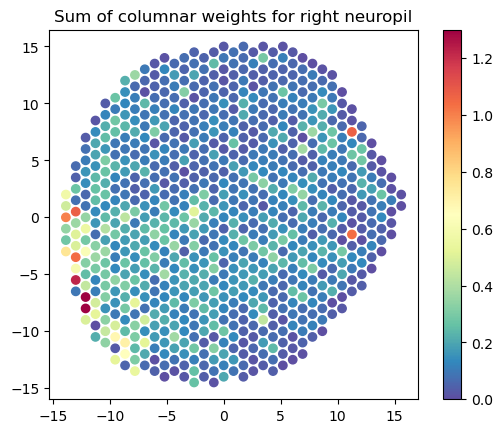

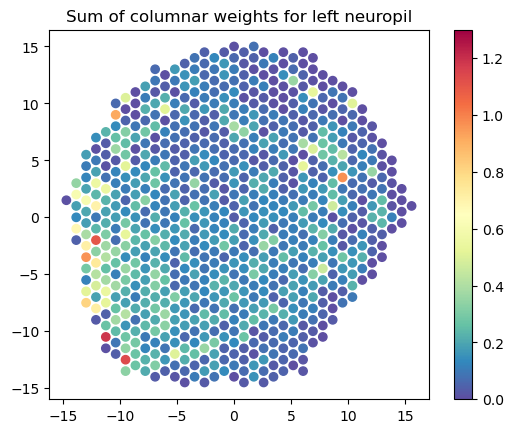

In [634]:
indoi = 120
plt.scatter(*right_xy.T, c=right_monoe_weights.sum(axis=1), cmap='Spectral_r', vmax=1.3)#right_monoe_weights[:,indoi])
# plt.scatter(*centroids_right[indoi], c='r', marker='v', s=100, label='centroid left')
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')
plt.colorbar()
plt.title('Sum of columnar weights for right neuropil')

plt.figure()
plt.scatter(*left_xy.T, c=left_monoe_weights.sum(axis=1), cmap='Spectral_r', vmax=1.3)#left_monoe_weights[:,indoi])
plt.title('Sum of columnar weights for left neuropil')
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')
plt.colorbar()

In [503]:
import pandas as pd

left_inds = rfield_data['left']['ids'].astype(str)
right_inds = rfield_data['right']['ids'].astype(str)
left_rfields_dftemp = pd.DataFrame(centroids_left.T, columns = left_inds)
right_rfields_dftemp = pd.DataFrame(centroids_right.T, columns = right_inds)

left_matt = left_rfields_dftemp.to_numpy().T
sumvals = np.sum(np.abs(left_matt),axis=1)
smallinds = np.where(sumvals < 1e-8)[0]
left_inds_nan = left_inds[smallinds]
print(left_inds_nan)

right_matt = right_rfields_dftemp.to_numpy().T
sumvals = np.sum(np.abs(right_matt),axis=1)
smallinds = np.where(sumvals < 1e-8)[0]
right_inds_nan = right_inds[smallinds]
print(right_inds_nan)

left_rfields_df = left_rfields_dftemp.drop(columns=left_inds_nan)
left_accepted_neurons = left_rfields_df.columns
right_rfields_df = right_rfields_dftemp.drop(columns=right_inds_nan)
right_accepted_neurons = right_rfields_df.columns

print(left_rfields_df.shape, right_rfields_df.shape)

['720575940620935083']
['720575940621827789']
(2, 115) (2, 120)


In [529]:
normalize_centered = lambda x: x / (np.max(x) - np.min(x))
def prep_axes_df(rfields_df):
    col_names = rfields_df.columns
    rfields_mat = rfields_df.to_numpy()
    colors_ap_axis = normalize_centered(-1*rfields_mat[0,:])
    colors_dv_axis = normalize_centered(rfields_mat[1,:])
    coldict = {}
    for name, ap, dv in zip(col_names, colors_ap_axis, colors_dv_axis):
        coldict[name] = [ap, dv]
    return coldict

left_color_dict = prep_axes_df(left_rfields_df)
right_color_dict = prep_axes_df(right_rfields_df)

In [ ]:
# lcd_keys = list(left_color_dict.keys())
# for i, key in subset_keylist_l:
#     if key in lcd_keys:
        


In [ ]:
inds_keep_l = [i for i,key in enumerate(subset_keylist_l) if key in left_color_dict.keys()]
inds_keep_r = [i for i,key in enumerate(subset_keylist_r) if key in right_color_dict.keys()]
subset_boutons_l = subset_boutons_l[inds_keep_l]
subset_boutons_r = subset_boutons_r[inds_keep_r]
subset_keylist_l = subset_keylist_l[inds_keep_l]
subset_keylist_r = subset_keylist_r[inds_keep_r]

subset_rf_centres_l = np.array([left_color_dict[str(k)] for k in subset_keylist_l])
subset_rf_centres_r = np.array([right_color_dict[str(k)] for k in subset_keylist_r])

## Plotting boutons

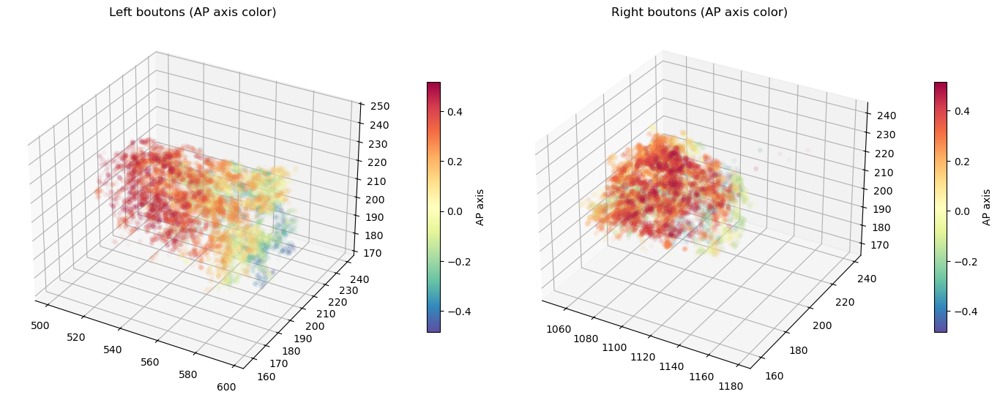

In [ ]:
cmap = 'Spectral_r'
fig = plt.figure(figsize=(14, 6))
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
sc1 = ax1.scatter(*subset_boutons_l.T, c=subset_rf_centres_l[:, 0], alpha=0.05, lw=0.1, cmap=cmap)
ax1.set_title('Left boutons (AP axis color)')
# Create a ScalarMappable for the colorbar so alpha does not affect it
from matplotlib.cm import ScalarMappable
import matplotlib as mpl
sm1 = ScalarMappable(cmap=cmap, norm=mpl.colors.Normalize(vmin=np.min(subset_rf_centres_l[:, 0]), vmax=np.max(subset_rf_centres_l[:, 0])))
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax1, shrink=0.6, pad=0.1, label='AP axis')

ax2 = fig.add_subplot(1, 2, 2, projection='3d')
sc2 = ax2.scatter(*subset_boutons_r.T, c=subset_rf_centres_r[:, 0], alpha=0.05, lw=0.1, cmap=cmap)
ax2.set_title('Right boutons (AP axis color)')
sm2 = ScalarMappable(cmap=cmap, norm=mpl.colors.Normalize(vmin=np.min(subset_rf_centres_r[:, 0]), vmax=np.max(subset_rf_centres_r[:, 0])))
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax2, shrink=0.6, pad=0.1, label='AP axis')

plt.tight_layout()
plt.show()

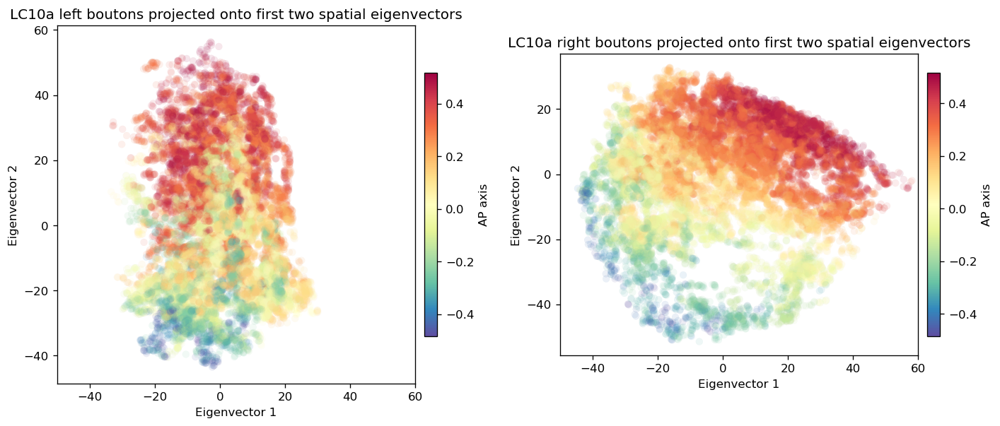

In [532]:
import matplotlib as mpl
from matplotlib.cm import ScalarMappable

mean_sub_l = subset_boutons_l - subset_boutons_l.mean(axis=0)
covarmat_l = mean_sub_l.T @ mean_sub_l
spat_evals_l, spat_evecs_l = np.linalg.eig(covarmat_l)
project_l = spat_evecs_l[:, :2]
mean_sub_proj_l = mean_sub_l @ project_l

mean_sub_r = subset_boutons_r - subset_boutons_r.mean(axis=0)
covarmat_r = mean_sub_r.T @ mean_sub_r
spat_evals_r, spat_evecs_r = np.linalg.eig(covarmat_r)
project_r = spat_evecs_r[:, :2]
mean_sub_proj_r = mean_sub_r @ project_r

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=120)

# Left boutons
sc_l = axes[0].scatter(*mean_sub_proj_l.T, c=subset_rf_centres_l[:,0], alpha=0.1, lw=0.1, cmap='Spectral_r')
axes[0].set_title('LC10a left boutons projected onto first two spatial eigenvectors')
axes[0].set_xlim([-50, 60])
axes[0].set_xlabel('Eigenvector 1')
axes[0].set_ylabel('Eigenvector 2')
axes[0].set_aspect('equal', adjustable='box')
sm_l = ScalarMappable(cmap='Spectral_r', norm=mpl.colors.Normalize(vmin=np.min(subset_rf_centres_l[:,0]), vmax=np.max(subset_rf_centres_l[:,0])))
sm_l.set_array([])
fig.colorbar(sm_l, ax=axes[0], label='AP axis', shrink=0.7, pad=0.02)

# Right boutons
# You may want to define colors_ap_axis_r for right boutons if needed
sc_r = axes[1].scatter(*mean_sub_proj_r.T, c=subset_rf_centres_r[:,0], alpha=0.1, lw=0.1, cmap='Spectral_r')
axes[1].set_title('LC10a right boutons projected onto first two spatial eigenvectors')
axes[1].set_xlim([-50, 60])
axes[1].set_xlabel('Eigenvector 1')
axes[1].set_ylabel('Eigenvector 2')
axes[1].set_aspect('equal', adjustable='box')
sm_r = ScalarMappable(cmap='Spectral_r', norm=mpl.colors.Normalize(vmin=np.min(subset_rf_centres_r[:,0]), vmax=np.max(subset_rf_centres_r[:,0])))
sm_r.set_array([])
fig.colorbar(sm_r, ax=axes[1], label='AP axis', shrink=0.7, pad=0.02)

plt.tight_layout()
plt.show()

In [535]:
fig = utils.interactive_plot(subset_boutons_l[:,0], subset_boutons_l[:,1], subset_boutons_l[:,2], color_list=subset_rf_centres_l[:,0], title='AOTU_L LC10a Boutons: colored by rfield AP axis', cmap='Spectral_r')    
fig.show()

In [536]:
fig = utils.interactive_plot(subset_boutons_l[:,0], subset_boutons_l[:,1], subset_boutons_l[:,2], color_list=subset_rf_centres_l[:,1], title='AOTU_L LC10a Boutons: colored by rfield DV axis', cmap='Spectral_r')    
fig.show()

In [731]:
fig = utils.interactive_plot(subset_boutons_r[:,0], subset_boutons_r[:,1], subset_boutons_r[:,2], color_list=subset_rf_centres_r[:,0], title='AOTU_R LC10a Boutons: colored by rfield AP axis', cmap='Spectral_r')    
fig.show()

In [537]:
import utils

fig = utils.interactive_plot(subset_boutons_r[:,0], subset_boutons_r[:,1], subset_boutons_r[:,2], color_list=subset_rf_centres_r[:,0], title='AOTU_R LC10a Boutons: colored by rfield AP axis', cmap='Spectral_r')
utils.add_to_plot(fig, supervox_pos_r[:,0], supervox_pos_r[:,1], supervox_pos_r[:,2], color_list='grey', opacity=0.2, cmap='Viridis', marker_size=10)
fig.show()

In [40]:
utils.interactive_plot(subset_boutons[:,0], subset_boutons[:,1], subset_boutons[:,2], color_list=colors_dv_axis, title='AOTU_R LC10a Boutons: colored by rfield DV axis')

# Voxel - LC10a - Receptive Fields

In [ ]:
#simpler approach

def generate_voxel_rf(supervox_pos_aotu, subset_boutons, colors_ap_axis, colors_dv_axis, radius=10, minlength = 5):
    lengths = []
    voxel_rf = []
    for svox in supervox_pos_aotu:
        dists = np.linalg.norm(subset_boutons - svox, axis=1)
        close_inds = np.where(dists < radius)[0]
        lengths.append(len(close_inds))
        if len(close_inds) < minlength:
            voxel_rf.append([np.nan, np.nan])
        else:
            mean_ap = np.mean(colors_ap_axis[close_inds])
            mean_dv = np.mean(colors_dv_axis[close_inds])
            voxel_rf.append([mean_ap, mean_dv])
    voxel_rf = np.array(voxel_rf)
    print(np.max(lengths))
    return voxel_rf

voxel_rf_l = generate_voxel_rf(supervox_pos_l, subset_boutons_l, subset_rf_centres_l[:,0], subset_rf_centres_l[:,1], radius=10)
voxel_subset_l = []
for i,boolpair in enumerate(np.isnan(voxel_rf_l)):
    if not boolpair.any():
        voxel_subset_l.append(i)
print(f"{len(voxel_subset_l)} supervoxels with valid rfield data")

voxel_rf_r = generate_voxel_rf(supervox_pos_r, subset_boutons_r, subset_rf_centres_r[:,0], subset_rf_centres_r[:,1], radius=10)
voxel_subset_r = []
for i,boolpair in enumerate(np.isnan(voxel_rf_r)):
    if not boolpair.any():
        voxel_subset_r.append(i)
print(f"{len(voxel_subset_r)} supervoxels with valid rfield data")

1070
227 supervoxels with valid rfield data
1453
94 supervoxels with valid rfield data


# 3d visualizations

In [737]:
order_color = np.arange(supervox_pos_r.shape[0])/supervox_pos_r.shape[0]
utils.interactive_plot(supervox_pos_r[:,0], supervox_pos_r[:,1], supervox_pos_r[:,2], color_list=order_color, title='AOTU_R LC10a Supervoxels: colored by order', cmap='Spectral_r', marker_size=10)

In [732]:
utils.interactive_plot(supervox_pos_r[:,0], supervox_pos_r[:,1], supervox_pos_r[:,2], color_list=voxel_rf_r[:, 0], title='AOTU_R LC10a Supervoxels: colored by rfield AP axis', cmap='Spectral_r', marker_size=10)

In [551]:
utils.interactive_plot(supervox_pos_l[:,0], supervox_pos_l[:,1], supervox_pos_l[:,2], color_list=voxel_rf_l[:, 0], title='AOTU_L LC10a Supervoxels: colored by rfield AP axis', cmap='Spectral_r', marker_size=10)

In [552]:
utils.interactive_plot(supervox_pos_l[voxel_subset_l,0], supervox_pos_l[voxel_subset_l,1], supervox_pos_l[voxel_subset_l,2], color_list=voxel_rf_l[voxel_subset_l, 0], title='AOTU_L LC10a Supervoxels: colored by rfield AP axis', cmap='Spectral_r', marker_size=10)

In [549]:
utils.interactive_plot(supervox_pos_l[voxel_subset_l,0], supervox_pos_l[voxel_subset_l,1], supervox_pos_l[voxel_subset_l,2], color_list=voxel_rf_l[voxel_subset_l, 0], title='AOTU_R LC10a Supervoxels: colored by rfield AP axis', cmap='Spectral_r', marker_size=10)

In [554]:
utils.interactive_plot(supervox_pos_l[voxel_subset_l,0], supervox_pos_l[voxel_subset_l,1], supervox_pos_l[voxel_subset_l,2], color_list=voxel_rf_l[voxel_subset_l, 1], title='AOTU_L LC10a Supervoxels: colored by rfield DV axis', cmap='Spectral_r', marker_size=10)

In [76]:
utils.interactive_plot(supervox_pos_aotu[voxel_subset,0], supervox_pos_aotu[voxel_subset,1], supervox_pos_aotu[voxel_subset,2], color_list=voxel_rf[voxel_subset, 1], title='AOTU_R LC10a Supervoxels: colored by rfield DV axis', cmap='Spectral_r', marker_size=10)

# Functional Analysis

## Pipeline

In [644]:
def generate_voxel_rf(supervox_pos_aotu, subset_boutons, colors_ap_axis, colors_dv_axis, radius=10, minlength = 5):
    lengths = []
    voxel_rf = []
    for svox in supervox_pos_aotu:
        dists = np.linalg.norm(subset_boutons - svox, axis=1)
        close_inds = np.where(dists < radius)[0]
        lengths.append(len(close_inds))
        if len(close_inds) < minlength:
            voxel_rf.append([np.nan, np.nan])
        else:
            mean_ap = np.mean(colors_ap_axis[close_inds])
            mean_dv = np.mean(colors_dv_axis[close_inds])
            voxel_rf.append([mean_ap, mean_dv])
    voxel_rf = np.array(voxel_rf)
    # print(np.max(lengths))
    return voxel_rf

def singleton(session_key):
    print("Processing session:", session_key)
# session_key = '20240530_201'
    exmRSZ = data[session_key]['mRSZ']
    exmFSZ = data[session_key]['mFSZ']
    exSideSide = data[session_key]['sideSideZ']
    exmfDistZ = data[session_key]['mfDistZ']
    behavior_dict = {'exmRSZ': exmRSZ, 'exmFSZ': exmFSZ, 'exSideSide': exSideSide, 'exmfDistZ': exmfDistZ}

    eximg_aotu_r = data[session_key]['imaging']['AOTU_R']
    eximg_aotu_r_supervox_pos = eximg_aotu_r[0]
    eximg_aotu_r_tseries = eximg_aotu_r[1]

    eximg_aotu_l = data[session_key]['imaging']['AOTU_L']
    eximg_aotu_l_supervox_pos = eximg_aotu_l[0]
    eximg_aotu_l_tseries = eximg_aotu_l[1]

    radius = 100
    center_oi = neuropilCenterDists['AOTU_R'][0]
    supervox_dists_r = np.linalg.norm(eximg_aotu_r_supervox_pos - center_oi, axis=1)
    fda_dists_r = np.linalg.norm(lc10a_right_all['boutons'] - center_oi, axis=1)
    inds_fda_aotu_r = np.where(fda_dists_r <= radius)[0]
    inds_supervox_aotu_r = np.where(supervox_dists_r <= radius)[0]

    center_oi_l = neuropilCenterDists['AOTU_L'][0]
    supervox_dists_l = np.linalg.norm(eximg_aotu_l_supervox_pos - center_oi_l, axis=1)
    fda_dists_l = np.linalg.norm(lc10a_left_all['boutons'] - center_oi_l, axis=1)
    inds_fda_aotu_l = np.where(fda_dists_l <= radius)[0]
    inds_supervox_aotu_l = np.where(supervox_dists_l <= radius)[0]

    supervox_pos_r = eximg_aotu_r_supervox_pos[inds_supervox_aotu_r]
    subset_keylist_r_temp = lc10a_right_all['key_list_bouts'][inds_fda_aotu_r]
    subset_boutons_r_temp = lc10a_right_all['boutons'][inds_fda_aotu_r]

    supervox_pos_l = eximg_aotu_l_supervox_pos[inds_supervox_aotu_l]
    subset_keylist_l_temp = lc10a_left_all['key_list_bouts'][inds_fda_aotu_l]
    subset_boutons_l_temp = lc10a_left_all['boutons'][inds_fda_aotu_l]
    
    inds_keep_l = [i for i,key in enumerate(subset_keylist_l_temp) if key in left_color_dict.keys()]
    inds_keep_r = [i for i,key in enumerate(subset_keylist_r_temp) if key in right_color_dict.keys()]
    
    subset_boutons_l = subset_boutons_l_temp[inds_keep_l]
    subset_boutons_r = subset_boutons_r_temp[inds_keep_r]
    subset_keylist_l = subset_keylist_l_temp[inds_keep_l]
    subset_keylist_r = subset_keylist_r_temp[inds_keep_r]

    subset_rf_centres_l = np.array([left_color_dict[str(k)] for k in subset_keylist_l])
    subset_rf_centres_r = np.array([right_color_dict[str(k)] for k in subset_keylist_r])    
    
    voxel_rf_l = generate_voxel_rf(supervox_pos_l, subset_boutons_l, subset_rf_centres_l[:,0], subset_rf_centres_l[:,1], radius=10)
    voxel_subset_l = []
    for i,boolpair in enumerate(np.isnan(voxel_rf_l)):
        if not boolpair.any():
            voxel_subset_l.append(i)
    print(f"{len(voxel_subset_l)} supervoxels with valid rfield data")

    voxel_rf_r = generate_voxel_rf(supervox_pos_r, subset_boutons_r, subset_rf_centres_r[:,0], subset_rf_centres_r[:,1], radius=10)
    voxel_subset_r = []
    for i,boolpair in enumerate(np.isnan(voxel_rf_r)):
        if not boolpair.any():
            voxel_subset_r.append(i)
    print(f"{len(voxel_subset_r)} supervoxels with valid rfield data")

    def compute_functional_data(inds_supervox, voxel_subset, voxel_rf, time_series):
        # Extract the time series data for the supervoxels and voxels of interest

        voxels_activity_withinaotu = time_series[inds_supervox]
        voxels_activity_val = voxels_activity_withinaotu[voxel_subset]

        num_voxels_used = voxels_activity_val.shape[0]
        voxels_activity_zscore = (voxels_activity_val - voxels_activity_val.mean(axis=1, keepdims=True))/voxels_activity_val.std(axis=1, keepdims=True)

        voxel_rf_subset = voxel_rf[voxel_subset]
        ap_sort_inds = np.argsort(voxel_rf_subset[:, 0])
        dv_sort_inds = np.argsort(voxel_rf_subset[:, 1])

        voxels_activity_ap_sorted = voxels_activity_zscore[ap_sort_inds]
        voxels_activity_dv_sorted = voxels_activity_zscore[dv_sort_inds]

        U,S,V = np.linalg.svd(voxels_activity_zscore)
        func_dict = {'U': U, 'S': S, 'V': V, 
                     'voxels_activity_zscore': voxels_activity_zscore,
                     'voxel_rf_subset': voxel_rf_subset}
        return func_dict

    right_func_dict = compute_functional_data(inds_supervox_aotu_r, voxel_subset_r, voxel_rf_r, eximg_aotu_r_tseries)
    left_func_dict = compute_functional_data(inds_supervox_aotu_l, voxel_subset_l, voxel_rf_l, eximg_aotu_l_tseries)

    output_dict = {'right_func_dict': right_func_dict,
                    'left_func_dict': left_func_dict,
                    'supervox_pos_r': supervox_pos_r,
                    'subset_keylist_r': subset_keylist_r,
                    'subset_boutons_r': subset_boutons_r,
                    'supervox_pos_l': supervox_pos_l,
                    'subset_keylist_l': subset_keylist_l,
                    'subset_boutons_l': subset_boutons_l,
                    'voxel_rf_l': voxel_rf_l,
                    'voxel_rf_r': voxel_rf_r,
                    'voxel_subset_l': voxel_subset_l,
                    'voxel_subset_r': voxel_subset_r,
                   'behavior_dict': behavior_dict}
    return output_dict

singletons = []
for session_key in data.keys():
    output_singleton_dict = singleton(session_key)
    with open(gen_data_dir + 'aotu_pipeline_saves/' + f'{session_key}_output_dict.pkl', 'wb') as f:
        pkl.dump(output_singleton_dict, f)
    singletons.append(output_singleton_dict)

Processing session: 20240612_101
330 supervoxels with valid rfield data
319 supervoxels with valid rfield data
Processing session: 20240612_201
214 supervoxels with valid rfield data
219 supervoxels with valid rfield data
Processing session: 20240623_101
225 supervoxels with valid rfield data
259 supervoxels with valid rfield data
Processing session: 20240623_201
118 supervoxels with valid rfield data
175 supervoxels with valid rfield data
Processing session: 20240704_101
324 supervoxels with valid rfield data
409 supervoxels with valid rfield data
Processing session: 20240610_101
261 supervoxels with valid rfield data
224 supervoxels with valid rfield data
Processing session: 20240610_201
155 supervoxels with valid rfield data
192 supervoxels with valid rfield data
Processing session: 20240606_102
242 supervoxels with valid rfield data
156 supervoxels with valid rfield data
Processing session: 20240606_101
274 supervoxels with valid rfield data
97 supervoxels with valid rfield data
Pr

In [645]:
with open(gen_data_dir + 'aotu_pipeline_saves/singletons.pkl', 'wb') as f:
    pkl.dump(singletons, f)

In [646]:
singleton_dict = {sesskey: output_singleton_dict for sesskey, output_singleton_dict in zip(data.keys(), singletons)}

In [661]:
len(singleton_dict.keys())

31

In [688]:
high_level_stats = {}
for session_key in singleton_dict.keys():
    lfd = singleton_dict[session_key]['left_func_dict']
    rfd = singleton_dict[session_key]['right_func_dict']
    colors = ['orange','blue']
    high_level_stats[session_key] = {}
    for (j,func_dict),label in zip(enumerate([lfd, rfd]), ['left','right']):
        U = func_dict['U']
        S = func_dict['S']
        V = func_dict['V']
        voxel_rf_subset = func_dict['voxel_rf_subset']
        num_voxels_used = U.shape[1]
        corrvals = np.zeros((2,num_voxels_used))
        for i in range(num_voxels_used):
            corrvals[0,i] = np.corrcoef(U[:,i], voxel_rf_subset[:,0])[0,1]
            corrvals[1,i] = np.corrcoef(U[:,i], voxel_rf_subset[:,1])[0,1]
            
        max_ap = np.max(np.abs(corrvals[0,:]))
        max_dv = np.max(np.abs(corrvals[1,:]))
        corr_ap_dv = np.corrcoef(corrvals[0,:], corrvals[1,:])[0,1]
        high_level_stats[session_key][label] = {
            'max_ap': max_ap,
            'max_dv': max_dv,
            'corr_ap_dv': corr_ap_dv,
            'corrvals': corrvals
        }

/var/folders/6z/nhjp1qw15ksfthlqr8sbx68r0000gn/T/ipykernel_39328/1630232804.py:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



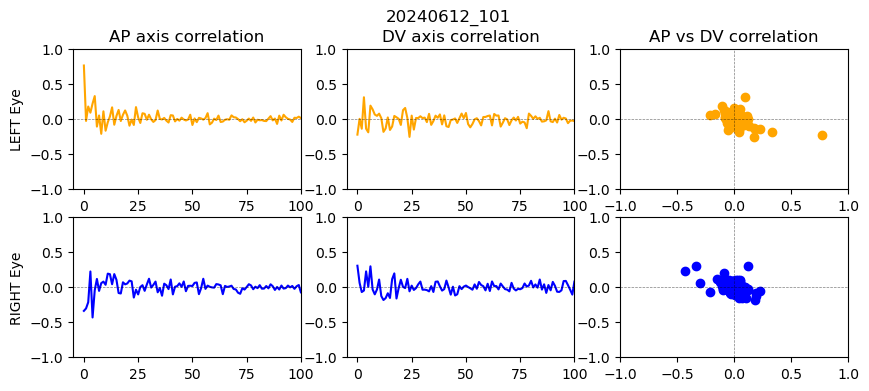

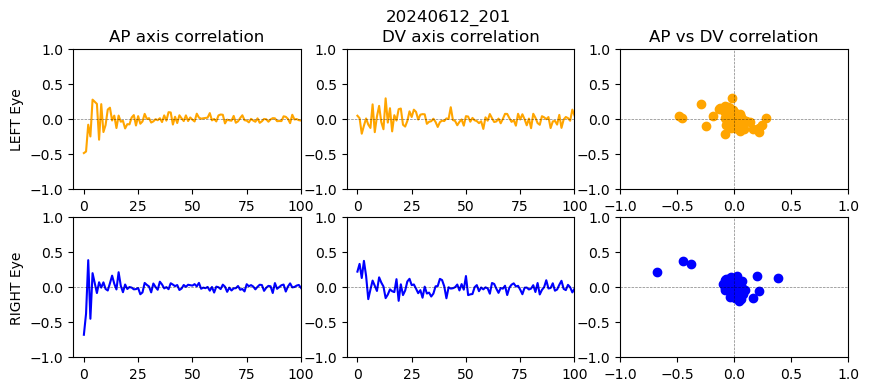

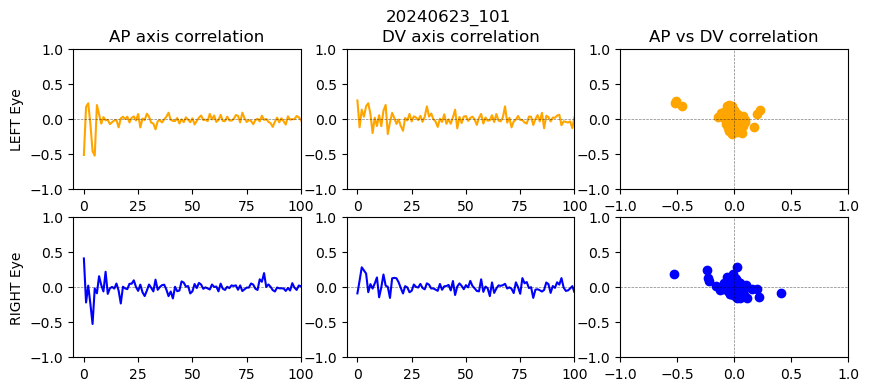

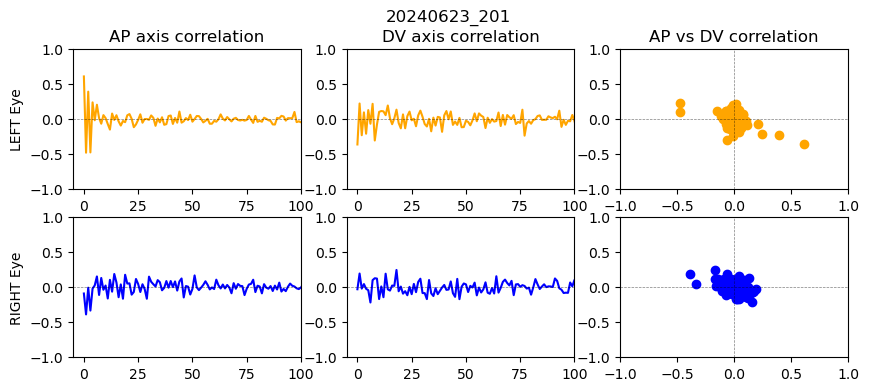

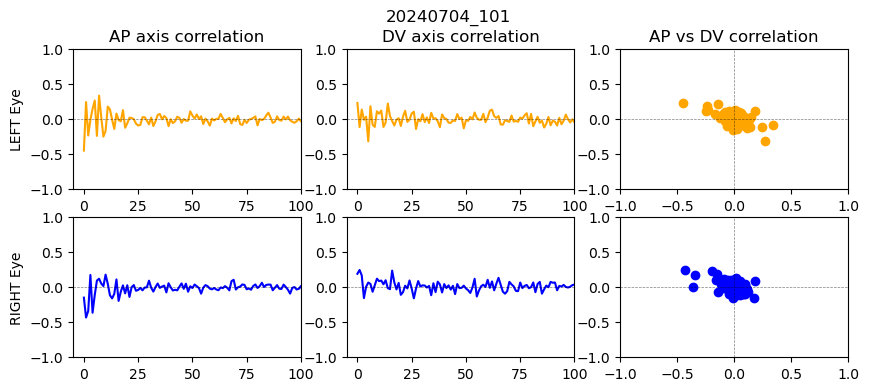

...

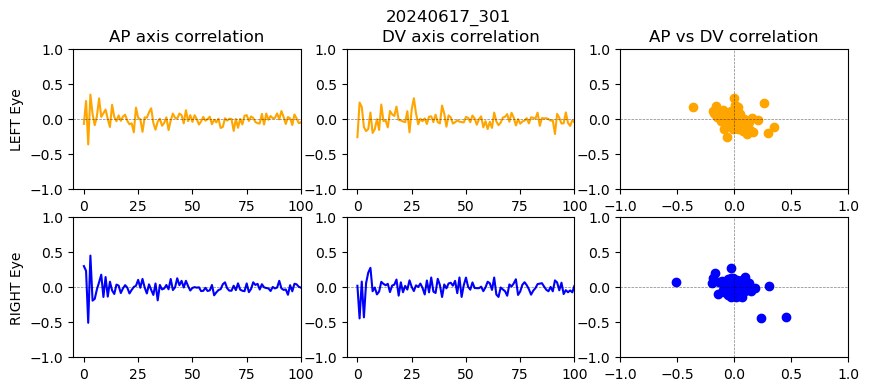

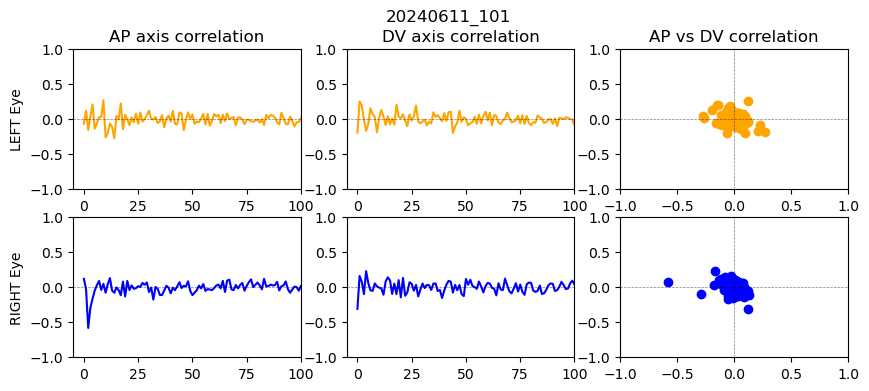

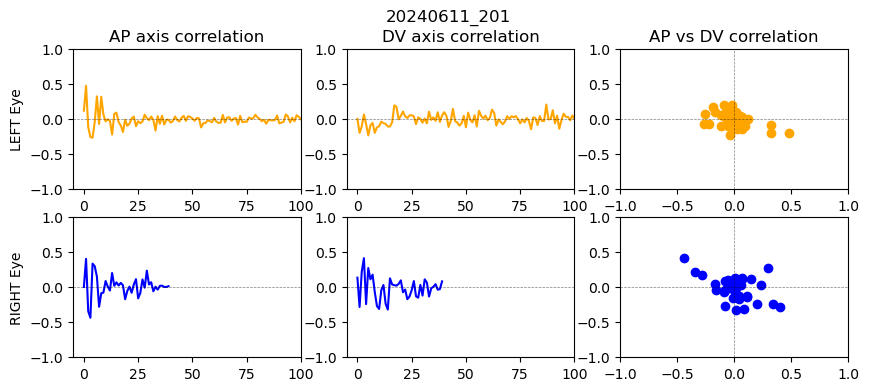

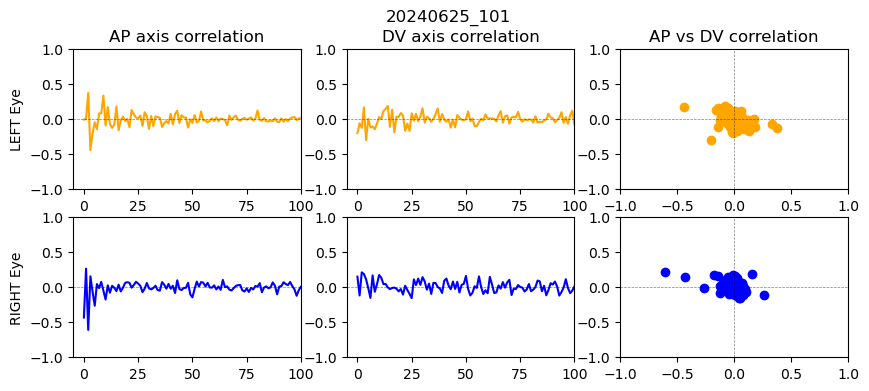

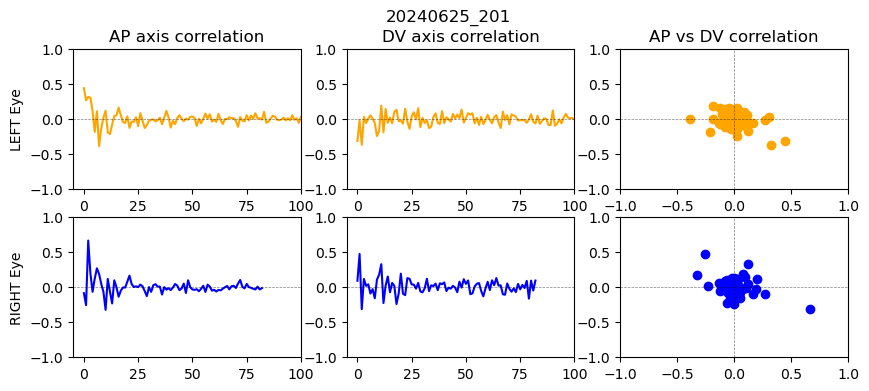

In [ ]:
high_level_stats = {}
for session_key in singleton_dict.keys():
    lfd = singleton_dict[session_key]['left_func_dict']
    rfd = singleton_dict[session_key]['right_func_dict']
    fig, ax = plt.subplots(2,3, figsize=(10,4))
    colors = ['orange','blue']
    for j,func_dict in enumerate([lfd, rfd]):
        U = func_dict['U']
        S = func_dict['S']
        V = func_dict['V']
        voxel_rf_subset = func_dict['voxel_rf_subset']
        num_voxels_used = U.shape[1]
        corrvals = np.zeros((2,num_voxels_used))
        for i in range(num_voxels_used):
            corrvals[0,i] = np.corrcoef(U[:,i], voxel_rf_subset[:,0])[0,1]
            corrvals[1,i] = np.corrcoef(U[:,i], voxel_rf_subset[:,1])[0,1]
            
        max_ap = np.max(np.abs(corrvals[0,:]))
        max_dv = np.max(np.abs(corrvals[1,:]))
        corr_ap_dv = np.corrcoef(corrvals[0,:], corrvals[1,:])[0,1]
        high_level_stats[session_key] = {
            'max_ap': max_ap,
            'max_dv': max_dv,
            'corr_ap_dv': corr_ap_dv
            'corrvals': corrvals
        }
        ax[j,0].plot(corrvals[0,:], label='AP axis', c=colors[j])
        ax[j,1].plot(corrvals[1,:], label='DV axis', c=colors[j])
        ax[j,2].scatter(*corrvals, c=colors[j])
        ax[j,0].set_xlim([-5,100])
        ax[j,1].set_xlim([-5,100])
        ax[j,0].set_ylim([-1,1])
        ax[j,1].set_ylim([-1,1])
        ax[j,2].set_ylim([-1,1])
        ax[j,2].set_xlim([-1,1])
        ax[j,0].axhline(0, c='k', ls='--', lw=0.5, alpha=0.5)
        ax[j,1].axhline(0, c='k', ls='--', lw=0.5, alpha=0.5)
        ax[j,2].axhline(0, c='k', ls='--', lw=0.5, alpha=0.5)
        ax[j,2].axvline(0, c='k', ls='--', lw=0.5, alpha=0.5)
        
    ax[0,0].set_title('AP axis correlation')
    ax[0,1].set_title('DV axis correlation')
    ax[0,2].set_title('AP vs DV correlation')
    ax[0,0].set_ylabel('LEFT Eye')
    ax[1,0].set_ylabel('RIGHT Eye')

    fig.suptitle(session_key)
    
    # break

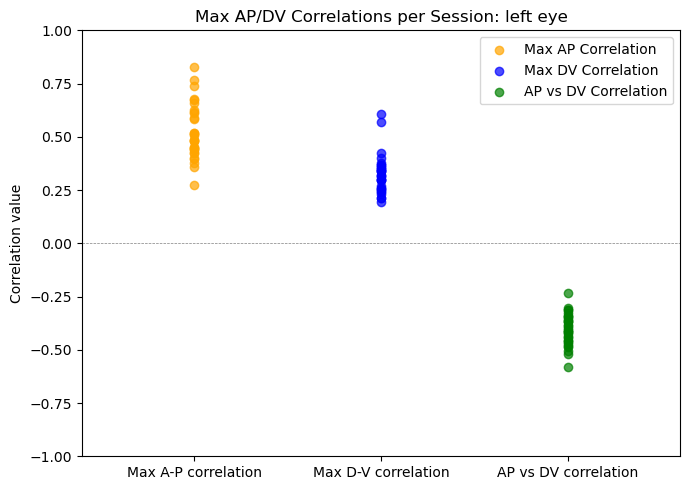

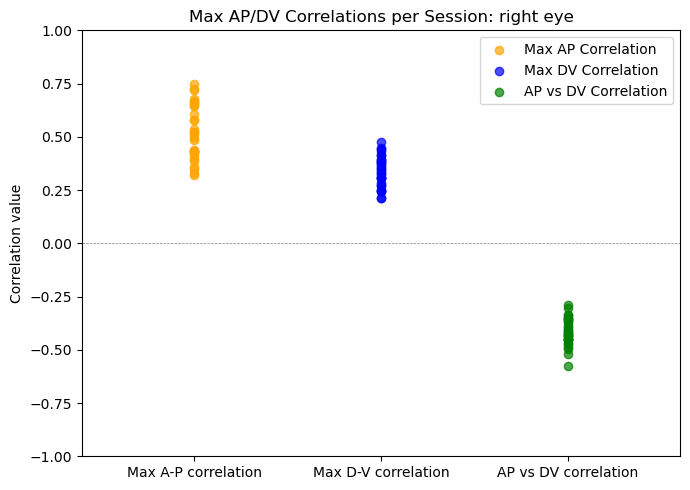

In [694]:
for lab in ['left', 'right']:
    max_aps = [high_level_stats[seskey][lab]['max_ap'] for seskey in high_level_stats.keys()]
    max_dvs = [high_level_stats[seskey][lab]['max_dv'] for seskey in high_level_stats.keys()]
    ap_dv_corrs = [high_level_stats[seskey][lab]['corr_ap_dv'] for seskey in high_level_stats.keys()]

    fig, ax = plt.subplots(figsize=(7, 5))
    ax.scatter([0.25] * len(max_aps), max_aps, color='orange', alpha=0.7, label='Max AP Correlation')
    ax.scatter([0.5] * len(max_dvs), max_dvs, color='blue', alpha=0.7, label='Max DV Correlation')
    ax.scatter([0.75] * len(ap_dv_corrs), ap_dv_corrs, color='green', alpha=0.7, label='AP vs DV Correlation')
    ax.set_ylabel('Correlation value')
    ax.set_xticks([0.25, 0.5, 0.75])
    ax.set_xlim([0.1,0.9])
    ax.set_ylim([-1,1])
    ax.axhline(0, c='k', ls='--', lw=0.5, alpha=0.5)
    ax.set_xticklabels (['Max A-P correlation', 'Max D-V correlation', 'AP vs DV correlation'])
    ax.set_title(f'Max AP/DV Correlations per Session: {lab} eye')
    ax.legend()
    plt.tight_layout()
    plt.show()

In [696]:
list(singleton_dict.keys())[0]
exkey = '20240612_101'
temporal_factors = singleton_dict[exkey]['right_func_dict']['V'].shape
# corrvals = high_level_stats[exkey]['corrvals']
zscore_left = singleton_dict[exkey]['left_func_dict']['voxels_activity_zscore']
U,S,V = singleton_dict[exkey]['left_func_dict']['U'], singleton_dict[exkey]['left_func_dict']['S'], singleton_dict[exkey]['left_func_dict']['V']

(0.0, 500.0)

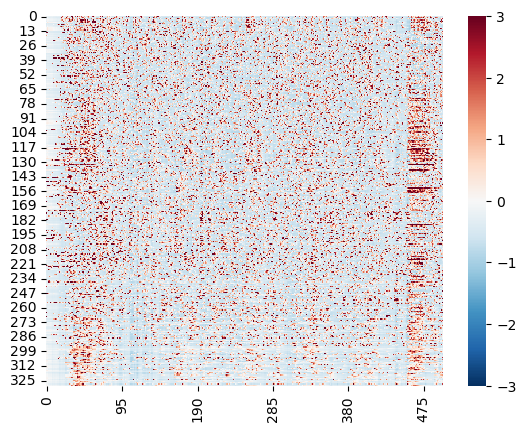

In [713]:
sns.heatmap(zscore_left, cmap='RdBu_r', vmin=-3, vmax=3)
plt.xlim([0,500])

(0.0, 500.0)

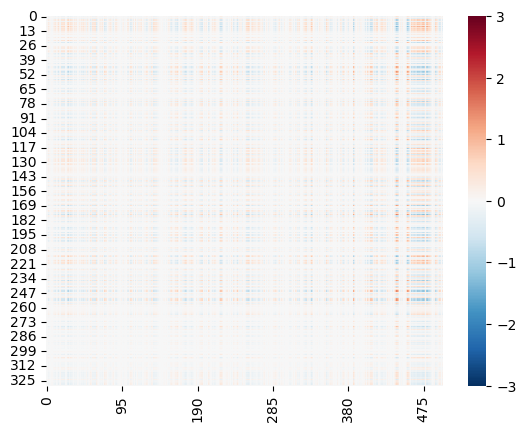

In [712]:
sns.heatmap(S[1]*U[:,[1]]@V[[1],:], cmap='RdBu_r', vmin=-3, vmax=3)
plt.xlim([0,500])

Text(0.5, 1.0, 'r = 10')

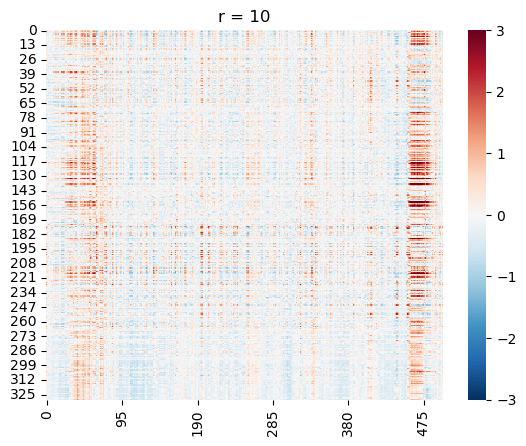

In [724]:
sns.heatmap((U[:,:10]*S[:10])@V[:10,:], cmap='RdBu_r', vmin=-3, vmax=3)
plt.xlim([0,500])
plt.title('r = 10')

Text(0.5, 1.0, 'r = 2')

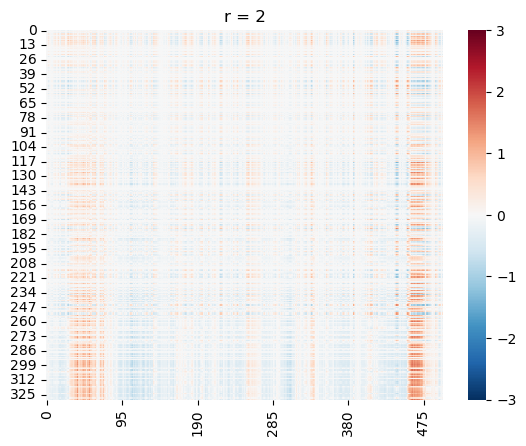

In [725]:
sns.heatmap((U[:,:2]*S[:2])@V[:2,:], cmap='RdBu_r', vmin=-3, vmax=3)
plt.xlim([0,500])
plt.title('r = 2')

# sns.heatmap(S[0]*U[:,[0]]@V[[0],:]+S[1]*U[:,[1]]@V[[1],:], cmap='RdBu_r', vmin=-3, vmax=3)

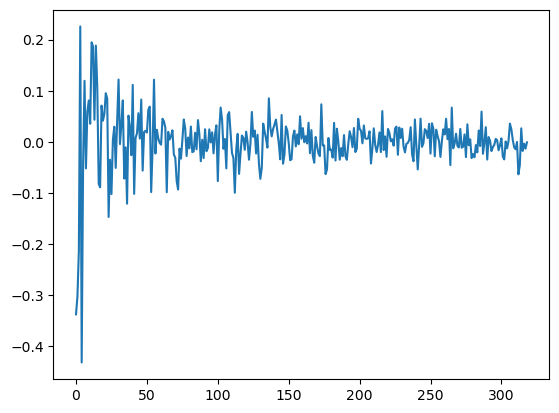

In [686]:
plt.plot(corrvals[0,:])

In [ ]:
for session_key in singleton_dict.keys():
    lfd = singleton_dict[session_key]['left_func_dict']
    rfd = singleton_dict[session_key]['right_func_dict']
    bdict = singleton_dict[session_key]['behavior_dict']
    fig, ax = plt.subplots(2,3, figsize=(10,4))
    colors = ['orange','blue']
    for j,func_dict in enumerate([lfd, rfd]):


## Single Session case

In [726]:
voxels_activity_withinaotu = eximg_aotu_r_tseries[inds_supervox_aotu_r]
voxels_activity_val = voxels_activity_withinaotu[voxel_subset_r]

num_voxels_used = voxels_activity_val.shape[0]
voxels_activity_zscore = (voxels_activity_val - voxels_activity_val.mean(axis=1, keepdims=True))/voxels_activity_val.std(axis=1, keepdims=True)

voxel_rf_subset = voxel_rf_r[voxel_subset_r]
ap_sort_inds = np.argsort(voxel_rf_subset[:, 0])
dv_sort_inds = np.argsort(voxel_rf_subset[:, 1])

voxels_activity_ap_sorted = voxels_activity_zscore[ap_sort_inds]
voxels_activity_dv_sorted = voxels_activity_zscore[dv_sort_inds]


U,S,V = np.linalg.svd(voxels_activity_zscore)

Text(0.5, 0, 'Time (s)')

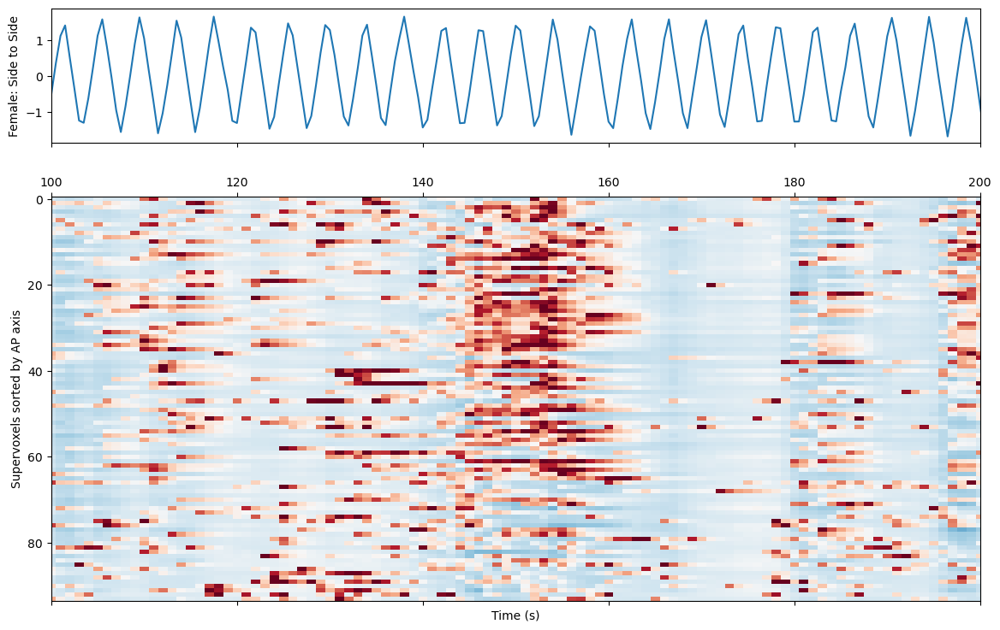

In [727]:
import seaborn as sns
fig, ax = plt.subplots(2,1,figsize=(14, 9), sharex=True, gridspec_kw={'height_ratios': [1, 3]})
time = np.arange(voxels_activity_ap_sorted.shape[1])/2
ax[0].plot(time, exSideSide)
ax[1].matshow(voxels_activity_ap_sorted, cmap='RdBu_r', vmin=-3, vmax=3, aspect='auto')
ax[0].set_xlim([100,200])
ax[1].set_ylabel('Supervoxels sorted by AP axis')
ax[1].set_xlabel('Time (s)')
ax[0].set_ylabel('Female: Side to Side')
ax[1].set_xlabel('Time (s)')

# Trialing

316 317
316: number of trials
317: number of trials


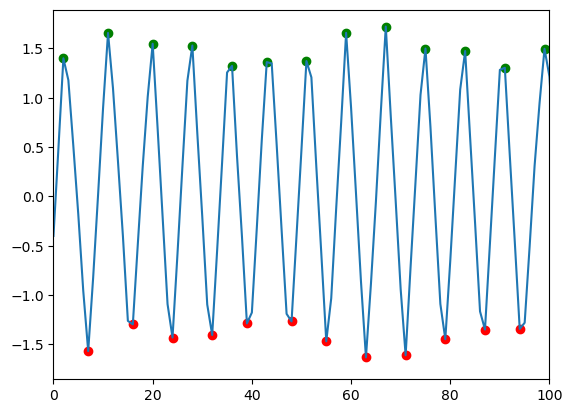

In [728]:
diffs_horiz =np.diff(exSideSide) 

# Find indices where vec[i-1] > 0 and vec[i] < 0
indices_pos_to_neg_temp = np.where((diffs_horiz[1:] < 0) & (diffs_horiz[:-1] > 0))[0] + 1
indices_pos_to_neg = [i for i in indices_pos_to_neg_temp if exSideSide[i] > 0.9]

# Find indices where vec[i-1] < 0 and vec[i] > 0
indices_neg_to_pos_temp = np.where((diffs_horiz[1:] > 0) & (diffs_horiz[:-1] < 0))[0] + 1
indices_neg_to_pos = [i for i in indices_neg_to_pos_temp if exSideSide[i] < -0.9]

plt.plot(exSideSide, label='sideSideZ')
plt.scatter(indices_pos_to_neg, exSideSide[indices_pos_to_neg], color='g', label='Pos to Neg')
plt.scatter(indices_neg_to_pos, exSideSide[indices_neg_to_pos], color='r', label='Neg to Pos')
plt.xlim([0,100])

backwindow = 5
forwindow = 10

trial_periods_posneg = [indices_pos_to_neg[i] for i in range(len(indices_pos_to_neg)) if indices_pos_to_neg[i] - backwindow > 0 and indices_pos_to_neg[i] + forwindow < len(exSideSide)]
trial_periods_negpos = [indices_neg_to_pos[i] for i in range(len(indices_neg_to_pos)) if indices_neg_to_pos[i] - backwindow > 0 and indices_neg_to_pos[i] + forwindow < len(exSideSide)]

print(len(trial_periods_posneg), len(trial_periods_negpos))

def create_cube(matrix, trial_indices, for_window, back_window, behavior_signal):
    trials = []
    print(f'{len(trial_indices)}: number of trials')
    behav_trials = []
    for ind in trial_indices:
        # print(ind-back_window,ind+for_window)        
        trials.append(matrix[:,ind-back_window:ind+for_window])
        behav_trials.append(behavior_signal[ind-back_window:ind+for_window])
    behav_trials = np.vstack(behav_trials)
    
    return np.dstack(trials), behav_trials

posneg_cube_vx, behav_posneg = create_cube(voxels_activity_zscore, trial_periods_posneg, forwindow, backwindow, exSideSide)
negpos_cube_vx, behav_negpos = create_cube(voxels_activity_zscore, trial_periods_negpos, forwindow, backwindow, exSideSide)

Text(0, 0.5, 'Side to Side Position')

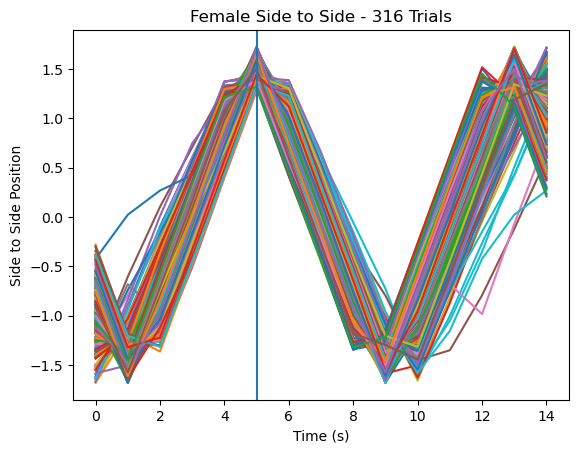

In [156]:
plt.plot(behav_posneg.T)
plt.axvline(5)
plt.title('Female Side to Side - 316 Trials')
plt.xlabel('Time (s)')
plt.ylabel('Side to Side Position')

In [140]:
most_anterior_voxel.shape

(15, 316)

Text(0, 0.5, 'Z-scored Activity')

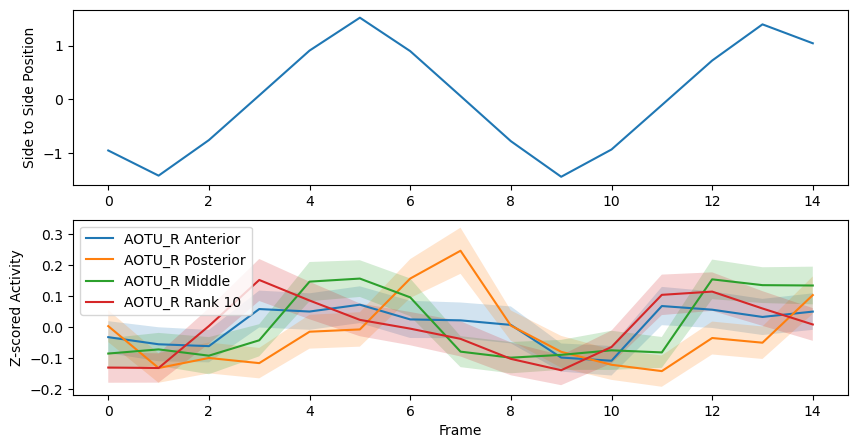

In [738]:
zscore_cube_apsort = posneg_cube_vx[ap_sort_inds,:,:]

most_anterior_voxel = zscore_cube_apsort[0,:,:]
rank10_anterior_voxel = zscore_cube_apsort[19,:,:]
middle_voxel = zscore_cube_apsort[int(zscore_cube_apsort.shape[0]/2),:,:]
most_posterior_voxel = zscore_cube_apsort[-1,:,:]

aot_anterior = np.mean(most_anterior_voxel, axis=1)
sem_anterior = np.std(most_anterior_voxel, axis=1) / np.sqrt(most_anterior_voxel.shape[1])
aot_middle = np.mean(middle_voxel, axis=1)
sem_middle = np.std(middle_voxel, axis=1) / np.sqrt(middle_voxel.shape[1])
aot_posterior = np.mean(most_posterior_voxel, axis=1)
sem_posterior = np.std(most_posterior_voxel, axis=1) / np.sqrt(most_posterior_voxel.shape[1])
aot_rank10 = np.mean(rank10_anterior_voxel, axis=1)
sem_rank10 = np.std(rank10_anterior_voxel, axis=1) / np.sqrt(rank10_anterior_voxel.shape[1])

mean_sideside = behav_posneg.mean(axis=0)
fig, ax = plt.subplots(2,1, figsize=(10, 5))
ax[0].plot(behav_posneg.mean(axis=0))
ax[1].plot(aot_anterior, label='AOTU_R Anterior')
ax[1].fill_between(np.arange(aot_anterior.shape[0]), aot_anterior - sem_anterior, aot_anterior + sem_anterior, alpha=0.2)
ax[1].plot(aot_posterior, label='AOTU_R Posterior')
ax[1].fill_between(np.arange(aot_posterior.shape[0]), aot_posterior - sem_posterior, aot_posterior + sem_posterior, alpha=0.2)
ax[1].plot(aot_middle, label='AOTU_R Middle')
ax[1].fill_between(np.arange(aot_middle.shape[0]), aot_middle - sem_middle, aot_middle + sem_middle, alpha=0.2)
ax[1].plot(aot_rank10, label='AOTU_R Rank 10')
ax[1].fill_between(np.arange(aot_rank10.shape[0]), aot_rank10 - sem_rank10, aot_rank10 + sem_rank10, alpha=0.2)

plt.legend()
ax[1].set_xlabel('Frame')
ax[0].set_ylabel('Side to Side Position')
ax[1].set_ylabel('Z-scored Activity')

In [151]:
zscore_cube_apsort.shape

(94, 20, 315)

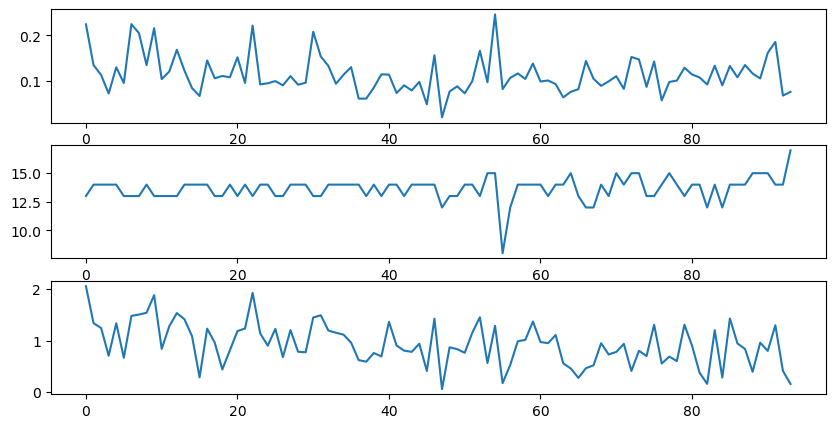

In [171]:
ap_zscore_maxes  =[]
ap_maxshifts = []
ap_maxcrosscorrs = []
for i in range(zscore_cube_apsort.shape[0]):
    mean_sig = zscore_cube_apsort[i,:,:].mean(axis=1)
    ap_zscore_maxes.append(mean_sig.max())
    cross_corr = np.correlate(mean_sig, mean_sideside,mode='full')
    maxshift = np.argmax(cross_corr)
    ap_maxshifts.append(maxshift)
    ap_maxcrosscorrs.append(cross_corr[maxshift])
fig, ax = plt.subplots(3,1, figsize=(10, 5))
ax[0].plot(ap_zscore_maxes)
ax[1].plot(ap_maxshifts)                
ax[2].plot(ap_maxcrosscorrs)

In [166]:
np.argmax(cross_corr)

np.int64(13)

(15, 316)
(15, 316)


Text(0.5, 0, 'Frame')

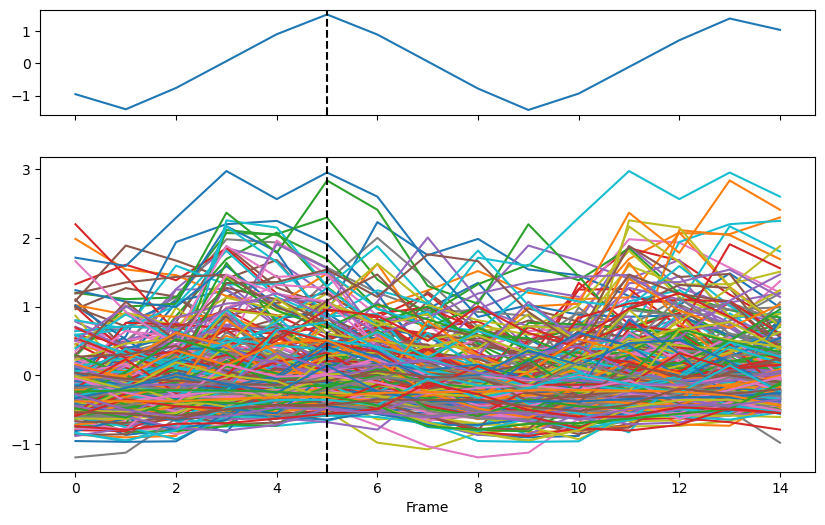

In [ ]:
top_ap_samples = np.mean(zscore_cube_apsort[:10,:,:], axis=0)
print(top_ap_samples.shape)
bottom_ap_samples = np.mean(zscore_cube_apsort[-10:,:,:], axis=0)
print(bottom_ap_samples.shape)

fig, ax = plt.subplots(2,1, figsize=(10, 6), sharex=True, gridspec_kw={'height_ratios': [1, 3]})
ax[0].plot(behav_posneg.mean(axis=0))
ax[1].plot(top_ap_samples)
ax[0].axvline(5, c='k', ls='--')
ax[1].axvline(5, c='k', ls='--')
ax[1].set_xlabel('Frame')

# SVD

In [739]:
print(voxels_activity_zscore.shape)
U,S,V = np.linalg.svd(voxels_activity_zscore)
print(U.shape, S.shape, V.shape)

(94, 2623)
(94, 94) (94,) (2623, 2623)


(0.0, 10.0)

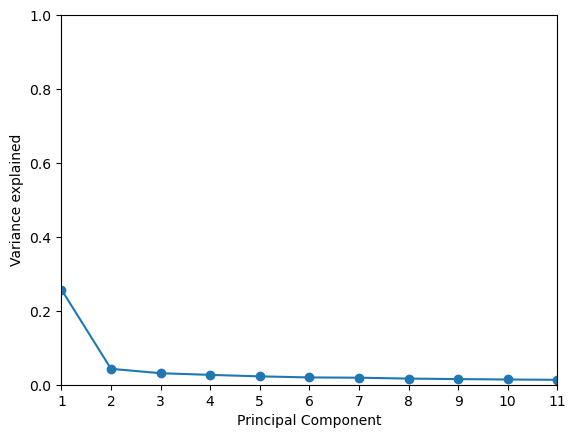

In [740]:
plt.plot(S**2/np.sum(S**2), '-o')
plt.ylabel('Variance explained')
plt.xlabel('Principal Component')
plt.xticks(np.arange(len(S)), np.arange(1, len(S)+1))
plt.ylim([0,1])
plt.xlim([0,10])

(-1.0, 1.0)

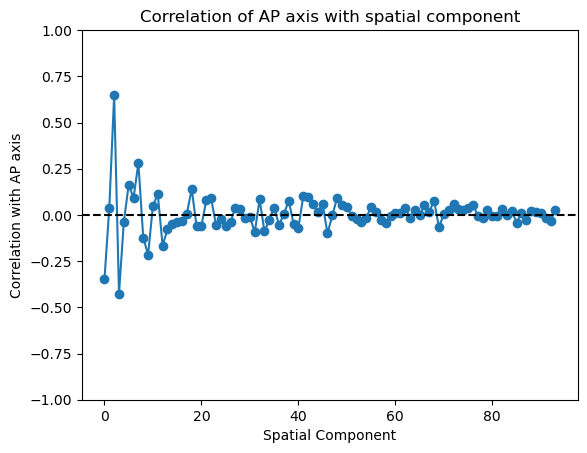

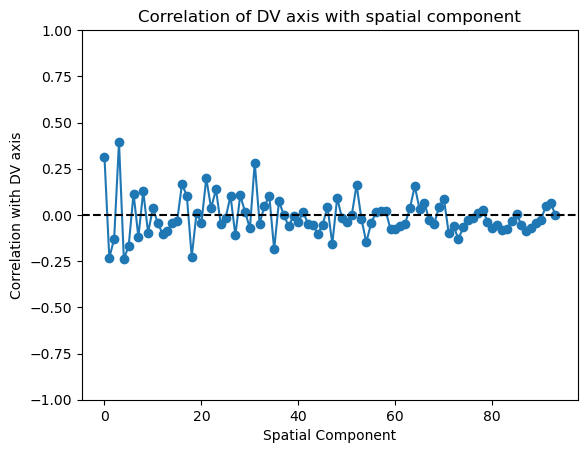

In [741]:
# plt.plot(U[:,0])
corrvals = []
corrvals_dv = []
for i in range(num_voxels_used):
    corrval = np.corrcoef(U[:,i], voxel_rf_subset[:,0])[0,1]
    corrvals.append(corrval)
    corrval_dv = np.corrcoef(U[:,i], voxel_rf_subset[:,1])[0,1]
    corrvals_dv.append(corrval_dv)
plt.plot(corrvals, '-o')
plt.title('Correlation of AP axis with spatial component')
plt.xlabel('Spatial Component')
plt.ylabel('Correlation with AP axis')
plt.axhline(0, color='k', ls='--')
plt.ylim([-1,1])
plt.figure()
plt.plot(corrvals_dv, '-o')
plt.title('Correlation of DV axis with spatial component')
plt.xlabel('Spatial Component')
plt.ylabel('Correlation with DV axis')
plt.axhline(0, color='k', ls='--')
plt.ylim([-1,1])

[[ 1.         -0.52869232]
 [-0.52869232  1.        ]]


Text(0, 0.5, 'Value')

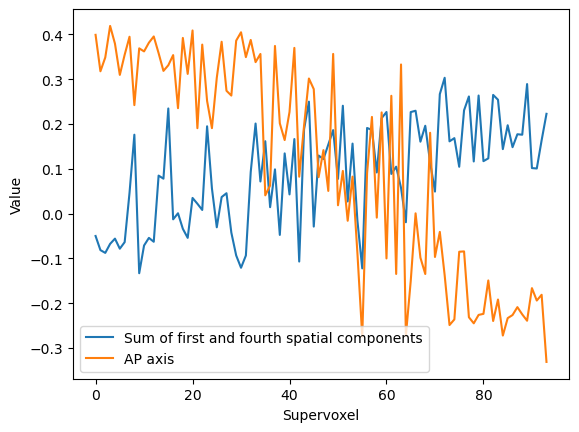

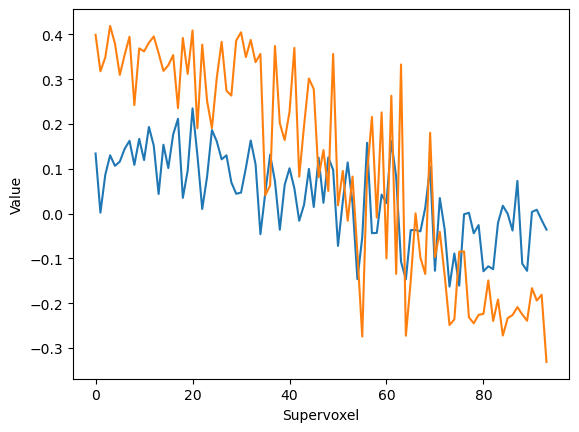

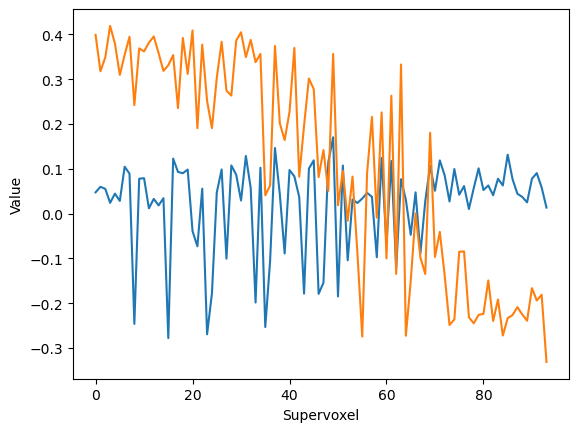

In [181]:
singvecs_03sum = U[:,0] + U[:,3]
print(np.corrcoef(singvecs_03sum, voxel_rf_subset[:,0]))
plt.plot(singvecs_03sum, label='Sum of first and fourth spatial components')
plt.plot(voxel_rf_subset[:,0], label='AP axis')
plt.xlabel('Supervoxel')
plt.ylabel('Value')
plt.legend()
plt.figure()
plt.plot(U[:,2], label='Third spatial component')
plt.plot(voxel_rf_subset[:,0], label='AP axis')
plt.xlabel('Supervoxel')
plt.ylabel('Value')

plt.figure()
plt.plot(U[:,1], label='Second spatial component')
plt.plot(voxel_rf_subset[:,0], label='AP axis')
plt.xlabel('Supervoxel')
plt.ylabel('Value')

Text(0.5, 1.0, 'Singular vector 3 loading vs AP axis')

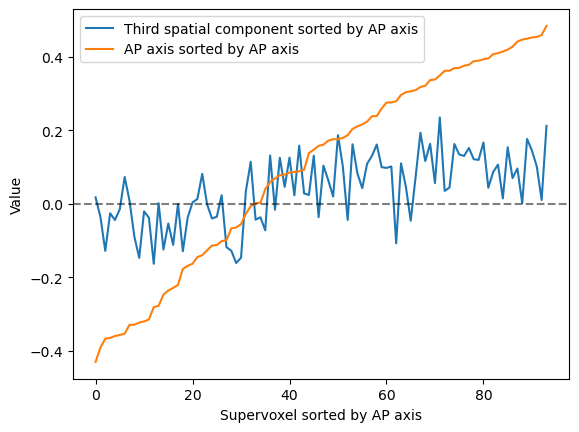

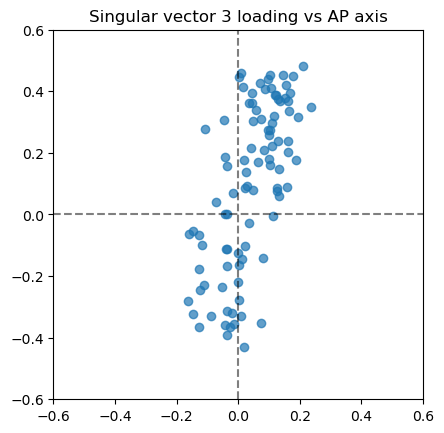

In [833]:
# plt.plot(U[ap_sort_inds,0], label='First spatial component sorted by AP axis')
plt.plot(U[ap_sort_inds,2], label='Third spatial component sorted by AP axis')
# plt.plot(U[ap_sort_inds,1])
# plt.plot(U[:,2], label='Third spatial component sorted by AP axis')


plt.plot(voxel_rf_subset[ap_sort_inds,0], label='AP axis sorted by AP axis')
plt.xlabel('Supervoxel sorted by AP axis')
plt.axhline(0, color='k', ls='--', alpha=0.5)
plt.ylabel('Value') 
plt.legend()

plt.figure()
plt.xlim([-0.6,0.6])
plt.ylim([-0.6,0.6])
plt.scatter(U[:,2], voxel_rf_subset[:,0], alpha=0.7)
plt.axvline(0, color='k', ls='--', alpha=0.5)
plt.axhline(0, color='k', ls='--', alpha=0.5)
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')
plt.title('Singular vector 3 loading vs AP axis')

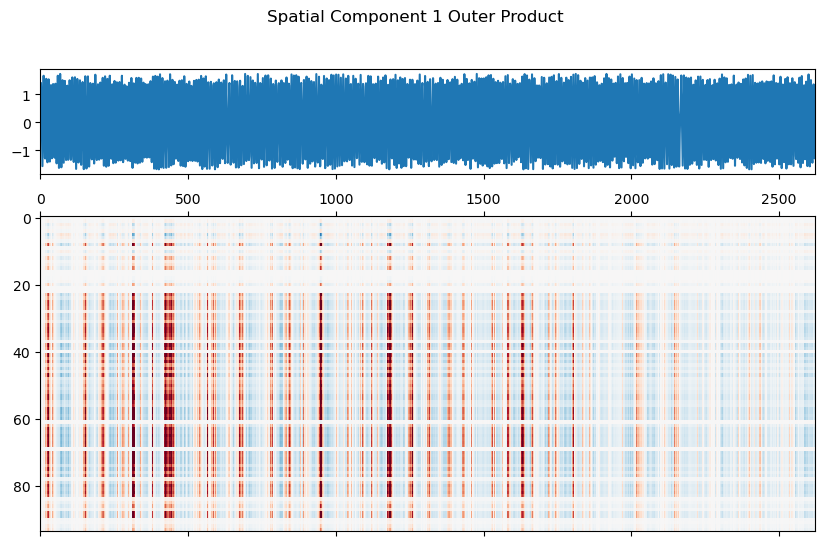

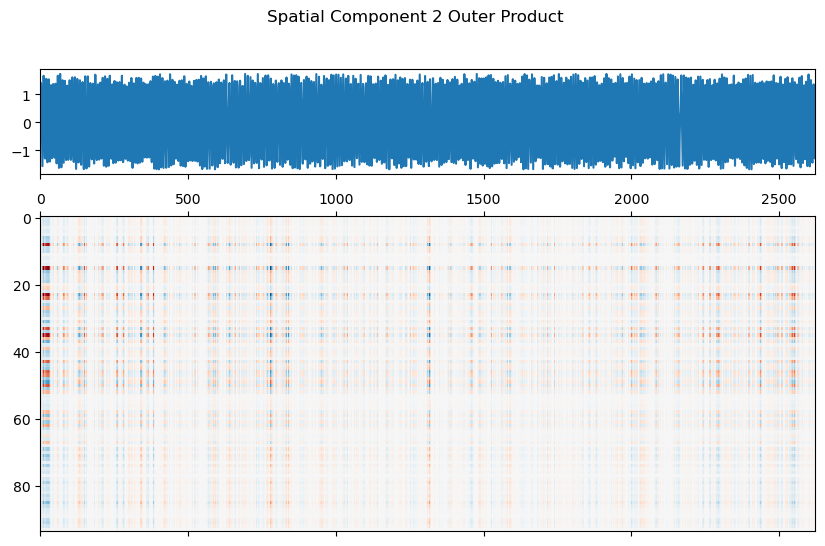

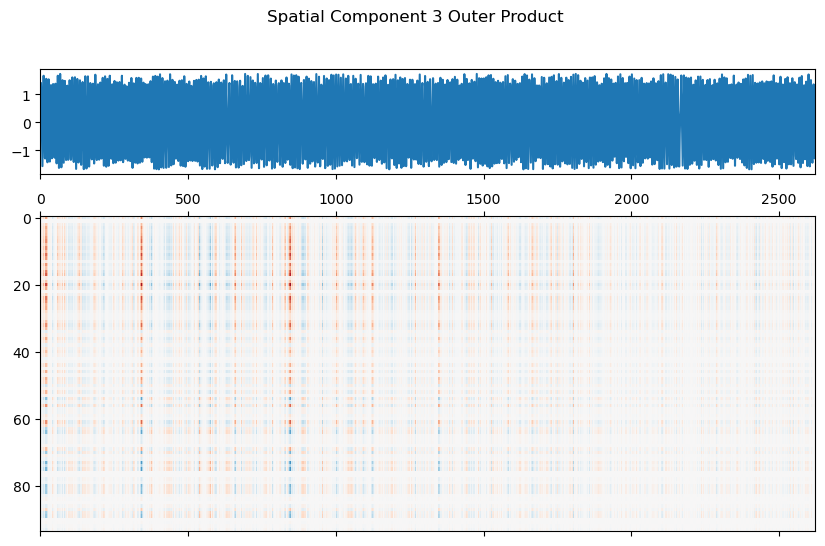

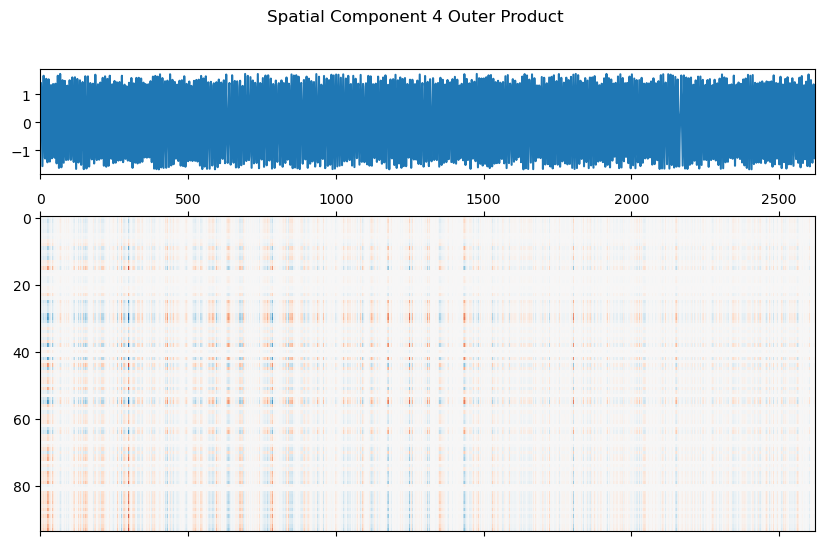

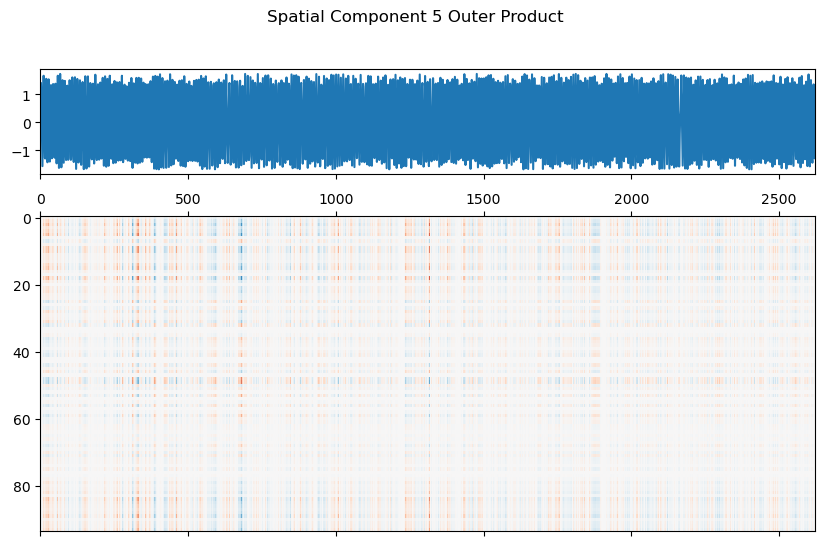

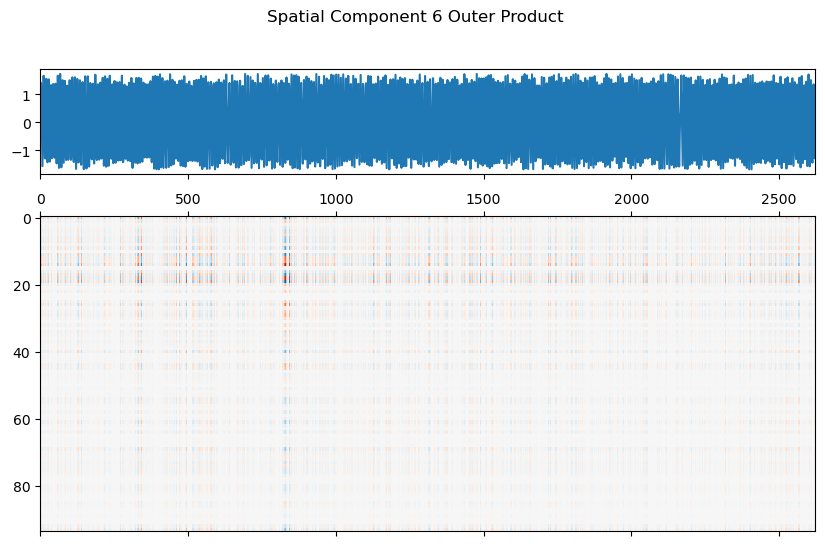

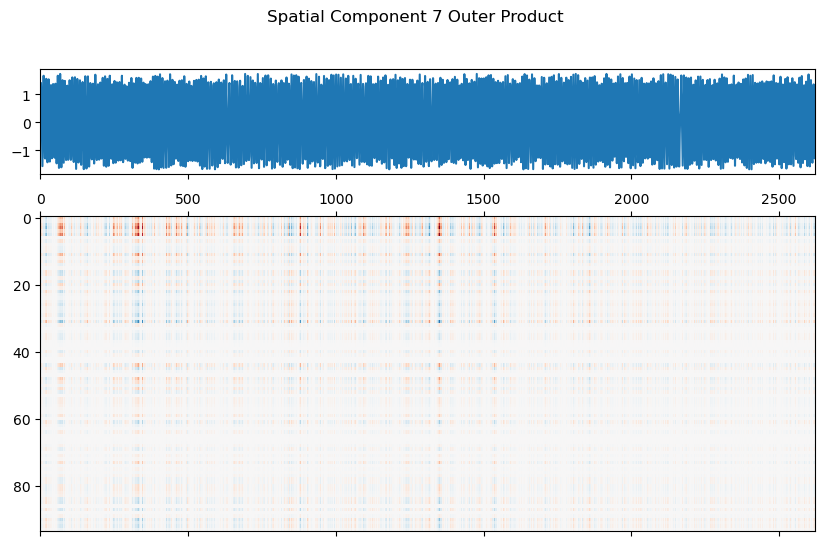

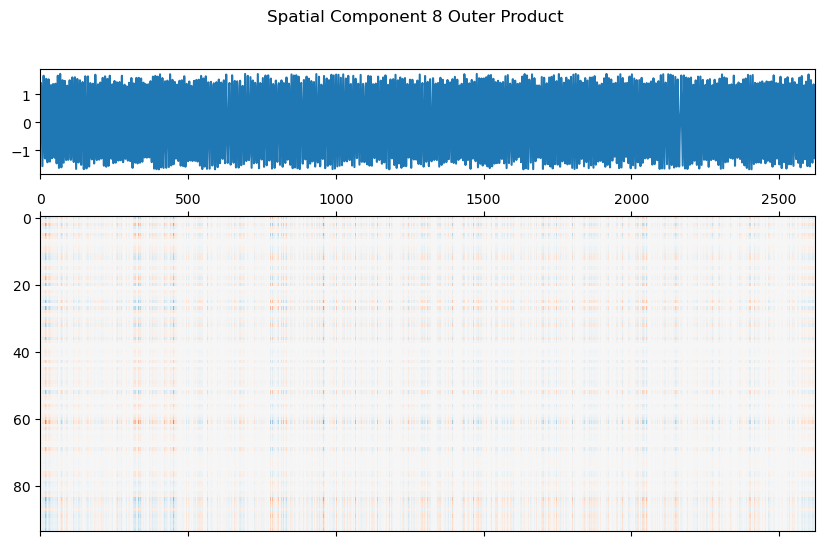

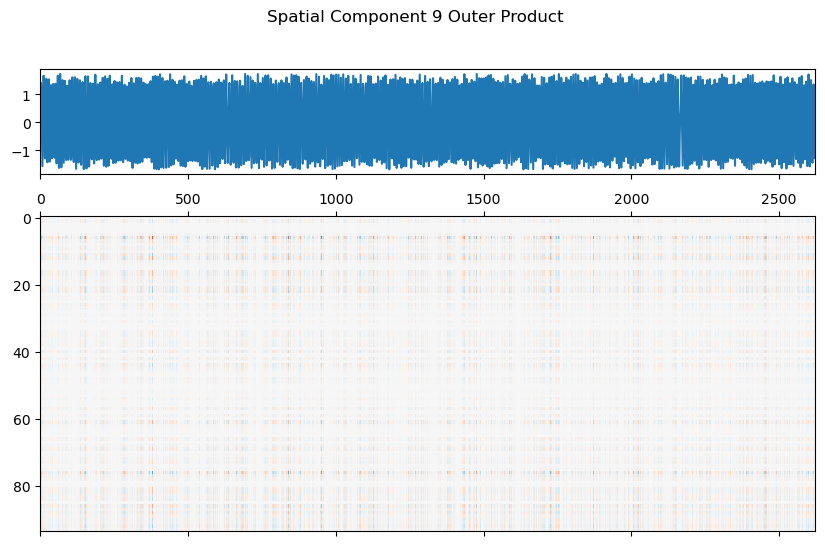

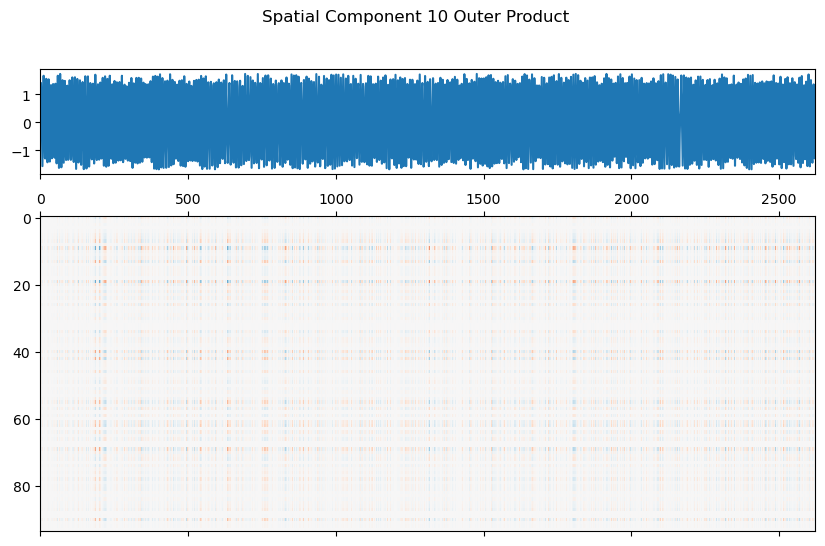

In [189]:
outerproducts = []
for i in range(num_voxels_used):
    outerproducts.append(np.outer(U[:,i], V[i,:]) * S[i])

for i in range(10):
    fig, ax = plt.subplots(2,1, figsize=(10,6), sharex=True, gridspec_kw={'height_ratios': [1, 3]})
    ax[0].plot(exSideSide)
    ax[1].matshow(outerproducts[i], cmap='RdBu_r', vmin=-2.5, vmax=2.5, aspect='auto')
    fig.suptitle(f'Spatial Component {i+1} Outer Product')


In [793]:
put_spatial_map0 = U[:,[0]] @ V[[0],:] * S[0]
put_spatial_map1 = U[:,[1]] @ V[[1],:] * S[1]
put_spatial_map2 = U[:,[2]] @ V[[2],:] * S[2]
put_spatial_map3 = U[:,[3]] @ V[[3],:] * S[3]

In [799]:
def visualize_matrix(matrix, opn=2, timerange=[100,200], sort_axis=ap_sort_inds, sort_label='AP' ):
    time = np.arange(matrix.shape[1])/2
    fig, ax = plt.subplots(3,1,figsize=(10, 8), sharex=True, gridspec_kw={'height_ratios': [1, 1, 3]})
    ax[0].plot(time,exSideSide)
    ax[0].set_ylabel('Side Side Position')
    ax[1].plot(time,exmfDistZ)
    ax[1].set_ylabel('Distance Z')
    im = ax[2].imshow(
        matrix[sort_axis],
        aspect='auto',
        cmap='RdBu_r',
        vmin=-1.5,
        vmax=1.5,
        extent=[time[0], time[-1], 0, matrix[ap_sort_inds].shape[0]]
    )
    plt.xlim(timerange)
    ax[2].set_ylabel(f'Supervoxels sorted by {sort_label} axis')
    ax[2].set_xlabel('Time (s)')
    fig.suptitle(f'AOTU_R LC10a Boutons: Outerproduct {opn} - example session')
    # fig.colorbar(im, ax=ax[2], orientation='vertical', fraction=0.03, pad=0.04, label='Activity')

    fig.tight_layout()
    # sns.heatmap(put_spatial_map3[ap_sort_inds], vmin=-2.5, vmax=2.5, cmap='RdBu_r', cbar_kws={'label': 'Activity'}, xticklabels=50, yticklabels=50)

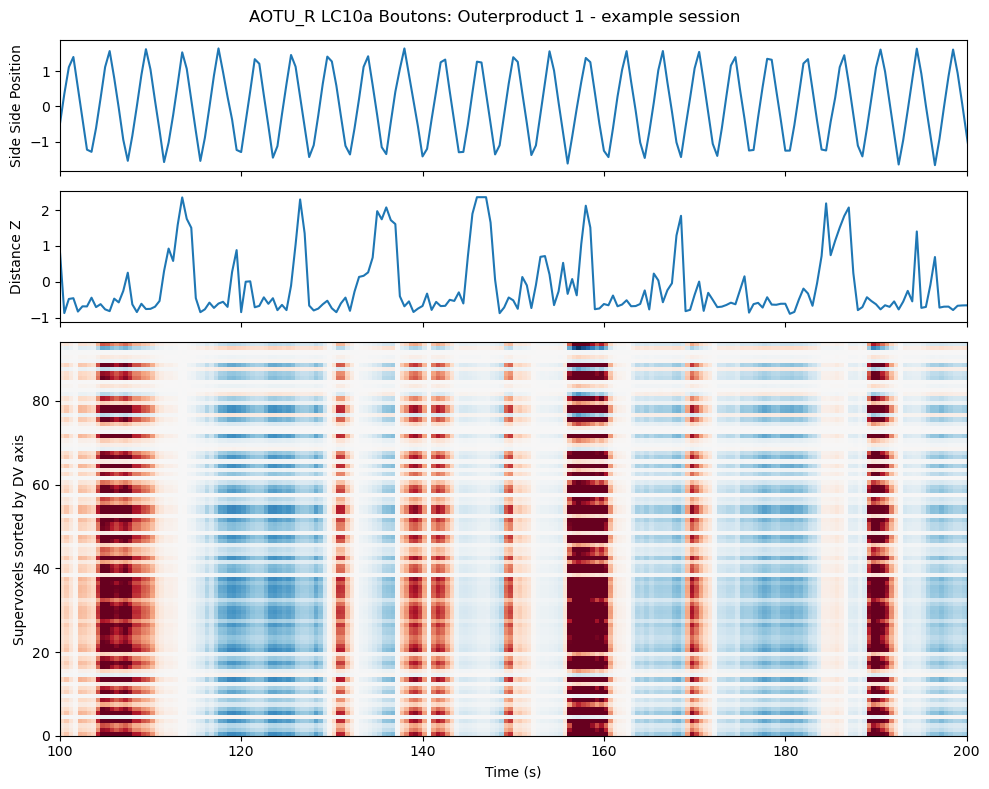

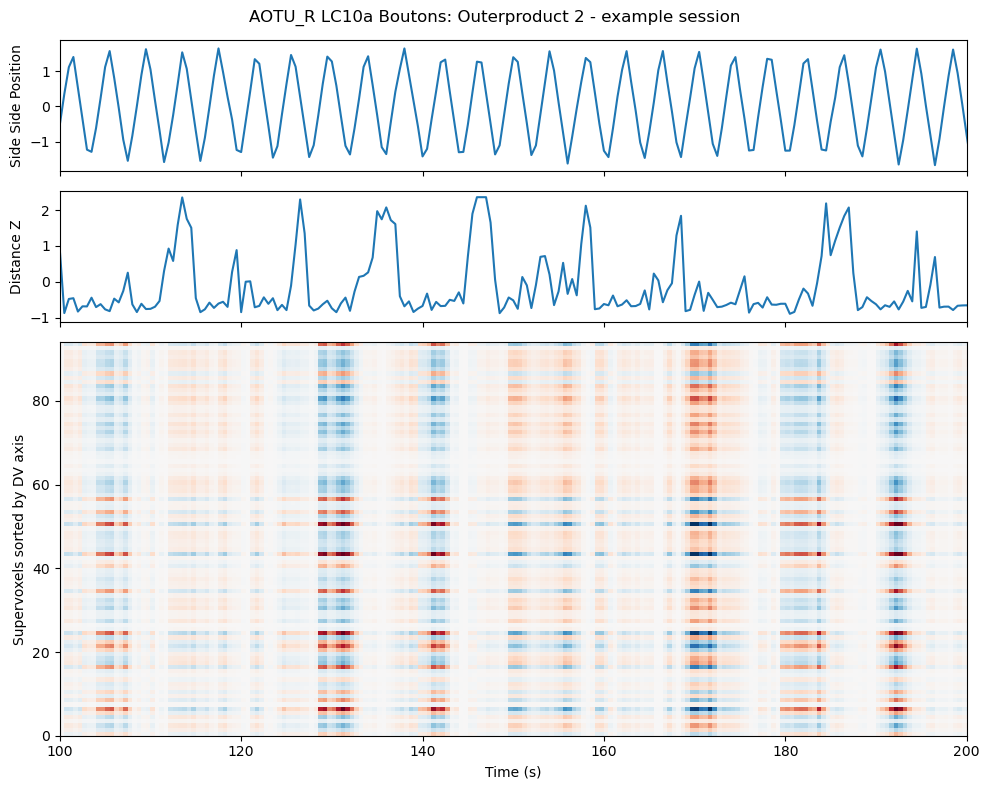

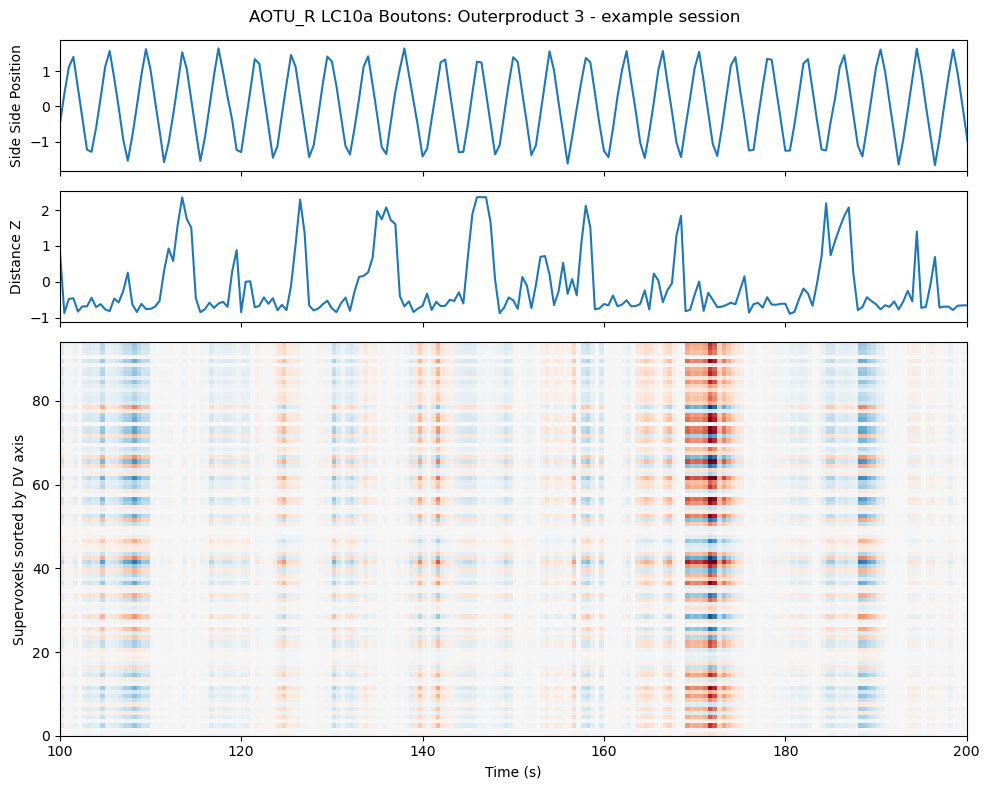

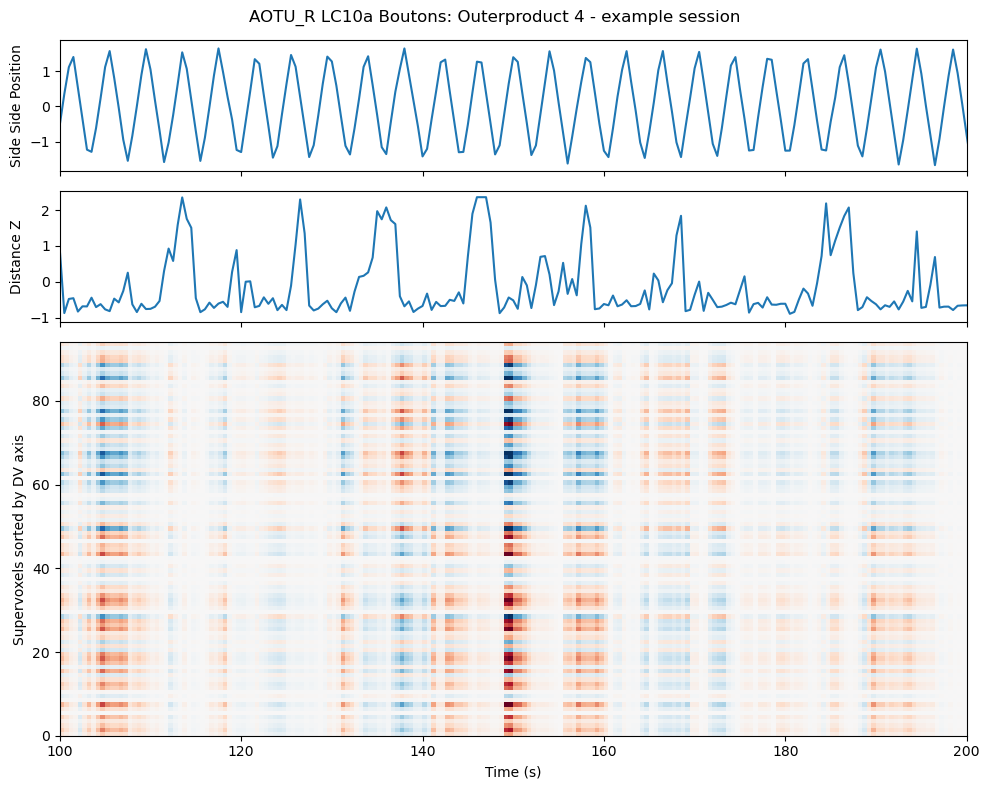

In [800]:
visualize_matrix(put_spatial_map0, opn=1, sort_axis=dv_sort_inds, sort_label='DV')
visualize_matrix(put_spatial_map1, opn=2, sort_axis=dv_sort_inds, sort_label='DV')
visualize_matrix(put_spatial_map2, opn=3, sort_axis=dv_sort_inds, sort_label='DV')
visualize_matrix(put_spatial_map3, opn=4, sort_axis=dv_sort_inds, sort_label='DV')

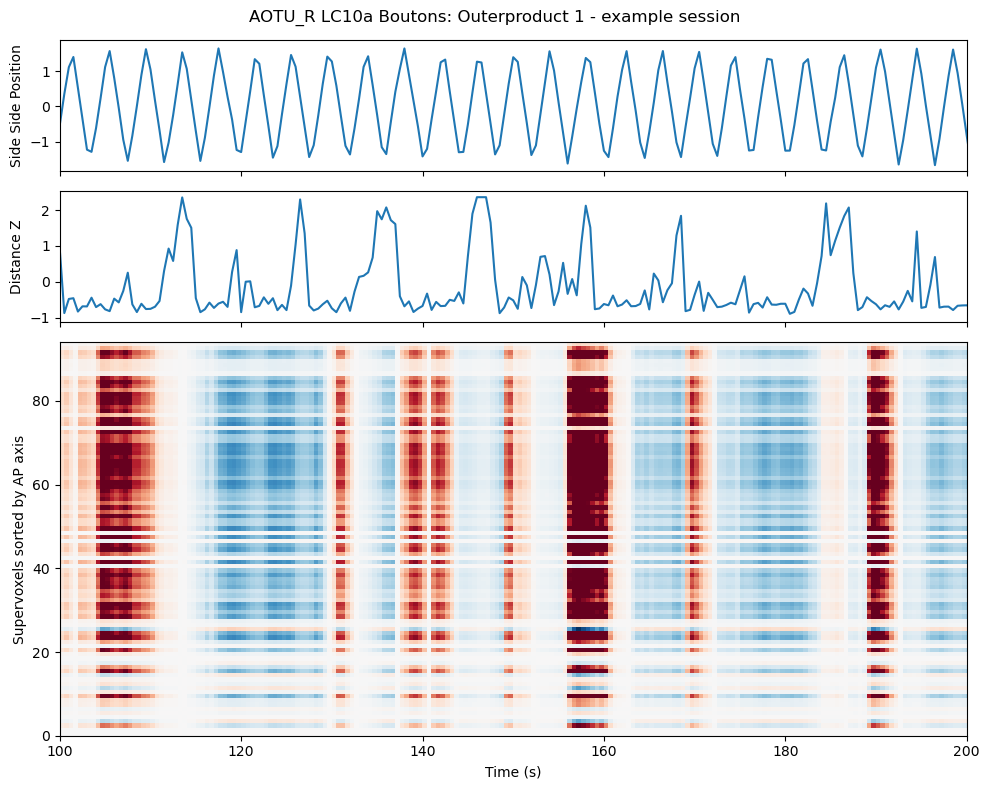

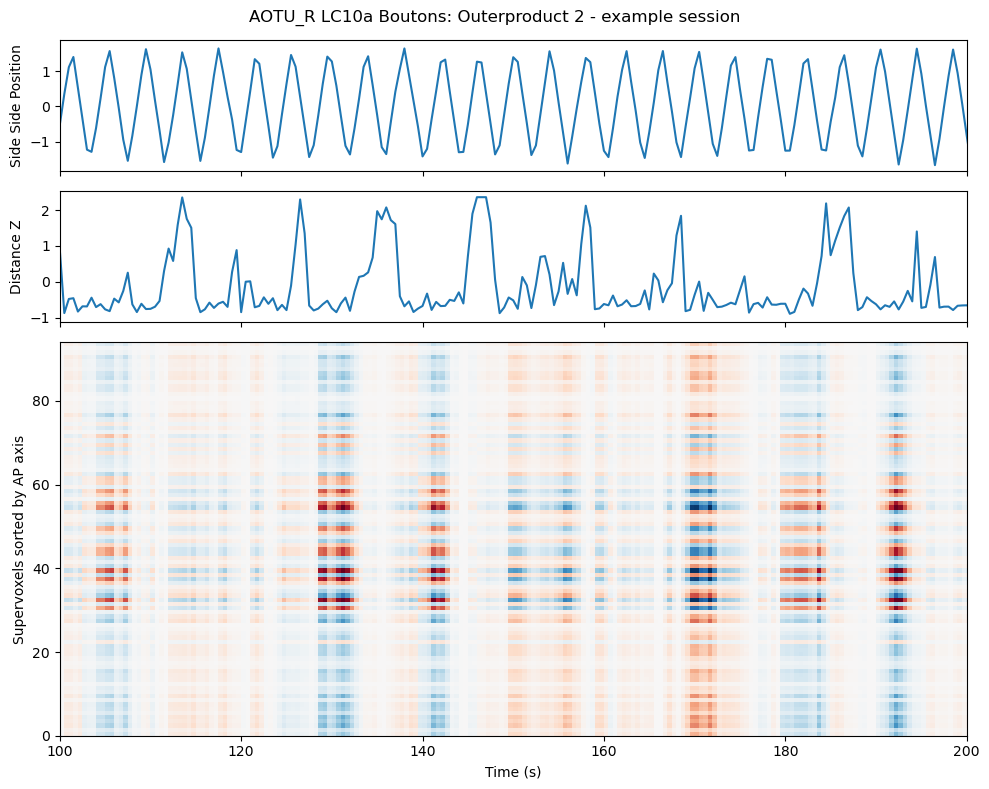

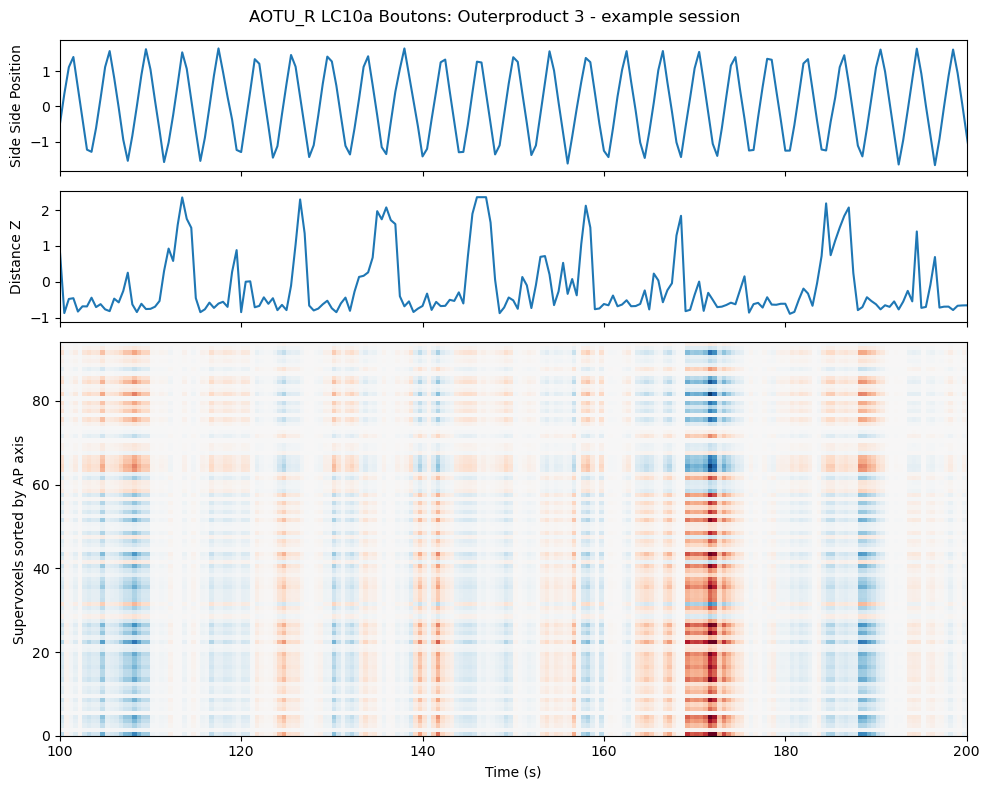

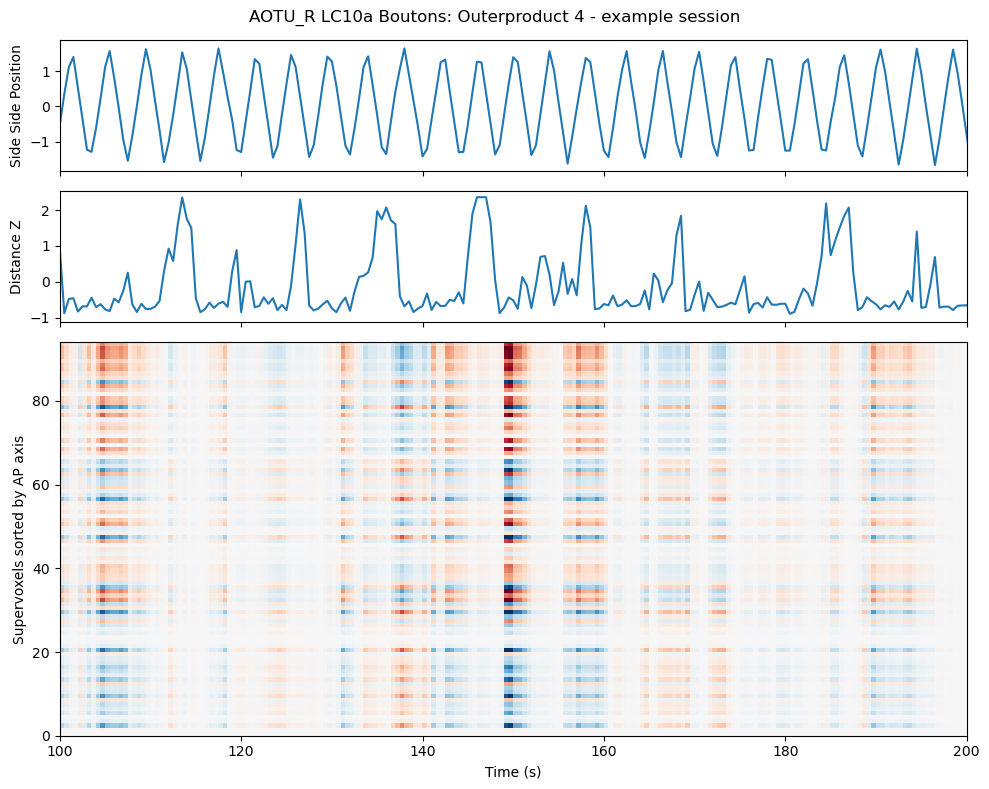

In [796]:
visualize_matrix(put_spatial_map0, opn=1)
visualize_matrix(put_spatial_map1, opn=2)
visualize_matrix(put_spatial_map2, opn=3)
visualize_matrix(put_spatial_map3, opn=4)

In [803]:
utils.interactive_plot(supervox_pos_aotu[voxel_subset,0], supervox_pos_aotu[voxel_subset,1], supervox_pos_aotu[voxel_subset,2], color_list=np.squeeze(U[:,4]), title='AOTU_R LC10a Supervoxels: colored by loading on SingVec3', cmap='Spectral_r', marker_size=10, vmin=-0.2, vmax=0.2)

In [802]:
utils.interactive_plot(supervox_pos_aotu[voxel_subset,0], supervox_pos_aotu[voxel_subset,1], supervox_pos_aotu[voxel_subset,2], color_list=np.squeeze(U[:,2]), title='AOTU_R LC10a Supervoxels: colored by loading on SingVec3', cmap='Spectral_r', marker_size=10, vmin=-0.2, vmax=0.2)

In [804]:
posneg_cube_spatmap,_ = create_cube(put_spatial_map2, trial_periods_posneg, forwindow, backwindow, exSideSide)
# negpos_cube_spatmap,_ = create_cube(put_spatial_map, trial_periods_negpos, forwindow, backwindow, exSideSide)

# posneg_cube_spatmap0, _ = create_cube(put_spatial_map0, trial_periods_posneg, forwindow, backwindow, exSideSide)
# posneg_cube_spatmap3, _ = create_cube(put_spatial_map3, trial_periods_posneg, forwindow, backwindow, exSideSide)

316: number of trials


In [557]:
behav_posneg.shape

(317, 15)

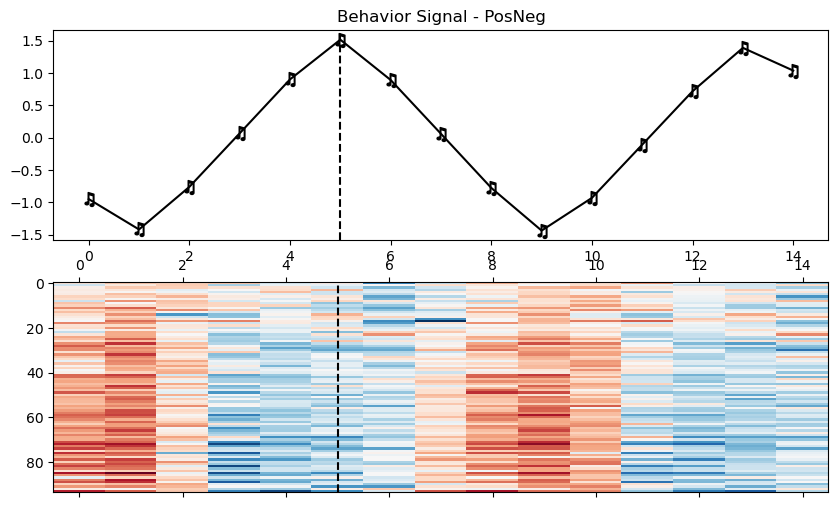

In [567]:
behav_posneg_mean = np.mean(behav_posneg, axis=0)
fig, ax = plt.subplots(2,1, figsize=(10, 6))
ax[0].plot(behav_posneg_mean, label='behav posneg mean', marker='$\u266B$', markersize=10, color='k')
ax[0].set_title('Behavior Signal - PosNeg')
ax[1].matshow(posneg_cube_vx.mean(axis=2), aspect='auto', cmap='RdBu')
ax[0].axvline(backwindow, color='k', ls='--')
ax[1].axvline(backwindow, color='k', ls='--')


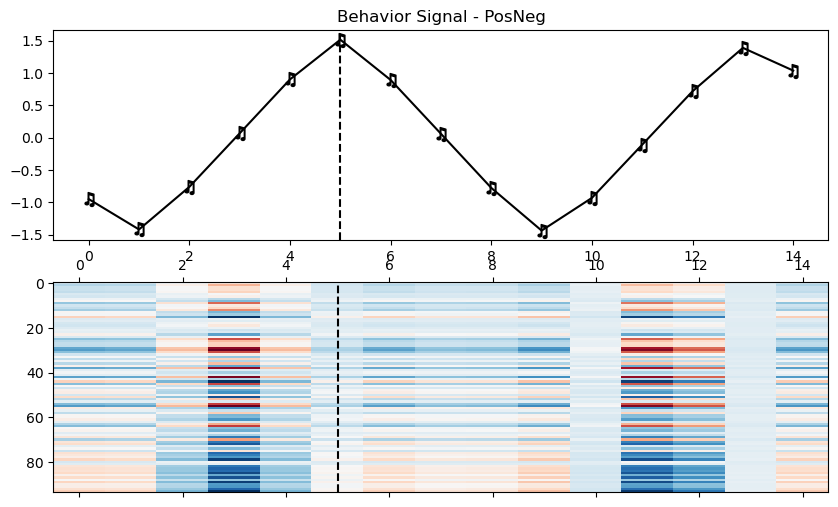

In [575]:
behav_posneg_mean = np.mean(behav_posneg, axis=0)
fig, ax = plt.subplots(2,1, figsize=(10, 6))
ax[0].plot(behav_posneg_mean, label='behav posneg mean', marker='$\u266B$', markersize=10, color='k')
ax[0].set_title('Behavior Signal - PosNeg')
ax[1].matshow(posneg_cube_spatmap3.mean(axis=2), aspect='auto', cmap='RdBu')
ax[0].axvline(backwindow, color='k', ls='--')
ax[1].axvline(backwindow, color='k', ls='--')


In [834]:
np.argsort(U[:,2])

array([73, 75, 64, 54, 80, 89, 70, 82, 81, 88, 63, 74, 50, 55, 34, 78, 57,
       58, 67, 86, 65, 66, 38, 93, 72, 79, 83, 42, 92, 76, 85, 77,  1, 90,
       91, 22, 68, 45, 84, 43, 53, 60, 47, 51, 71, 18, 59, 13, 29, 35, 30,
       41, 39, 28, 37, 87, 62, 23,  2, 19, 49, 44, 40, 15, 31, 69,  4,  8,
       33, 52,  5, 10, 26, 46, 48, 27,  3, 21, 36,  0,  6, 12, 14, 56, 25,
       61,  7, 32,  9, 16, 24, 11, 17, 20])

In [836]:
toprank_anterior.shape

(15,)

(94, 15)


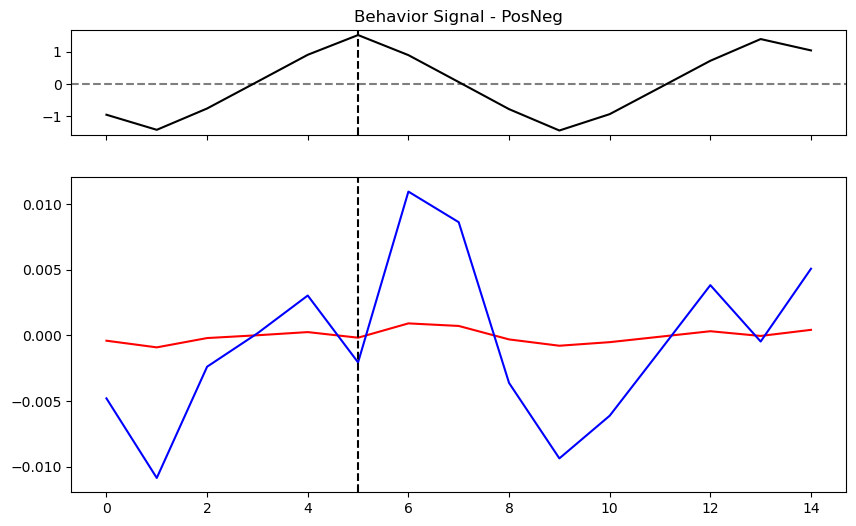

In [837]:
tmean_spatmap = posneg_cube_spatmap.mean(axis=2)[ap_sort_inds,:]
print(tmean_spatmap.shape)
toprank_anterior = tmean_spatmap[20,:]
# middle_voxels = tmean_spatmap[45:50,:]
toprank_posterior = tmean_spatmap[73,:]
fig, ax = plt.subplots(2,1, figsize=(10, 6), sharex=True, gridspec_kw={'height_ratios': [1, 3]})
ax[0].plot(behav_posneg_mean, label='behav posneg mean', markersize=10, color='k')
ax[0].set_title('Behavior Signal - PosNeg')
ax[0].axhline(0, color='k', ls='--', alpha=0.5)

ax[1].plot(toprank_anterior.T, c='Red')
# ax[1].plot(middle_voxels.T, c='Green')
ax[1].plot(toprank_posterior.T, c='Blue')
ax[0].axvline(backwindow, color='k', ls='--')
ax[1].axvline(backwindow, color='k', ls='--')


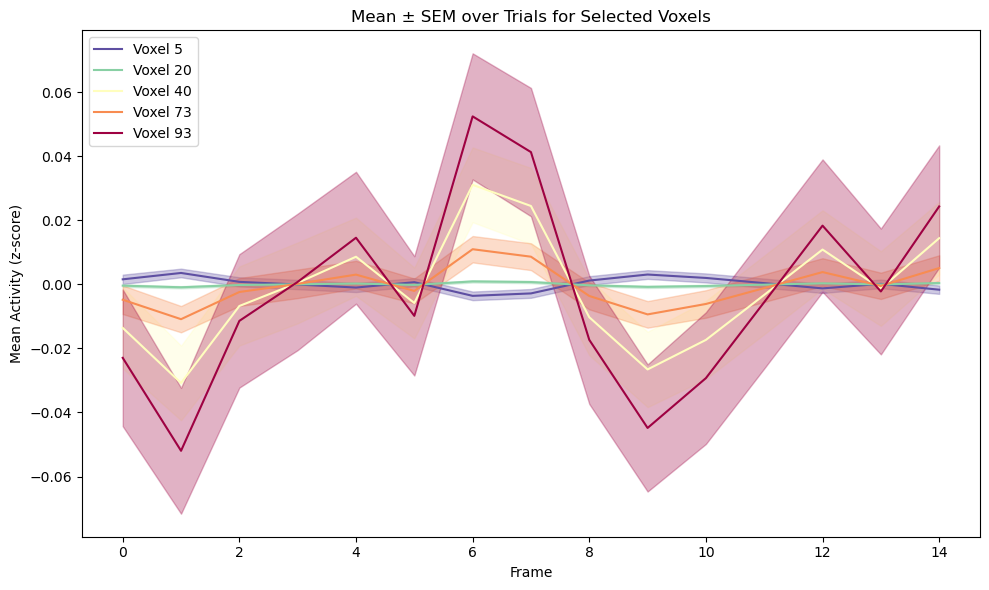

In [831]:
# --- Plot mean ± SEM for selected voxels with color mapping ---

import matplotlib.pyplot as plt
import numpy as np

# Compute mean and SEM over trials (axis=2)
reorg_spatmap = posneg_cube_spatmap[ap_sort_inds,:,:]  # shape: (voxels, time, trials)
mean_spatmap = reorg_spatmap.mean(axis=2)  # shape: (voxels, time)
sem_spatmap = reorg_spatmap.std(axis=2) / np.sqrt(reorg_spatmap.shape[2])

# Select voxel indices to plot
voxel_indices = [5, 20, 40, 73, 93]

# Get colors from the "Spectral_r" colormap
cmap = plt.get_cmap("Spectral_r")
colors = cmap(np.linspace(0, 1, len(voxel_indices)))

time = np.arange(mean_spatmap.shape[1])  # x-axis (frames)
fig, ax = plt.subplots(figsize=(10, 6))

for i, (v_idx, color) in enumerate(zip(voxel_indices, colors)):
    mean_trace = mean_spatmap[v_idx]
    sem_trace = sem_spatmap[v_idx]
    ax.plot(time, mean_trace, label=f'Voxel {v_idx}', color=color)
    ax.fill_between(time, mean_trace - sem_trace, mean_trace + sem_trace, color=color, alpha=0.3)

ax.set_xlabel('Frame')
ax.set_ylabel('Mean Activity (z-score)')
ax.set_title('Mean ± SEM over Trials for Selected Voxels')
ax.legend()
plt.tight_layout()
plt.show()

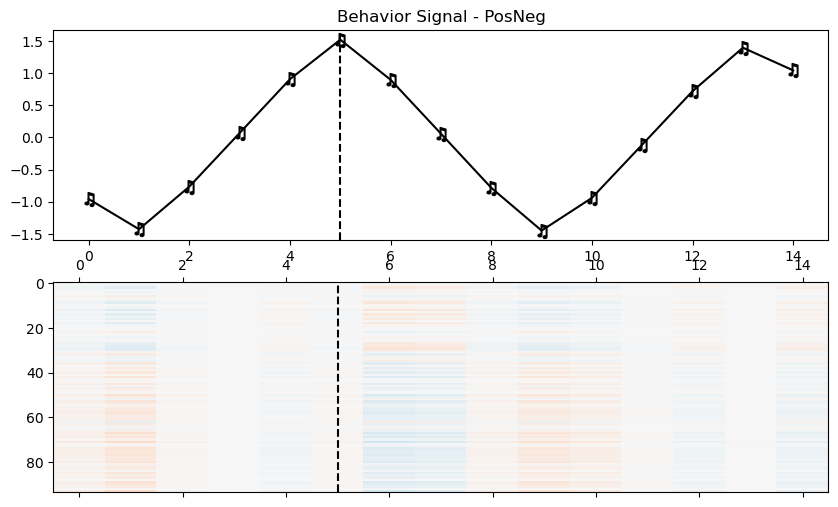

In [810]:
behav_posneg_mean = np.mean(behav_posneg, axis=0)
fig, ax = plt.subplots(2,1, figsize=(10, 6))
ax[0].plot(behav_posneg_mean, label='behav posneg mean', marker='$\u266B$', markersize=10, color='k')
ax[0].set_title('Behavior Signal - PosNeg')
ax[1].matshow(posneg_cube_spatmap.mean(axis=2)[ap_sort_inds], aspect='auto', cmap='RdBu', vmin=-0.3, vmax=0.3)
ax[0].axvline(backwindow, color='k', ls='--')
ax[1].axvline(backwindow, color='k', ls='--')


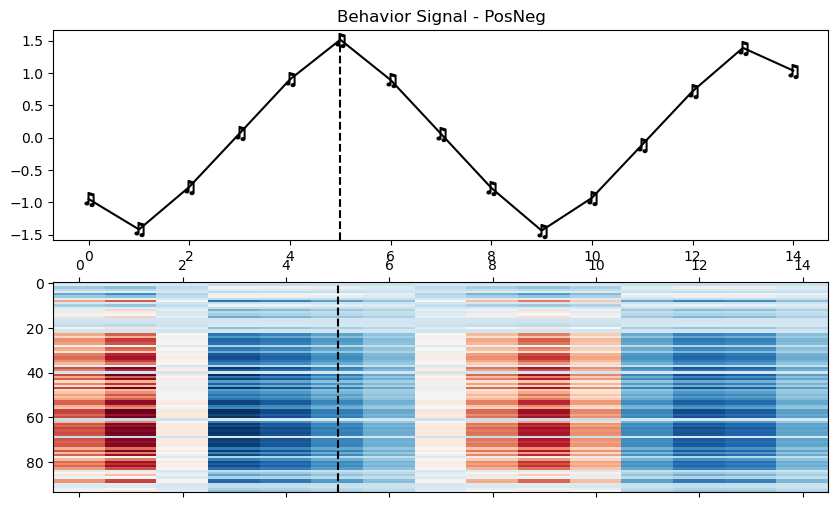

In [571]:
behav_posneg_mean = np.mean(behav_posneg, axis=0)
fig, ax = plt.subplots(2,1, figsize=(10, 6))
ax[0].plot(behav_posneg_mean, label='behav posneg mean', marker='$\u266B$', markersize=10, color='k')
ax[0].set_title('Behavior Signal - PosNeg')
ax[1].matshow(posneg_cube_spatmap0.mean(axis=2), aspect='auto', cmap='RdBu')
ax[0].axvline(backwindow, color='k', ls='--')
ax[1].axvline(backwindow, color='k', ls='--')


(200.0, 300.0)

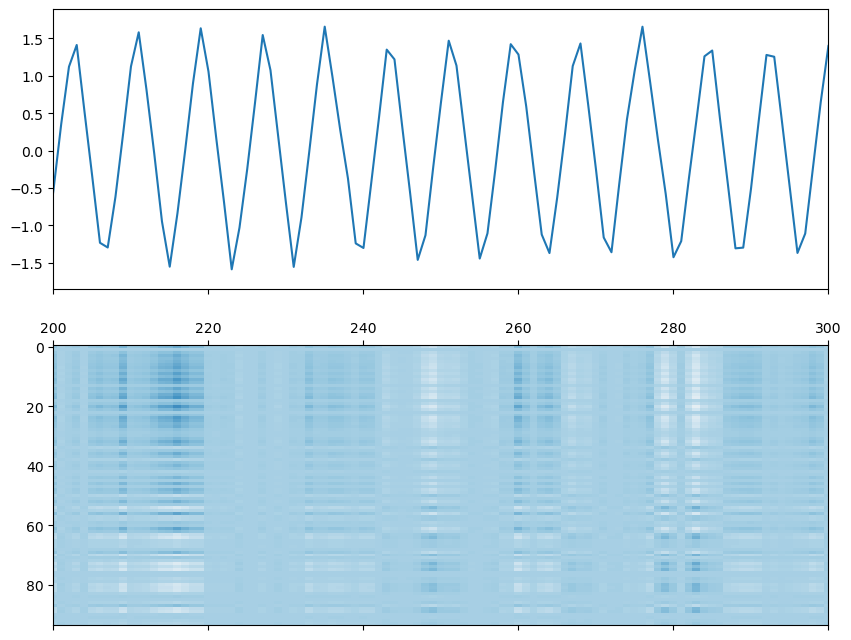

In [536]:
fig, ax = plt.subplots(2,1, figsize=(10, 8), sharex=True)
ax[0].plot(exSideSide)
ax[1].matshow(put_spatial_map, cmap='RdBu_r', vmin=-2.5, vmax=5, aspect='auto') 
ax[1].set_xlim([200,300])

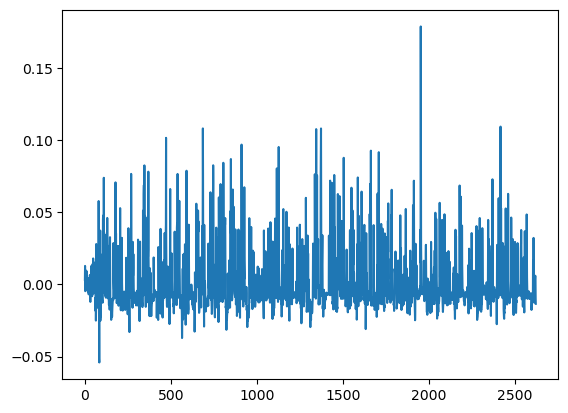

In [ ]:
put_spatial_map

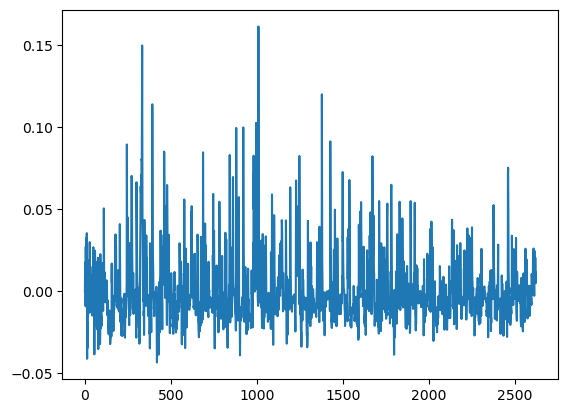

In [520]:
plt.plot(V[:,2])

In [468]:
for i in range(3):
    print((U[:,i] @ V[:,i].T).shape)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2623 is different from 94)

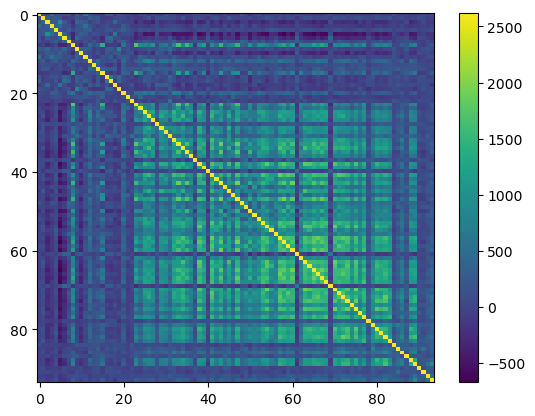

In [449]:
import scipy
covar_mat = (voxels_activity_zscore @ voxels_activity_zscore.T)
plt.imshow(covar_mat, aspect='auto', cmap='viridis')
plt.colorbar()

eigenvalues, vl, vr = scipy.linalg.eig(covar_mat, left=True)


In [455]:
vr.shape

(94, 94)

(0.0, 10.0)

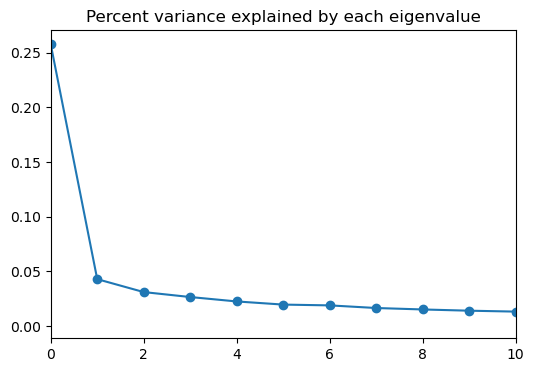

In [453]:
percent_var = eigenvalues.real/np.sum(eigenvalues.real)
plt.figure(figsize=(6,4))
plt.title("Percent variance explained by each eigenvalue")
plt.plot(percent_var, '-o')
plt.xlim([0,10])

In [ ]:
correlations_dict = defaultdict(list)
behavnames = ['sideSideZ', 'mfDistZ', 'mRSZ', 'mFSZ']
for behavname, signal in zip(behavnames, [exSideSide, exmfDistZ, exmFSZ, exmRSZ]):
    for voxel in voxels_activity_zscore:
        corrcoef = np.corrcoef(voxel, signal)[0,1]
        correlations_dict[behavname].append(corrcoef)

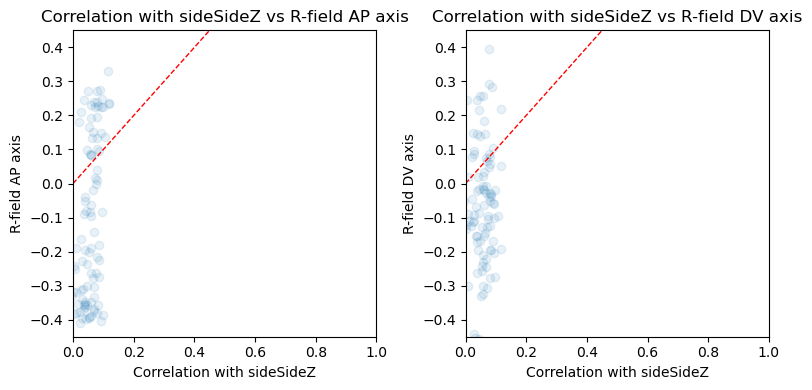

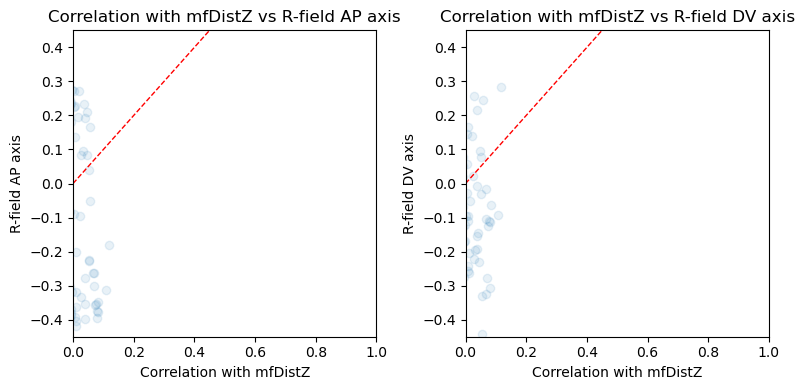

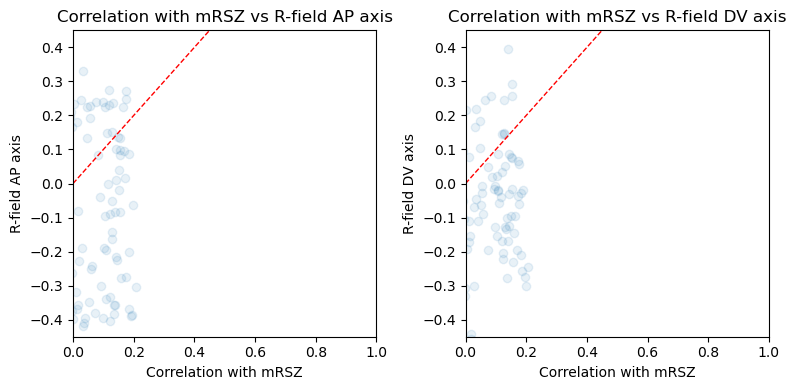

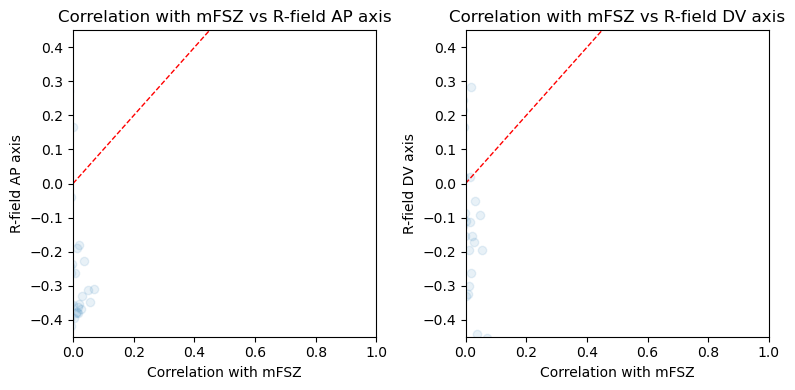

In [ ]:
for behavname, signal in zip(behavnames, [exSideSide, exmfDistZ, exmFSZ, exmRSZ]):
    fig, ax = plt.subplots(1,2, figsize=(8,4))
    ax[0].scatter(correlations_dict[behavname], voxel_rf_subset[:, 0], alpha=0.1)
    ax[0].set_xlabel(f'Correlation with {behavname}')
    ax[0].set_ylabel('R-field AP axis')
    ax[0].set_title(f'Correlation with {behavname} vs R-field AP axis') 
    ax[0].set_xlim([0,1])
    ax[0].set_ylim([-0.45,0.45])
    lims = [max(ax[0].get_xlim()[0], ax[0].get_ylim()[0]), min(ax[0].get_xlim()[1], ax[0].get_ylim()[1])]
    ax[0].plot(lims, lims, 'r--', lw=1)
    
    ax[1].scatter(correlations_dict[behavname], voxel_rf_subset[:, 1], alpha=0.1)
    ax[1].set_xlabel(f'Correlation with {behavname}')
    ax[1].set_ylabel('R-field DV axis')
    ax[1].set_title(f'Correlation with {behavname} vs R-field DV axis')
    ax[1].set_xlim([0,1])
    ax[1].set_ylim([-0.45,0.45])
    lims = [max(ax[1].get_xlim()[0], ax[1].get_ylim()[0]), min(ax[1].get_xlim()[1], ax[1].get_ylim()[1])]
    ax[1].plot(lims, lims, 'r--', lw=1)
    plt.tight_layout()
    plt.show()

(300.0, 500.0)

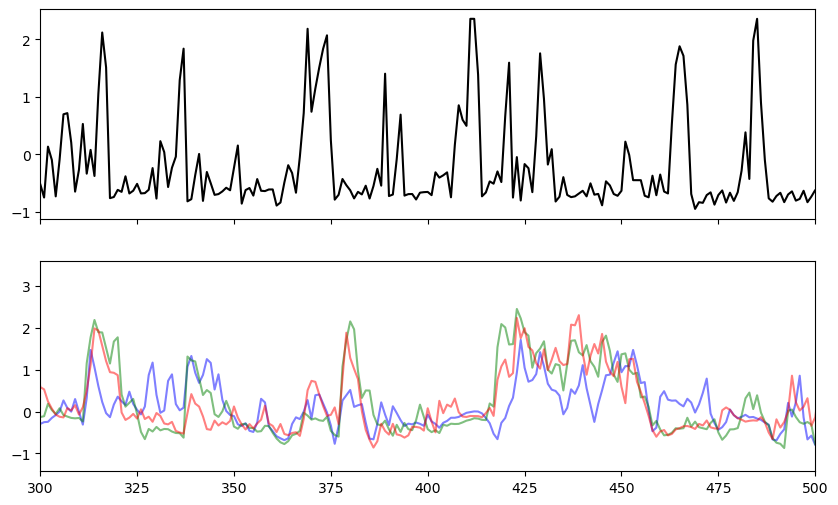

In [406]:
color_simple = np.arange(num_voxels_used)/num_voxels_used
posterior_mean = np.mean(voxels_activity_ap_sorted[:10], axis=0)
middle_mean = np.mean(voxels_activity_ap_sorted[40:50], axis=0)
anterior_mean = np.mean(voxels_activity_ap_sorted[-10:], axis=0)

fig, ax = plt.subplots(2,1, figsize=(10,6), sharex=True)
ax[0].plot(exmfDistZ, c='k')
ax[1].plot(posterior_mean, alpha=0.5, c='b')
ax[1].plot(middle_mean, alpha=0.5, c='g')
ax[1].plot(anterior_mean, alpha=0.5, c='r')
ax[1].set_xlim([300,500])

<Axes: title={'center': 'AOTU_R LC10a Supervoxels: colored by rfield DV axis'}>

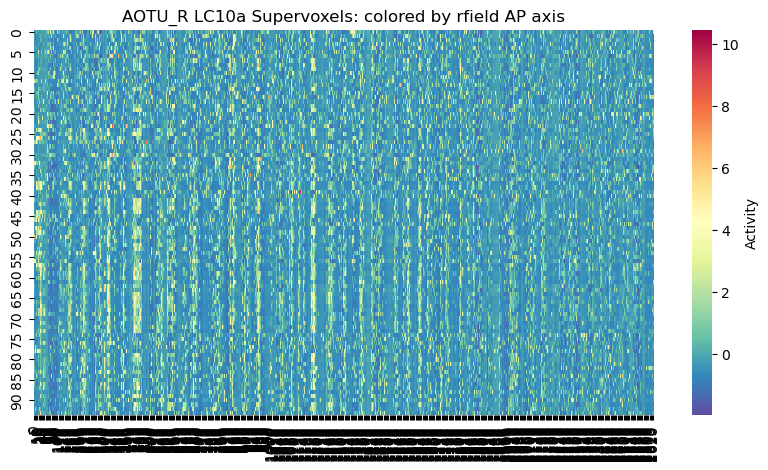

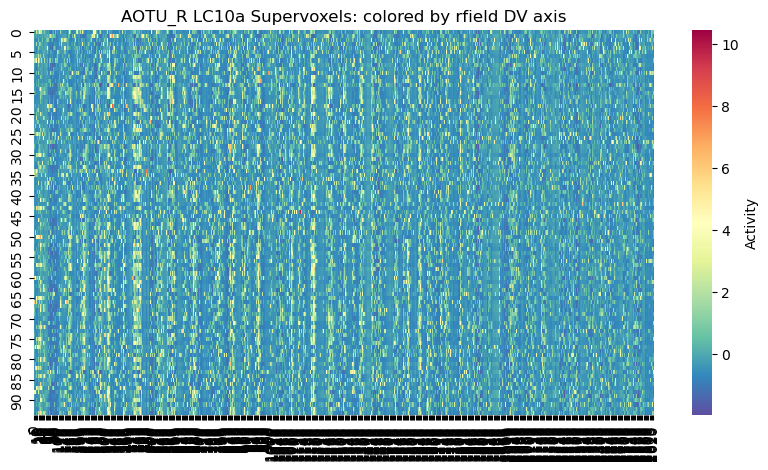

In [379]:
import seaborn as sns
plt.figure(figsize=(10, 5))
plt.title('AOTU_R LC10a Supervoxels: colored by rfield AP axis')
sns.heatmap(voxels_activity_ap_sorted, cmap='Spectral_r', cbar_kws={'label': 'Activity'}, xticklabels=5, yticklabels=5)
plt.figure(figsize=(10, 5))
plt.title('AOTU_R LC10a Supervoxels: colored by rfield DV axis')
sns.heatmap(voxels_activity_dv_sorted, cmap='Spectral_r', cbar_kws={'label': 'Activity'}, xticklabels=5, yticklabels=5)


In [360]:
ap_sort_inds

array([ 3, 20, 30,  0, 12,  7, 18, 32, 29, 26, 11,  4, 22, 37, 41,  9, 10,
       13, 49, 34,  6, 16, 31,  2, 33, 63, 15, 14,  1, 19,  5, 25, 44, 45,
       27, 28, 61, 23,  8, 17, 40, 59, 57, 38, 43, 24, 21, 69, 39, 47, 51,
       56, 53, 42, 46, 36, 48, 35, 50, 66, 58, 52, 71, 76, 75, 54, 70, 67,
       60, 62, 68, 72, 81, 65, 90, 92, 83, 91, 87, 80, 88, 79, 86, 77, 85,
       74, 89, 82, 78, 73, 84, 64, 55, 93])

# Monocular vs binocular

In [ ]:
# Load synpases
bino_left = np.load("bino_left.npy") * scale_factor
bino_right = np.load("bino_right.npy") * scale_factor

# Filter right
c, d = neuropilCenterDists["LO_R"]
keep = np.linalg.norm(bino_right - c, axis=1) < d
bino_right = bino_right[keep]

# Filter left
c, d = neuropilCenterDists["LO_L"]
keep = np.linalg.norm(bino_left - c, axis=1) < d
bino_left = bino_left[keep]

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

subset_keylist = lc10a_right_all['key_list_bouts'][inds_fda_aotu_r]
subset_boutons = lc10a_right_all['boutons'][inds_fda_aotu_r]
print(subset_boutons.shape)

subset_rf_centres = np.array([lc10a_rfields_right_dict[k] for k in subset_keylist])
normalize = lambda x: (x - np.nanmin(x)) / (np.nanmax(x) - np.nanmin(x))

colors_ap_axis= normalize(subset_rf_centres[:, 0])
colors_dv_axis = normalize(subset_rf_centres[:, 1])

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(*subset_boutons.T, c=colors_ap_axis, alpha=0.05, lw=0.1, cmap='RdBu')
# ax.scatter(*neuropilCenterDists['AOTU_R'][0], c='k', alpha=1.0)
plt.show()

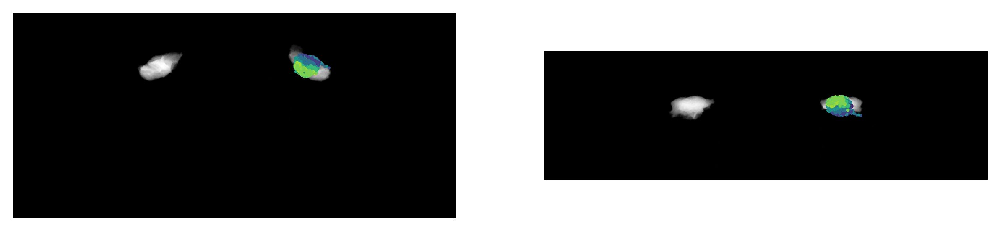

In [155]:
mask =  neuropilMasks["AOTU_R"] + neuropilMasks["AOTU_L"] #+ neuropilMasks["AOTU_L"] + neuropilMasks["AOTU_R"]
neuropil_projections = [np.rot90(mask.sum(axis=k))[::-1] for k in range(3)[::-1]]  # CORONAL, HORIZOTNAL, SAGITTAL
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)
for i, ax in enumerate(axes):
    ax.imshow(neuropil_projections[i], cmap="Grays_r")
    ax.axis("off")

axes[0].scatter(*subset_boutons[:, (0, 1)].T, c=colors_ap_axis, lw=0, s=3, cmap="viridis")
axes[1].scatter(*subset_boutons[:, (0, 2)].T, c=colors_ap_axis, lw=0, s=3, cmap="viridis")


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)
for i, ax in enumerate(axes):
    ax.imshow(neuropil_projections[i], cmap="Grays_r")
    ax.axis("off")

for syns in (bino_left, bino_right):

    zorder = np.argsort(syns[:, 2])[::-1]
    syns = syns[zorder]
    c = np.arange(len(syns))
    axes[0].scatter(*syns[:, (0, 1)].T, c=c, lw=0, s=3, cmap="viridis")

    yorder = np.argsort(syns[:, 1])[::-1]
    axes[1].scatter(*syns[yorder][:, (0, 2)].T, c=c[yorder], lw=0, s=3, cmap="viridis")

axes[0].set_title("Frontal view")
axes[1].set_title("Dorsal view")
plt.tight_layout()
# plt.savefig("lc14a1_pre_synapses_mapped.svg")

# Clean up data

In [ ]:
from sklearn.neighbors import KernelDensity

In [ ]:
kde_bino = KernelDensity(kernel="gaussian", bandwidth=30).fit(np.concatenate([bino_right, bino_left]))
thresh = -17

In [421]:
neuropilCenterDists['LO_L']

(array([405.52930314, 452.28414715, 340.08365059]), 200)

In [ ]:
data_clean = {}
for name, info in data.items():
    print(name)
    info_clean = {}
    info_clean.update(info)

    for neuropil, (xyz, timeseries) in info["imaging"].items():
        c, d = neuropilCenterDists[neuropil]
        dist_to_center = np.linalg.norm(xyz - c, axis=1)
        keep = dist_to_center < d
        xyz = xyz[keep]
        timeseries = timeseries[keep]
        dist_to_center = dist_to_center[keep]
        if neuropil in ("LO_R", "LO_L"):
            c = kde_bino.score_samples(xyz)
            is_bino = c > thresh
        else:
            c = np.zeros_like(dist_to_center)
            is_bino = np.zeros_like(dist_to_center).astype("bool")
        info_clean["imaging"][neuropil] = (xyz, timeseries, is_bino, c)
    data_clean[name] = info_clean

In [ ]:
all_svx = []
for name, info in data.items():
    for neuropil in ("LO_R", "LO_L"):
        xyz, *_, density = info["imaging"][neuropil]
        all_svx.append(np.hstack([xyz, density[:, None]]))
all_svx = np.concat(all_svx)


fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)
for i, ax in enumerate(axes):
    ax.imshow(neuropil_projections[i], cmap="Grays")
    ax.axis("off")

zorder = np.argsort(all_svx[:, 2])[::-1]
all_svx = all_svx[zorder]
alpha = np.exp(all_svx[:, 3])
alpha -= alpha.min()
alpha /= alpha.max()
axes[0].scatter(*all_svx[:, (0, 1)].T, c=all_svx[:, 3], alpha=alpha, lw=0, s=1, cmap="plasma", vmin=thresh, vmax=-15.5)

yorder = np.argsort(all_svx[:, 1])[::-1]
axes[1].scatter(*all_svx[yorder][:, (0, 2)].T, c=all_svx[yorder, 3], alpha=alpha[yorder], lw=0, s=1, cmap="plasma", vmin=thresh, vmax=-15.5)

axes[0].set_title("Frontal view")
axes[1].set_title("Dorsal view")
plt.tight_layout()
# plt.savefig("binocular_supervoxels.svg")

# Compare activity centered

In [ ]:
svd_results = {}

for name, info in data_clean.items():

    # Concatenate data
    xyz_r, timeseries_r, is_bino_r, density_r = info["imaging"]["LO_R"]
    xyz_l, timeseries_l, is_bino_l, density_l = info["imaging"]["LO_L"]
    female_pos = info["sideSideZ"]

    # Create features
    timeseries = np.concatenate([timeseries_r, timeseries_l], axis=0)[:, :len(female_pos)]
    xyz = np.concatenate([xyz_r, xyz_l], axis=0)
    is_bino = np.concatenate([is_bino_r, is_bino_l], axis=0)
    is_side = np.zeros_like(is_bino).astype("i4")
    is_side[:len(is_bino_r)] = 1
    is_side[len(is_bino_r):] = -1
    density = np.concatenate([density_r, density_l], axis=0)

    # Filter ROIs
    corrs = np.array([np.correlate(t, female_pos[15:-15], mode="valid") for t in timeseries])
    mean_corr = np.abs(corrs).mean(axis=1)
    keep = mean_corr > np.percentile(mean_corr, 75)

    # Z-score timeseries
    timeseries = timeseries[keep]
    timeseries = (timeseries - np.mean(timeseries, axis=1, keepdims=True)) / np.std(timeseries, axis=1, keepdims=True)

    # Take features of correct ROIs
    xyz = xyz[keep]
    is_bino = is_bino[keep].astype("float64")
    is_bino[is_bino == 0] = -1
    is_side = is_side[keep]
    density = density[keep]

    is_bino = is_bino / np.linalg.norm(is_bino)
    is_side = is_side / np.linalg.norm(is_side)

    is_bino_random = is_bino[np.random.permutation(np.arange(len(is_bino)))]
    is_side_random = is_side[np.random.permutation(np.arange(len(is_side)))]

    # SVD
    U, S, Vt = np.linalg.svd(timeseries)
    n = 50
    U, S, Vt = U[:, :n], S[:n], Vt[:n]

    # Project onto binocular/side vectors
    bino_projection = np.dot(is_bino, U)
    side_projection = np.dot(is_side, U)
    bino_projection_random = np.dot(is_bino_random, U)
    side_projection_random = np.dot(is_side_random, U)

    svd_results[name] = dict(U=U, Vt=Vt, projections=np.column_stack([bino_projection, side_projection, bino_projection_random, side_projection_random]), labels=np.column_stack([is_bino, is_side, density]), xyz=xyz, female_pos=female_pos, t=timeseries)


In [ ]:
from scipy.signal import find_peaks

In [ ]:
# Example bino

example = list(svd_results.keys())[0]
svd = svd_results[example]

female_pos = svd["female_pos"]
U = svd["U"]
Vt = svd["Vt"]
projections = svd["projections"]
xyz = svd["xyz"]
labels = svd["labels"]
timeseries = svd["t"]

centered = np.zeros_like(female_pos) - 1
centered[np.abs(female_pos) < 0.2] = 1

v_projection = np.dot(Vt, centered / np.linalg.norm(centered))

signs = np.sign(np.dot(labels[:, 0], U))

best, = np.where((v_projection > 0.05) & (signs * projections[:, 0] > 0.4))
i = best[0]


fig, axes = plt.subplots(2, figsize=(5, 4), dpi=300)
for ax in axes:
    ax.imshow(neuropil_projections[0], cmap="Grays")
    ax.axis("off")

zorder = np.argsort(xyz[:, 2])[::-1]
axes[0].scatter(*xyz[zorder, :2].T, c=U[zorder, i], lw=0, s=3, cmap="bwr", vmin=-0.08, vmax=0.08)
axes[1].scatter(*xyz[zorder, :2].T, c=labels[zorder, 2], lw=0, s=3, cmap="plasma", vmin=thresh, vmax=-15.5)

axes[0].set_title("Vector weights")
axes[1].set_title("Binocularity")

plt.tight_layout()
plt.savefig("example_binocular_svxs.svg")

sorted_ids = np.argsort(U[:, i])[::-1][:50]
X = timeseries[sorted_ids]

peaks, *_ = find_peaks(female_pos)
starts = peaks[::2][:-1]
med = int(np.median(np.diff(starts)))

X_aligned = np.hstack([X[:, starts + dt].mean(axis=1, keepdims=True) for dt in range(med)])
stim = np.array([female_pos[starts + dt].mean() for dt in range(med)])

fig, axes = plt.subplots(2, figsize=(1, 4), dpi=300, sharex=True, gridspec_kw={'height_ratios': (0.5, 8), 'hspace': 0.05})
axes[0].plot([0, 2, 4, 6, 8, 10, 12, 14, 16], [1, 0, -1, 0, 1, 0, -1, 0, 1], c="k")
# axes[0].plot(stim)
im = axes[1].matshow(X_aligned, aspect="auto", cmap="inferno")
for ax in axes:
    ax.axis("off")
cax = fig.add_axes([0.95, 0.15, 0.1, 0.6])
cax = fig.colorbar(im, cax=cax)
cax.set_label("Mean z-scored dF/F")
plt.savefig("example_binocular_svxs_traces.svg")

In [ ]:
# Example left/right

i = 0

fig, ax = plt.subplots(figsize=(3, 4), dpi=300)
ax.imshow(neuropil_projections[0], cmap="Grays")
ax.axis("off")

zorder = np.argsort(xyz[:, 2])[::-1]
ax.scatter(*xyz[zorder, :2].T, c=U[zorder, i], lw=0, s=3, cmap="bwr", vmin=-0.08, vmax=0.08)

ax.set_title("Vector weights")

plt.tight_layout()
plt.savefig("example_left_right_svxs.svg")

sorted_ids = np.argsort(U[:, i])[::-1]
X = timeseries[sorted_ids]

peaks, *_ = find_peaks(female_pos)
starts = peaks[::2][:-1]
med = int(np.median(np.diff(starts)))

X_aligned = np.hstack([X[:, starts + dt].mean(axis=1, keepdims=True) for dt in range(med)])
stim = np.array([female_pos[starts + dt].mean() for dt in range(med)])

fig, axes = plt.subplots(2, figsize=(1, 4), dpi=300, sharex=True, gridspec_kw={'height_ratios': (0.5, 8), 'hspace': 0.05})
axes[0].plot([0, 2, 4, 6, 8, 10, 12, 14, 16], [1, 0, -1, 0, 1, 0, -1, 0, 1], c="k")
# axes[0].plot(stim)
im = axes[1].matshow(X_aligned, aspect="auto", cmap="inferno")
for ax in axes:
    ax.axis("off")
cax = fig.add_axes([0.95, 0.15, 0.1, 0.6])
cax = fig.colorbar(im, cax=cax)
cax.set_label("Mean z-scored dF/F")
plt.savefig("example_left_right_svxs_traces.svg")


In [ ]:
v_scores_bi = []
u_scores_bi = []
u_scores_bi_rand = []

for name, svd in svd_results.items():
    female_pos = svd["female_pos"]
    Vt = svd["Vt"]
    projections = svd["projections"]

    centered = np.zeros_like(female_pos) - 1
    centered[np.abs(female_pos) < 0.2] = 1

    v_projection = np.dot(Vt, centered / np.linalg.norm(centered))

    v_scores_bi.append(v_projection)
    u_scores_bi.append(projections[:, 0])
    u_scores_bi_rand.append(projections[:, 2])

v_scores_bi = np.concatenate(v_scores_bi)
u_scores_bi = np.concatenate(u_scores_bi)
u_scores_bi_rand = np.concatenate(u_scores_bi_rand)

In [ ]:
fig, axes = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(4, 3), dpi=150)
axes[0].scatter(v_scores_bi, u_scores_bi, c="k", lw=0, s=10, alpha=0.8)
axes[1].scatter(v_scores_bi, u_scores_bi_rand, c="0.5", lw=0, s=10, alpha=0.8)

for ax in axes:
    ax.set_xlabel("Temporal correlation")
axes[0].set_ylabel("Spatial correlation")

axes[0].set_title("Real")
axes[1].set_title("Superxovel id shuffled")

fig.suptitle("Binocular correlation")
plt.tight_layout()

plt.savefig("binocular_correlations.svg")

In [ ]:
v_scores_lr = []
u_scores_lr = []
u_scores_lr_rand = []

for name, svd in svd_results.items():
    female_pos = svd["female_pos"]
    Vt = svd["Vt"]
    projections = svd["projections"]

    v_projection = np.dot(Vt, female_pos / np.linalg.norm(female_pos))

    v_scores_lr.append(v_projection)
    u_scores_lr.append(projections[:, 1])
    u_scores_lr_rand.append(projections[:, 3])

v_scores_lr = np.concatenate(v_scores_lr)
u_scores_lr = np.concatenate(u_scores_lr)
u_scores_lr_rand = np.concatenate(u_scores_lr_rand)

In [ ]:
fig, axes = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(4, 3), dpi=150)
axes[0].scatter(v_scores_lr, u_scores_lr, c="k", lw=0, s=10, alpha=0.8)
axes[1].scatter(v_scores_lr, u_scores_lr_rand, c="0.5", lw=0, s=10, alpha=0.8)

for ax in axes:
    ax.set_xlabel("Temporal correlation")
axes[0].set_ylabel("Spatial correlation")

axes[0].set_title("Real")
axes[1].set_title("Superxovel id shuffled")

fig.suptitle("Left-right correlation")
plt.tight_layout()

plt.savefig("sided_correlations.svg")

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
ax.scatter(np.abs(u_scores_bi), np.abs(u_scores_lr), c="k", lw=0, s=10, alpha=0.5)
ax.set_xlabel("Binocular correlation")
ax.set_ylabel("Side-side correlation")
ax.plot([0.2, 0.2], [0, 0.8], c="salmon", zorder=0)
ax.plot([0, 0.8], [0.2, 0.2], c="salmon", zorder=0)
plt.savefig("bi_vs_side_correlations.svg")

In [ ]:
# All binocular components

xyzc = []

for name, svd in svd_results.items():

    female_pos = svd["female_pos"]
    U = svd["U"]
    Vt = svd["Vt"]
    projections = svd["projections"]
    xyz = svd["xyz"]
    labels = svd["labels"]

    signs = np.sign(np.dot(labels[:, 0], U))

    centered = np.zeros_like(female_pos) - 1
    centered[np.abs(female_pos) < 0.2] = 1

    # Find Vt that care about centering
    v_projection = np.dot(Vt, centered / np.linalg.norm(centered))

    best, = np.where((v_projection > 0.05) & (signs * projections[:, 0] > 0.1))
    if len(best):
        u_mean = (signs[best] * U[:, best]).mean(axis=1, keepdims=True)
        xyzc.append(np.hstack([xyz[:, :3], u_mean]))

xyzc = np.concatenate(xyzc, axis=0)

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(5, 8), dpi=300)
for i, ax in enumerate(axes):
    ax.imshow(neuropil_projections[i], cmap="Grays")
    ax.axis("off")

zorder = np.argsort(xyzc[:, 2])[::-1]
axes[0].scatter(*xyzc[zorder, :2].T, c=xyzc[zorder, -1], lw=0, s=1, cmap="bwr", vmin=-0.05, vmax=0.05, alpha=0.5)

zorder = np.argsort(xyzc[:, 1])[::-1]
axes[1].scatter(*xyzc[zorder][:, (0, 2)].T, c=xyzc[zorder, -1], lw=0, s=1, cmap="bwr", vmin=-0.05, vmax=0.05, alpha=0.5)

plt.tight_layout()

In [ ]:
# Grab all binocular

all_bino = []
all_right = []
all_left = []

xyzc = []

for name, svd in svd_results.items():

    female_pos = svd["female_pos"]
    U = svd["U"]
    Vt = svd["Vt"]
    projections = svd["projections"]
    xyz = svd["xyz"]
    labels = svd["labels"]
    timeseries = svd["t"]
    labels = svd["labels"]

    signs = np.sign(np.dot(labels[:, 0], U))

    # Find most binocular
    best, = np.where((signs * projections[:, 0] > 0.2) & (np.abs(projections[:, 1]) < 0.2))

    if not len(best):
        continue

    X = timeseries
    peaks, *_ = find_peaks(female_pos)
    starts = peaks[:][:-1]
    med = int(np.median(np.diff(starts)))

    stim = np.array([female_pos[starts + dt].mean() for dt in range(med)])

    X_aligned = np.hstack([X[:, starts + dt].mean(axis=1, keepdims=True) for dt in range(med)])

    u_mean = (U[:, best] * signs[best]).mean(axis=1)
    order = np.argsort(u_mean)[::-1]
    X_aligned = X_aligned[order][:, :8]

    all_bino.append(X_aligned[:100])
    top = np.hstack([xyz[order][:100, :3], u_mean[order][:100, None]])
    bottom = np.hstack([xyz[order][-100:, :3], u_mean[order][-100:, None]])
    xyzc.append(np.concatenate((top, bottom), axis=0))

    side = np.sign(labels[:, 1])[order][-100:]
    all_right.append(X_aligned[-100:][side > 0])
    all_left.append(X_aligned[-100:][side < 0])


all_bino = np.concatenate(all_bino)
all_right = np.concatenate(all_right)
all_left = np.concatenate(all_left)

xyzc = np.concatenate(xyzc)


fig, ax = plt.subplots(figsize=(2, 2), dpi=150)
ax.plot(np.mean(all_bino, axis=0), c="r")
ax.plot(np.mean(all_right, axis=0), c="b")
ax.plot(np.mean(all_left, axis=0), c="b")
for spine in ("top", "right"):
    ax.spines[spine].set_visible(False)
ax.set_xticks([0, 7])
ax.set_xticklabels(["-\u03c0", "\u03c0"])
ax.set_xlabel("Female phase")
ax.set_ylabel("Mean z-scored dF/F")
plt.tight_layout()
plt.savefig("dFF_mean_right_center_left.svg")

fig, axes = plt.subplots(1, 2, figsize=(5, 8), dpi=300)
for i, ax in enumerate(axes):
    ax.imshow(neuropil_projections[i], cmap="Grays")
    ax.axis("off")

zorder = np.argsort(xyzc[:, 2])[::-1]
axes[0].scatter(*xyzc[zorder, :2].T, c=xyzc[zorder, -1], lw=0, s=1, cmap="bwr", vmin=-0.1, vmax=0.1, alpha=0.3)

zorder = np.argsort(xyzc[:, 1])[::-1]
axes[1].scatter(*xyzc[zorder][:, (0, 2)].T, c=xyzc[zorder, -1], lw=0, s=1, cmap="bwr", vmin=-0.1, vmax=0.1, alpha=0.3)

plt.tight_layout()
plt.savefig("right_center_left_supervoxels.svg")

In [ ]:
xyzc_l = []
xyzc_a = []

for name, svd in svd_results.items():

    projections = svd["projections"]
    labels = svd["labels"]
    U = svd["U"]
    Vt = svd["Vt"]
    female_pos = svd["female_pos"]
    xyz = svd["xyz"]

    signs = np.sign(np.dot(labels[:, 0], U))

    # Find most binocular
    best, = np.where((signs * projections[:, 0] > 0.2) & (np.abs(projections[:, 1]) < 0.2))

    if not len(best):
        continue

    # Lobula

    u_mean = (signs[best] * U[:, best]).mean(axis=1, keepdims=True)
    xyzc_l.append(np.hstack([xyz[:, :3], u_mean]))

    # AOTU

    xyz_r, aotu_r, *_ = data_clean[name]["imaging"]["AOTU_R"]
    xyz_l, aotu_l, *_ = data_clean[name]["imaging"]["AOTU_L"]

    aotu_r = aotu_r / np.linalg.norm(aotu_r, axis=1, keepdims=True)
    aotu_r = aotu_r[:, :len(female_pos)]

    aotu_l = aotu_l / np.linalg.norm(aotu_l, axis=1, keepdims=True)
    aotu_l = aotu_l[:, :len(female_pos)]

    aotu = np.concatenate((aotu_r, aotu_l), axis=0)
    aotu_xyz = np.concatenate((xyz_r, xyz_l), axis=0)

    v = (Vt[best] * signs[best, None])
    v = v / np.linalg.norm(v)
    proj = np.dot(aotu, v.T).mean(axis=1)

    xyzc_a.append(np.hstack([aotu_xyz, proj[:, None]]))

xyzc_l = np.concatenate(xyzc_l, axis=0)
xyzc_a = np.concatenate(xyzc_a, axis=0)

In [ ]:
mask =  neuropilMasks["LO_R"] + neuropilMasks["LO_L"] + neuropilMasks["AOTU_L"] + neuropilMasks["AOTU_R"]
all_neuropil_projections = [np.rot90(mask.sum(axis=k))[::-1] for k in range(3)[::-1]]  # CORONAL, HORIZOTNAL, SAGITTAL

In [ ]:
fig, rows = plt.subplots(2, 2, figsize=(8, 5), dpi=300)

for (xyzc, axes) in zip((xyzc_l, xyzc_a), rows):
    for i, ax in enumerate(axes):
        ax.imshow(all_neuropil_projections[i], cmap="Grays")
        ax.axis("off")

    zorder = np.argsort(xyzc[:, 2])[::-1]
    axes[0].scatter(*xyzc[zorder, :2].T, c=xyzc[zorder, -1], lw=0, s=1, cmap="RdBu_r", vmin=-0.1, vmax=0.1, alpha=0.5)

    zorder = np.argsort(xyzc[:, 1])[::-1]
    axes[1].scatter(*xyzc[zorder][:, (0, 2)].T, c=xyzc[zorder, -1], lw=0, s=1, cmap="RdBu_r", vmin=-0.1, vmax=0.1, alpha=0.5)

plt.tight_layout()

plt.savefig("aotu+lobula_maps.svg")


In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
v_scores = []
u_scores = []
u_scores_rand = []

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
# ax0 = fig.add_subplot(121, projection="3d")
# ax1 = fig.add_subplot(122, projection="3d")

for name, svd in svd_results.items():

    # if name != "20240620_201":
    #     continue

    female_pos = svd["female_pos"] #- svd["female_pos"].mean()
    U = svd["U"]
    Vt = svd["Vt"]
    projections = svd["projections"]
    xyz = svd["xyz"]
    labels = svd["labels"]

    v_corr = np.array([np.correlate(v, female_pos[7:-7], mode="valid") for v in Vt])
    v_corr_max = np.max(v_corr, axis=1)
    # shift = np.argmax(v_corr, axis=1)

    # shifted = np.array([female_pos[shift::7].mean() for shift in range(7)])
    # offset = np.argmax(shifted)

    centered = np.zeros_like(female_pos) - 1
    centered[np.abs(female_pos) < 0.2] = 1
    # centered[female_pos > 0.5] = 1

    # Find Vt that care about centering
    v_projection = np.dot(Vt, centered / np.linalg.norm(centered))

    best = np.argsort(v_projection)[::-1]#[:3]

    v_scores.append(v_projection[best])
    u_scores.append(projections[best, 0])
    u_scores_rand.append(projections[best, 2])


    # show, = np.where((v_projection > 0.08) & (projections[:, 0] > 0.1))
    show, = np.where(neuropil_projections[:, 0] > 0.4)
    for i in show:
        # print(name, i)
        # ax0.scatter(*xyz.T, c=U[:, i], lw=0, s=5, vmin=-0.1, vmax=0.1, cmap="bwr", alpha=0.5)
    # ax1.scatter(*xyz.T, c=labels[:, 1], lw=0, s=1, vmin=-0.1, vmax=0.1, cmap="bwr", alpha=0.5)

        # CORRELATE TO AOTU
        aotu_r_xyz, aotu_r_t, *_ = data_clean[name]["imaging"]["AOTU_R"]
        aotu_l_xyz, aotu_l_t, *_ = data_clean[name]["imaging"]["AOTU_L"]

        aotu_r_t = aotu_r_t / np.linalg.norm(aotu_r_t, axis=1, keepdims=True)
        aotu_l_t = aotu_l_t / np.linalg.norm(aotu_l_t, axis=1, keepdims=True)

        cr = np.dot(aotu_r_t[:, :Vt.shape[1]], Vt[i])
        cl = np.dot(aotu_l_t[:, :Vt.shape[1]], Vt[i])

        ax.scatter(*aotu_r_xyz[:, (0, 1, 2)].T, c=cr, lw=0, alpha=0.5, s=5, vmin=-0.1, vmax=0.1, cmap="bwr")
        ax.scatter(*aotu_l_xyz[:, (0, 1, 2)].T, c=cl, lw=0, alpha=0.5, s=5, vmin=-0.1, vmax=0.1, cmap="bwr")
        # plt.scatter(aotu_xyz[:, 1], c, lw=0, alpha=0.5, s=5)
        # plt.show()


    # plt.scatter(*xyz[:, (0, 1)].T, c=U[:, best], lw=0, s=5, vmin=-0.1, vmax=0.1, cmap="bwr", alpha=0.5)
    # axes[0].scatter(v_projection[best], projections[best, 0], c="k", lw=0, s=10, alpha=0.5)
    # axes[1].scatter(v_projection[best], projections[best, 1], c="r", lw=0, s=10, alpha=0.5)

    # plt.hist(v_projection, alpha=0.5, bins=np.arange(-0.03, 0.035, 0.002))


    # plt.scatter(projections[:, 0], projections[:, 1], lw=0, c=v_projection, s=10, alpha=0.5, cmap="bwr", vmin=-1, vmax=1)
    # plt.scatter((projections[:, 1]), v_projection, lw=0, c="r", s=10, alpha=0.5)


    # Vt = np.roll(Vt, offset, axis=1)



    # aligned = np.roll(female_pos, -offset)
    # shifted = np.array([aligned[shift::7].mean() for shift in range(7)])
    # plt.plot(shifted)

    # break
    # for shift in range(15)
    #     plt.plot(female_pos[])
    # break

    # for corr in v_corr:
    #     plt.plot(corr, lw=0.1, c="k")
    # best = np.argsort(v_corr.max(axis=1))[::-1][0]
    # plt.matshow(v_corr[np.argsort(shift)])

    # centered = np.zeros_like(female_pos)
    # centered[np.abs(female_pos) < 0.2] = 1

    # v_projected = np.dot(Vt, centered)
    # best = np.argmax(v_projected)

    # good_i, = np.where((projections[:, 0] > 0.2) & (np.abs(projections[:, 1]) < 0.4))
    # for i in good_i:
    #     axes[0].scatter(*xyz[:, (0, 1)].T, c=U[:, i], lw=0, s=5, vmin=-0.1, vmax=0.1, cmap="bwr", alpha=0.5)
    #
    # axes[1].scatter(*xyz[:, (0, 1)].T, c=labels[:, 0], lw=0, s=5, vmin=-0.1, vmax=0.1, cmap="bwr", alpha=0.5)
    # plt.scatter(np.abs(projections[:, 0]), np.abs(projections[:, 1]), c=np.abs(projections[:, 0]) == np.max(np.abs(projections)[:, :2], axis=1))

    # plt.scatter(*xyz[:, (0, 2)].T, c=U[:, best], lw=0, s=5, vmin=-0.1, vmax=0.1, cmap="bwr")
    # plt.scatter((projections[:, 0]), v_corr_max, lw=0, c="r", s=10, alpha=0.5)
    # plt.scatter((projections[:, 1]), v_corr_max, lw=0, c="k", s=10, alpha=0.5)

    # break



v_scores = np.concatenate(v_scores)
u_scores = np.concatenate(u_scores)
u_scores_rand = np.concatenate(u_scores_rand)
reg = LinearRegression(fit_intercept=False).fit(v_scores.reshape(-1, 1), np.column_stack([u_scores, u_scores_rand]))
print(reg.coef_)

fig, axes = plt.subplots(1, 2, sharex=True, sharey=True)
axes[0].scatter(v_scores, u_scores, c="k", lw=0, s=10, alpha=0.5)
axes[0].plot([0, 0.2], [0, 0.2 * 0.4])

axes[1].scatter(v_scores, u_scores_rand, c="r", lw=0, s=10, alpha=0.5)
axes[1].plot([0, 0.2], [0, 0.2 * reg.coef_[1, 0]])

In [ ]:
from scipy.stats import pearsonr

In [ ]:
pearsonr(v_scores, u_scores)

In [ ]:
# Average over trials
cycle_duration = 15
# kernel = np.hstack([np.linspace(0, 1, 8)[::-1], np.linspace(0, 1, 8)[1:]])
# kernel = kernel / kernel.sum()

# fig, axes = plt.subplots(3, figsize=(3, 12), dpi=300)

trial_averaged = defaultdict(list)
for name, info in data.items():
    side = info["side"]
    side = side - side.mean()
    side = side / np.abs(side).max()
    # Find trials
    diff = np.sign(np.diff(side[:500]))
    starts, = np.where(np.diff(diff) < 0)
    starts += 1
    # Average over trials
    aligned = {}
    for neuropil, (xyz, tseries) in info["imaging"].items():
        # print(neuropil)
        trials = []
        for t in starts:
            trial = tseries[:, t:t+15]
            if trial.shape[1] == 15:
                trials.append(trial)
        trials = np.mean(trials, axis=0)
        trial_averaged[neuropil].append(trials)
for k in trial_averaged.keys():
    trial_averaged[k] = np.concatenate(trial_averaged[k])
        # print(trials.shape)
        # conv = convolve(np.hstack([trials, trials[:, :-1]]), kernel[None], mode="valid")
        # tmax = np.argmax(conv, axis=1)
        # # fig, ax = plt.subplots(figsize=(5, 4))
        # # ax.matshow(trials[np.argsort(tmax)], aspect="auto")
        # axes[0].scatter(*xyz[:, (0, 1)].T, c=tmax, lw=0, s=1, alpha=0.2, cmap="hsv")
        # axes[1].scatter(*xyz[:, (0, 2)].T, c=tmax, lw=0, s=1, alpha=0.2, cmap="hsv")
        # axes[2].scatter(*xyz[:, (1, 2)].T, c=tmax, lw=0, s=1, alpha=0.2, cmap="hsv")
    # break
# for ax in axes:
#     ax.axis("equal")

In [ ]:
traces = trial_averaged["LO_L"]

In [ ]:
fig, ax = plt.subplots()
max_activity = np.max(traces, axis=1)
ax.matshow(traces[np.argsort(max_activity)], aspect="auto")

In [ ]:
best_traces = traces[max_activity > np.percentile(max_activity, 85)]

In [ ]:
plt.plot(best_traces.mean(axis=0))

In [ ]:
# Population events: when average activity in a neuropil exceeds threshold=0.5

all_population_events = []

for name, info in data.items():

    # if name != "20240620_201":
    #     continue

    aotu_xyz_r, aotu_traces_r = info["imaging"]["AOTU_R"]
    aotu_xyz_l, aotu_traces_l = info["imaging"]["AOTU_L"]

    lo_xyz_r, lo_traces_r = info["imaging"]["LO_R"]
    lo_xyz_l, lo_traces_l = info["imaging"]["LO_L"]

    population_events, = np.where((np.mean(aotu_traces_r, axis=0) > 0.5) | (np.mean(aotu_traces_l, axis=0) > 0.5) | (np.mean(lo_traces_r, axis=0) > 0.5) | (np.mean(lo_traces_l, axis=0) > 0.5))
    events = np.split(population_events, np.where(np.diff(population_events) > 1)[0] + 1)
    events = filter(lambda x: len(x) >= 3, events)

    for event in events:

        lo_r = lo_traces_r[:, event].mean(axis=1)
        lo_l = lo_traces_l[:, event].mean(axis=1)

        aotu_r = aotu_traces_r[:, event].mean(axis=1)
        aotu_l = aotu_traces_l[:, event].mean(axis=1)

        lo_r -= lo_r.min()
        lo_l -= lo_l.min()
        aotu_r -= aotu_r.min()
        aotu_l -= aotu_l.min()

        lo_r = np.square(lo_r)
        lo_l = np.square(lo_l)
        aotu_r = np.square(aotu_r)
        aotu_l = np.square(aotu_l)

        lo_r_c = np.dot(lo_r / lo_r.sum(), lo_xyz_r)
        lo_l_c = np.dot(lo_l / lo_l.sum(), lo_xyz_l)
        aotu_r_c = np.dot(aotu_r / aotu_r.sum(), aotu_xyz_r)
        aotu_l_c = np.dot(aotu_l / aotu_l.sum(), aotu_xyz_l)

        all_population_events.append([name, event[0], event[-1] + 1, lo_r_c, lo_l_c, aotu_r_c, aotu_l_c])



        # fig, axes = plt.subplots(1, 4)
        # axes[0].matshow(lo_traces_r[:, event[0]-10:event[-1]+10][np.argsort(lo_xyz_r[:, 2])], aspect="auto")
        # axes[1].matshow(lo_traces_l[:, event[0]-10:event[-1]+10][np.argsort(lo_xyz_l[:, 2])], aspect="auto")
        # axes[2].matshow(aotu_traces_r[:, event[0]-10:event[-1]+10][np.argsort(aotu_xyz_r[:, 2])], aspect="auto")
        # axes[3].matshow(aotu_traces_l[:, event[0]-10:event[-1]+10][np.argsort(aotu_xyz_l[:, 2])], aspect="auto")
        # break
    # break


    #     plt.scatter([lo_r_c[0]], [lo_r_c[2]])
    #     plt.scatter([lo_l_c[0]], [lo_l_c[2]])
    #     plt.scatter([aotu_r_c[0]], [aotu_r_c[2]])
    #     plt.scatter([aotu_l_c[0]], [aotu_l_c[2]])
    #
    # break

    # ax = plt.gca()
    # ax.set_xlim(200, 1400)
    # ax.set_ylim(0, 600)
        # break

        # fig, ax = plt.subplots()
        #
        # ax.scatter(*lo_xyz_r[np.argsort(lo_r)][:, (0, 2)].T, c=lo_r[np.argsort(lo_r)], lw=0, s=10, alpha=0.5)
        # ax.scatter(*lo_xyz_l[np.argsort(lo_l)][:, (0, 2)].T, c=lo_l[np.argsort(lo_l)], lw=0, s=10, alpha=0.5)
        #
        # ax.scatter(*aotu_xyz_r[np.argsort(aotu_r)][:, (0, 2)].T, c=aotu_r[np.argsort(aotu_r)], lw=0, s=10, alpha=0.5)
        # ax.scatter(*aotu_xyz_l[np.argsort(aotu_l)][:, (0, 2)].T, c=aotu_l[np.argsort(aotu_l)], lw=0, s=10, alpha=0.5)
        #
        # # ax.axis("equal")
        # ax.set_xlim(200, 1400)
        # ax.set_ylim(0, 600)

    # break

In [ ]:
name = "20240620_201"

fig, axes = plt.subplots(2, 4, figsize=(10, 6), dpi=300, sharex="col")
for i, neuropil in enumerate(["LO_R", "AOTU_R", "LO_L", "AOTU_L"]):
    xyz, traces = data[name]["imaging"][neuropil]
    axes[0, i].matshow(traces, vmin=-3, vmax=10, aspect="auto")
    axes[0, i].set_title(neuropil)
    axes[1, i].plot(traces.mean(axis=0), lw=0.5, c="k")
    axes[1, i].set_ylim(-1, 3)
for ax in axes.ravel():
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
axes[1, 0].set_yticks(np.arange(-1, 4))
axes[1, 0].set_ylabel("Neuropil mean activity (z-scored)")
axes[0, 0].set_ylabel("ROI")

trial_events = list(filter(lambda x: x[0] == name, all_population_events))
starts = [event[1] for event in trial_events]

for ax in axes[1]:
    ax.scatter(starts, np.ones(len(starts)) * 2.8, lw=0, s=3, c="k", marker="v")
    ax.plot([0, traces.shape[1] - 1], [0.5, 0.5], lw=1, c="w", zorder=0)

plt.tight_layout()
# plt.savefig("population_events.jpg")

for ax in axes[1]:
    ax.set_xlim(0, 500)
plt.savefig("population_events_zoom.jpg")

In [ ]:
mask = neuropilMasks["AOTU_R"] + neuropilMasks["LO_R"] + neuropilMasks["AOTU_L"] + neuropilMasks["LO_L"]
projections = [np.rot90(mask.sum(axis=k))[::-1] for k in range(3)]

In [ ]:
fig, rows = plt.subplots(4, 3, figsize=(15, 12), dpi=300)
for i, (name, start, end, *_) in enumerate(trial_events[:4]):
    axes = rows[i]
    for k in range(3):
        axes[2 - k].imshow(projections[k], cmap="Grays_r", aspect="auto")
    for j, neuropil in enumerate(["LO_R", "AOTU_R", "LO_L", "AOTU_L"]):
        xyz, traces = data[name]["imaging"][neuropil]
        mean = traces[:, start:end].mean(axis=1)
        for k in range(3):
            z = np.argsort(xyz[:, k])
            ij = [0, 1, 2]
            ij.pop(k)
            axes[2 - k].scatter(*xyz[z][:, tuple(ij)].T, c=mean[z], lw=0, s=8, alpha=0.5, cmap="inferno")
    for ax in axes:
        ax.grid("off")
        ax.set_xticks([])
        ax.set_yticks([])
plt.tight_layout()
plt.savefig("example_activity_mapped.jpg")

In [ ]:
xyz = np.array([event[3:] for event in all_population_events])
xyz.shape

In [ ]:
fig, rows = plt.subplots(4, 3, figsize=(15, 12), dpi=300, gridspec_kw={"width_ratios": [2, 2, 1]})

for i, neuropil in enumerate(["LO_R", "LO_L", "AOTU_R", "AOTU_L"]):
    axes = rows[i]
    for j, ax in enumerate(axes):
        im = np.rot90(neuropilMasks[neuropil].sum(axis=j))[::-1]
        axes[j].imshow(im, cmap="viridis", aspect="auto")
        k = [0, 1, 2]
        k.pop(j)
        axes[j].scatter(*xyz[:, i, tuple(k)].T, lw=0, s=5, c="w", alpha=0.5)

    for ax in axes:
        ax.grid("off")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect("equal")
for ax in rows[0, 1:]:
    ax.set_xlim(1000, 1500)
for ax in rows[1, 1:]:
    ax.set_xlim(200, 700)
for ax in rows[2, 1:]:
    ax.set_xlim(1000, 1500)
for ax in rows[3, 1:]:
    ax.set_xlim(200, 700)

plt.tight_layout()
plt.savefig("event_centroids.jpg")

In [ ]:
U, S, Vt = np.linalg.svd(neuropilSparse["LO_R"][::100])

In [ ]:
projected = xyz[:, 0] @ Vt

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# ax.scatter(*projected.T, alpha=0.5, lw=0, s=10)

ax.scatter(*xyz[:, 0].T, c=projected[:, 0], alpha=0.5, lw=0)
# ax.scatter(*xyz[:, 2].T, c=projected[:, 2], alpha=0.5, lw=0, s=10)

# for p, q in zip(xyz[:, 0], xyz[:, 2]):
#     ax.plot([p[0], q[0]], [p[1], q[1]], [p[2], q[2]], c="k", lw=0.1, alpha=0.5)

# ax.scatter(*xyz[:, 1].T, c=xyz[:, 1, 0])
# ax.scatter(*xyz[:, 3].T, c=xyz[:, 1, 0])
# for p, q in zip(xyz[:, 1], xyz[:, 3]):
#     ax.plot([p[0], q[0]], [p[1], q[1]], [p[2], q[2]], c="k", lw=0.1, alpha=0.5)

# ax.view_init(40, -30, 0)

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)

axes[0].scatter(*xyz[:, 1, (0, 1)].T, c=projected[:, 0], s=8, alpha=0.5, lw=0)
axes[0].scatter(*xyz[:, 3, (0, 1)].T, c=projected[:, 0], s=8, alpha=0.5, lw=0)

axes[1].scatter(*xyz[:, 0, (0, 1)].T, c=projected[:, 0], s=8, alpha=0.5, lw=0)
axes[1].scatter(*xyz[:, 2, (0, 1)].T, c=projected[:, 0], s=8, alpha=0.5, lw=0)

plt.tight_layout()
plt.savefig("event_centroids_paired.jpg")

# for p, q in zip(xyz[:, 1, (0, 1)], xyz[:, 3, (0, 1)]):
#     axes[0].plot([p[0], q[0]], [p[1], q[1]], c="k", lw=0.1, alpha=0.5)
# for p, q in zip(xyz[:, 0, (0, 1)], xyz[:, 2, (0, 1)]):
#     axes[1].plot([p[0], q[0]], [p[1], q[1]], c="k", lw=0.1, alpha=0.5)
# plt.savefig("event_centroids_paired_connected.jpg")

In [ ]:
plt.scatter(xyz[:, 0, 0], xyz[:, 1, 0], lw=0, s=10)
# plt.gca().set_xlim(150, 300)
# plt.gca().set_ylim(150, 300)
plt.gca().axis("equal")

In [ ]:
fig, ax = plt.subplots()
ax.imshow(np.rot90((neuropilMasks["AOTU_R"] + neuropilMasks["LO_R"]).sum(axis=1))[::-1], origin="upper")
# fig = plt.figure()
# ax = fig.add_subplot(111, projection="3d")
ax.scatter(*aotu_xyz_r[:, (0, 2)].T, lw=0, s=1, c="w")
ax.scatter(*lo_xyz_r[:, (0, 2)].T, lw=0, s=1, c="w")
ax.scatter(*xyz[:, 0, (0, 2)].T, lw=0, s=10)
ax.set_xlim(1000, 1400)

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(9, 3))
for i, ax in enumerate(axes):
    ax.imshow(np.rot90(neuropilMasks["LO_R"].sum(axis=i))[::-1], origin="upper")
    j = [0, 1, 2]
    j.pop(i)
    ax.scatter(*xyz[:, 0, tuple(j)].T, lw=0, s=10)
for ax in axes[1:]:
    ax.set_xlim(1000, 1400)
axes[0].set_ylim(500, 200)

In [ ]:
fig, ax = plt.subplots()
# lo = xyz[:, 0, (0, 2)]
# aotu = xyz[:, 1, (0, 2)]
for lo, aotu in zip(xyz[:, 1, (0, 1)], xyz[:, 3, (0, 1)]):
    ax.plot([lo[0], aotu[0]], [lo[1], aotu[1]], lw=0.1, c="k")

In [ ]:
fig, ax = plt.subplots()
ax.scatter(*xyz[:, 3, (1, 2)].T, c=xyz[:, 0, 0])

In [ ]:
cycle_duration = 15

trial_averaged = {"AOTU_R": [[], []], "LO_R": [[], []], "LO_L": [[], []], "AOTU_L": [[], []]}

for name, info in data.items():

    side = info["side"]
    side = side - side.mean()
    side = side / np.abs(side).max()
    # Find trials
    diff = np.sign(np.diff(side[:500]))
    starts, = np.where(np.diff(diff) < 0)
    starts += 1
    # Average over trials
    aligned = {}
    for neuropil, (xyz, tseries) in info["imaging"].items():
        # print(neuropil)
        trials = []
        for t in starts:
            trial = tseries[:, t:t+15]
            if trial.shape[1] == 15:
                trials.append(trial)
        trials = np.array(trials)
        max_activity = np.max(trials, axis=-1)

        print(trials.shape)
        trials = np.mean(trials, axis=0)
        trial_averaged[neuropil][0].append(xyz)
        trial_averaged[neuropil][1].append(trials)

for k in trial_averaged:
    trial_averaged[k][0] = np.concatenate(trial_averaged[k][0])
    trial_averaged[k][1] = np.concatenate(trial_averaged[k][1])

In [ ]:
for neuropil, (xyz, trials) in trial_averaged.items():
    argmax = np.argmax(trials, axis=1)
    mean_pos = []
    for i in range(cycle_duration):
        rois = trials[argmax == i]
        crit = np.mean(rois, axis=1)
        top, = np.where(crit > np.percentile(crit, 85))
        mean_pos.append(xyz[top].mean(axis=0))
    mean_pos = np.array(mean_pos)

    # fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    # axes[0].scatter(*mean_pos[:, (0, 1)].T, c=np.arange(cycle_duration), cmap="twilight")
    # axes[1].scatter(*mean_pos[:, (0, 2)].T, c=np.arange(cycle_duration), cmap="twilight")
    # axes[2].scatter(*mean_pos[:, (1, 2)].T, c=np.arange(cycle_duration), cmap="twilight")
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(*mean_pos.T, c=np.arange(cycle_duration), cmap="twilight")
    ax.plot(*mean_pos.T)
    fig.suptitle(neuropil)

# order = np.argsort(xyz[:, 2])
# xyz = xyz[order]
# trials = trials[order]
# print(np.std(trials))

# fig, axes = plt.subplots(3, 5, figsize=(15, 8), dpi=300)
# for i, ax in enumerate(axes.ravel()):
#     ax.scatter(*xyz[:, (1, 2)].T, c=trials[:, i], lw=0, s=5, alpha=0.5, vmin=0, vmax=2)
#     ax.set_aspect("equal")
# plt.tight_layout()
# plt.plot(trials[order][:1000].mean(axis=0))
# plt.plot(trials[order][-1000:].mean(axis=0))
# fig, ax = plt.subplots(figsize=(5, 15))
# ax.matshow(trials[order], aspect="auto")